In [1]:
import argparse
import os
import numpy as np
import math
import cv2
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from torchvision.utils import save_image

from torch.utils.data import DataLoader
from torchvision import datasets
from torch.autograd import Variable

import torch.nn as nn
import torch.nn.functional as F
import torch.autograd as autograd
import torch

os.makedirs('images', exist_ok = True)

def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)

In [2]:
class Option():
    n_epochs = 200
    batch_size = 64
    lr = 0.0002
    b1 = 0.5
    b2 = 0.999
    n_cpu = 8
    latent_dim = 100
    img_size = 32
    n_critic = 5
    channels = 1
    sample_interval = 500

opt = Option()
cuda = True if torch.cuda.is_available() else False
img_shape = [opt.channels, opt.img_size, opt.img_size]

In [9]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        def block(in_feat, out_feat, normalize = True):
            layers = [nn.Linear(in_feat, out_feat)]
            if normalize:
                layers.append(nn.BatchNorm1d(out_feat, 0.8))
            layers.append(nn.LeakyReLU(0.2, inplace = True))
            return layers

        self.model = nn.Sequential(
            *block(opt.latent_dim, 128, normalize = False),
            *block(128, 256),
            *block(256, 512),
            *block(512, 1024),
            nn.Linear(1024, int(np.prod(img_shape))),
            nn.Tanh()
        )
    def forward(self, z):
        img = self.model(z)
        img = img.view(img.shape[0], *img_shape)
        return img

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(int(np.prod(img_shape)), 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1)
        )
    def forward(self, img):
        img = img.view(img.shape[0], -1)
        img = self.model(img)
        return img

In [10]:
lambda_gp = 10

generator = Generator()
discriminator = Discriminator()

if cuda:
    generator.cuda()
    discriminator.cuda()

os.makedirs('../../data/mnist', exist_ok = True)
dataloader = torch.utils.data.DataLoader(
    datasets.MNIST(
        '../../data/mnist',
        train=True,
        download = True,
        transform = transforms.Compose(
            [transforms.Resize(opt.img_size), transforms.ToTensor(), transforms.Normalize([0.5], [0.5])]
        ),

    ),
    batch_size = opt.batch_size,
    shuffle =True
)

optimizer_G = torch.optim.Adam(generator.parameters(), lr = opt.lr, betas=(opt.b1, opt.b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr = opt.lr, betas = (opt.b1, opt.b2))

Tensor = torch.cuda.FloatTensor  if cuda else torch.FloatTensor

def compute_gradient_penalty(D, real_samples, fake_samples):

    alpha = Tensor(np.random.random((real_samples.size(0), 1, 1, 1)))
    # real_samples와 fake_samples 사이의 선형 보간을 수행
    # 이 변수에 대한 그래디언트(미분 값)를 추적하도록 설정합니다.
    # Gradient Penalty를 계산할 때 이 보간된 값을 discriminator에 전달하고 그 결과에 대한 그래디언트를 계산
    # [64, 1, 32, 32]
    interpolates = (alpha * real_samples + ((1-alpha)* fake_samples)).requires_grad_(True)

    # [64, 1]
    d_interpolates = D(interpolates)
    fake = Tensor(real_samples.shape[0], 1).fill_(1.0).detach()

    # [64, 1, 32, 32]: 32*32개의 이미지 픽셀하나씩 gradient를 가지고, 그래서 32*32개의 gradient를 출력하게 된다.
    gradients = autograd.grad(
        outputs = d_interpolates,
        inputs = interpolates,
        # grad_outputs는 gradient에 가중치를 제공해주는 역할이다. 여기서는 1.0이므로 gradient가 가중치에 영향을 받지 않는다.
        grad_outputs = fake,
        create_graph = True,
        retain_graph = True,
        only_inputs = True
    )[0]
    # [64, 1*32*32]
    gradients = gradients.view(gradients.size(0), -1)
    # dim=1은 행을 기준으로 norm2 가 계산된다.
    gradient_penalty = ((gradients.norm(2, dim=1) -1 ) **2).mean()
    return gradient_penalty

In [5]:
value = compute_gradient_penalty(discriminator
                                 , Tensor(np.random.normal(0, 1, (64, *img_shape)))
                                 , Tensor(np.random.normal(0, 1, (64, *img_shape)))
                                 )
value

tensor(0.8138, device='cuda:0', grad_fn=<MeanBackward0>)

In [6]:
I = torch.tensor([
    [1, 2, 3, 4, 5],
    [1, 2, 3, 4, 5],
    [1, 2, 3, 4, 5],
    [1, 2, 3, 4, 5],
    [1, 2, 3, 4, 5]
], dtype=torch.float32, requires_grad=True)
O = I.mean()
O.backward()  # 이를 통해 그래디언트를 계산합니다.
G = I.grad
print(G)

I2 = torch.tensor([
    [1, 2, 3, 4, 5],
    [1, 2, 3, 4, 5],
    [1, 2, 3, 4, 5],
    [1, 2, 3, 4, 5],
    [1, 2, 3, 4, 5]
], dtype=torch.float32, requires_grad=True)
O2 = I2.mean()
print(autograd.grad(outputs = O2
                    , inputs = I2
                    , create_graph=True
                    , retain_graph=True
                    ,only_inputs=True
                    )[0])

tensor([[0.0400, 0.0400, 0.0400, 0.0400, 0.0400],
        [0.0400, 0.0400, 0.0400, 0.0400, 0.0400],
        [0.0400, 0.0400, 0.0400, 0.0400, 0.0400],
        [0.0400, 0.0400, 0.0400, 0.0400, 0.0400],
        [0.0400, 0.0400, 0.0400, 0.0400, 0.0400]])
tensor([[0.0400, 0.0400, 0.0400, 0.0400, 0.0400],
        [0.0400, 0.0400, 0.0400, 0.0400, 0.0400],
        [0.0400, 0.0400, 0.0400, 0.0400, 0.0400],
        [0.0400, 0.0400, 0.0400, 0.0400, 0.0400],
        [0.0400, 0.0400, 0.0400, 0.0400, 0.0400]])


## Training

[Epoch 0/200] [Batch 495/938] [D loss: -1.076515] [G loss: -8.215551]


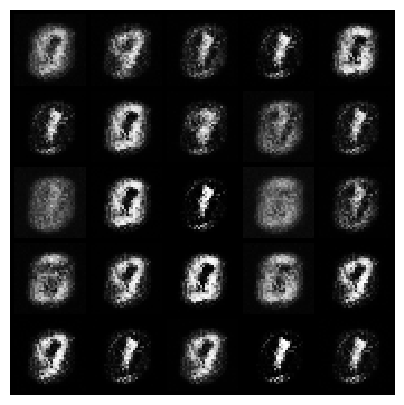

[Epoch 1/200] [Batch 55/938] [D loss: -6.533806] [G loss: -1.821934]


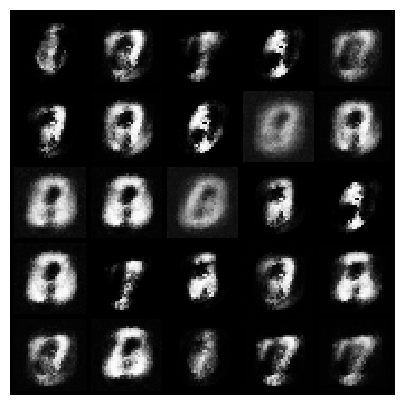

[Epoch 1/200] [Batch 555/938] [D loss: -5.675086] [G loss: 2.142114]


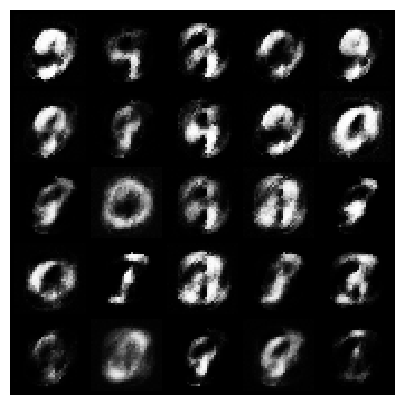

[Epoch 2/200] [Batch 115/938] [D loss: -5.373306] [G loss: 4.508393]


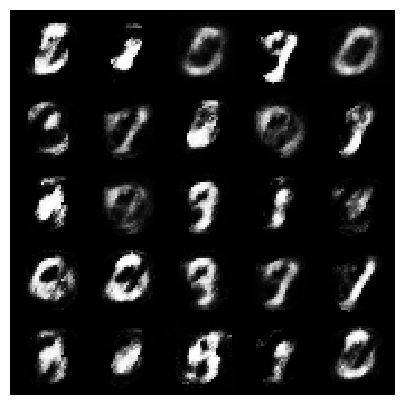

[Epoch 2/200] [Batch 615/938] [D loss: -6.001595] [G loss: 1.841295]


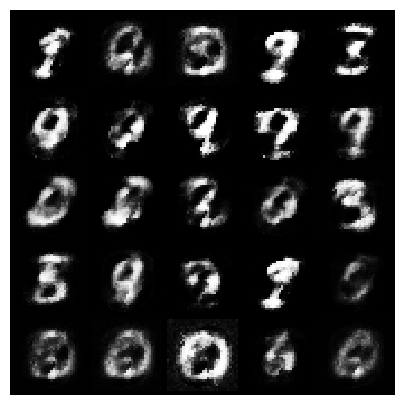

[Epoch 3/200] [Batch 175/938] [D loss: -5.547539] [G loss: 1.946583]


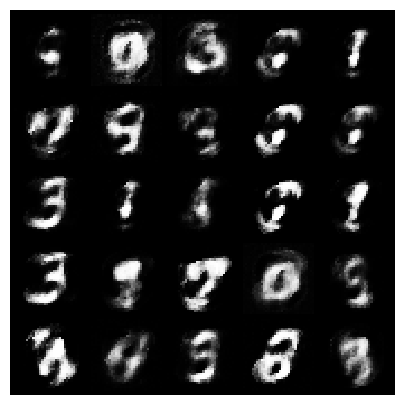

[Epoch 3/200] [Batch 675/938] [D loss: -4.720068] [G loss: 0.249681]


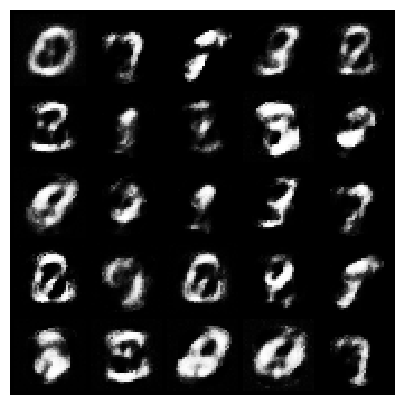

[Epoch 4/200] [Batch 235/938] [D loss: -5.027807] [G loss: 1.953254]


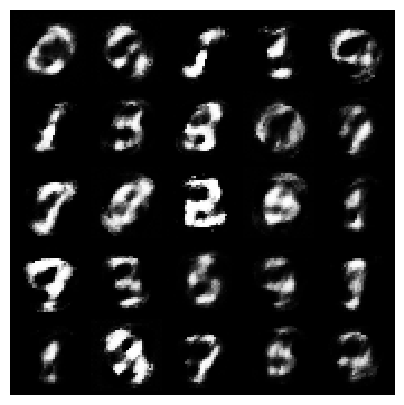

[Epoch 4/200] [Batch 735/938] [D loss: -4.765831] [G loss: 0.363051]


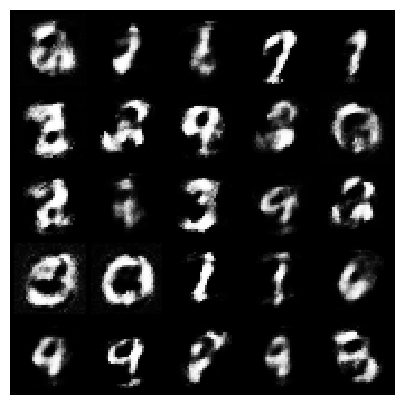

[Epoch 5/200] [Batch 295/938] [D loss: -4.854273] [G loss: 1.792116]


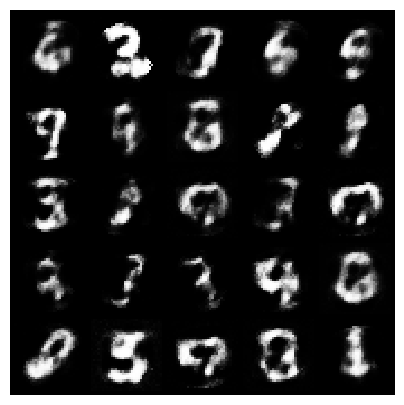

[Epoch 5/200] [Batch 795/938] [D loss: -4.726863] [G loss: 1.174153]


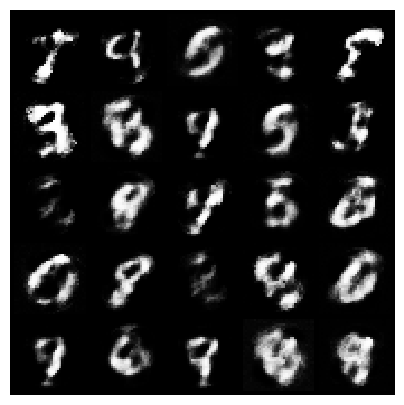

[Epoch 6/200] [Batch 355/938] [D loss: -4.249152] [G loss: 1.477785]


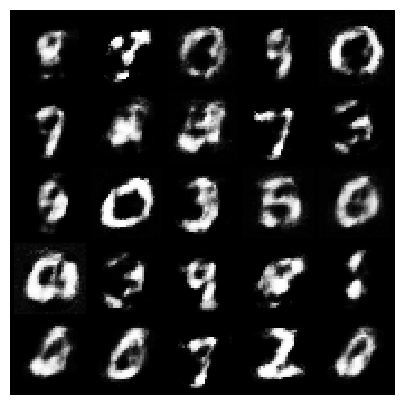

[Epoch 6/200] [Batch 855/938] [D loss: -4.191714] [G loss: 0.990290]


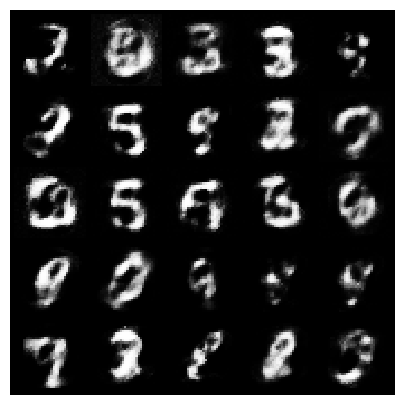

[Epoch 7/200] [Batch 415/938] [D loss: -3.958335] [G loss: -0.108666]


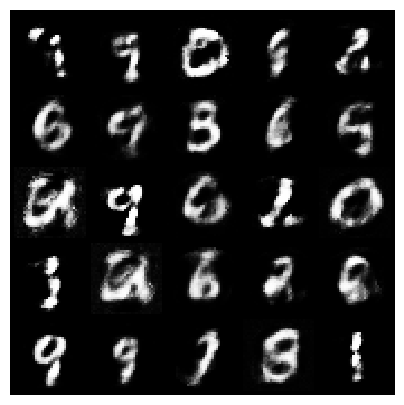

[Epoch 7/200] [Batch 915/938] [D loss: -3.909771] [G loss: 1.523031]


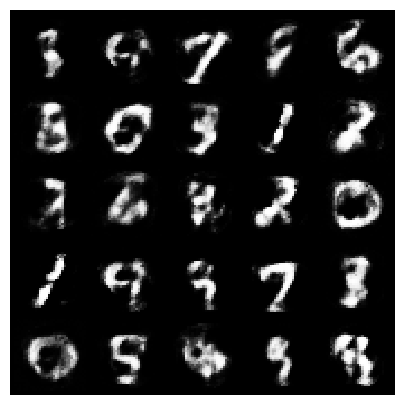

[Epoch 8/200] [Batch 475/938] [D loss: -3.805450] [G loss: 0.666671]


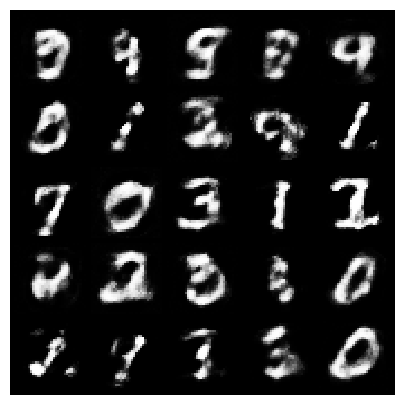

[Epoch 9/200] [Batch 35/938] [D loss: -3.562023] [G loss: 0.515245]


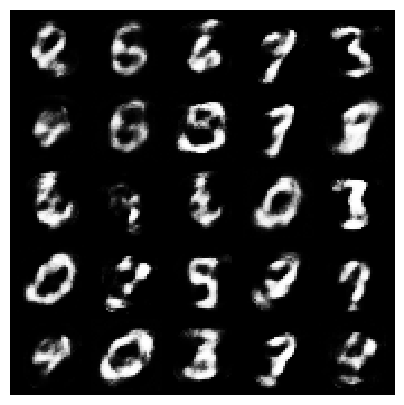

[Epoch 9/200] [Batch 535/938] [D loss: -3.791417] [G loss: 0.829473]


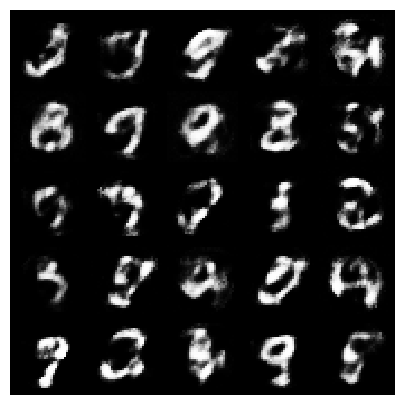

[Epoch 10/200] [Batch 95/938] [D loss: -3.313351] [G loss: 0.455816]


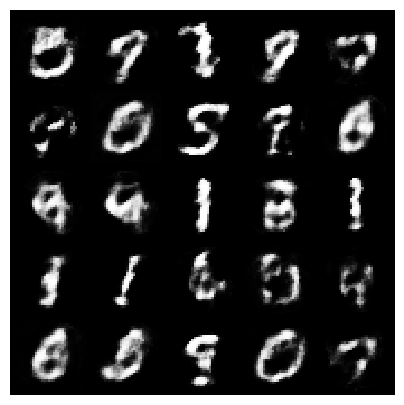

[Epoch 10/200] [Batch 595/938] [D loss: -3.170157] [G loss: 0.493935]


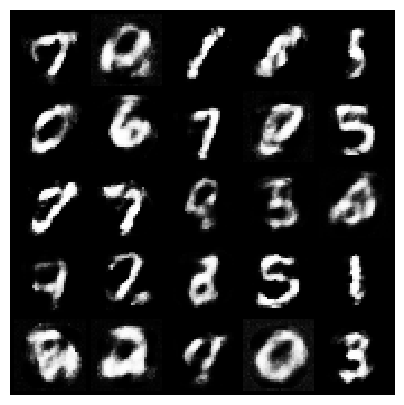

[Epoch 11/200] [Batch 155/938] [D loss: -3.545763] [G loss: -0.303964]


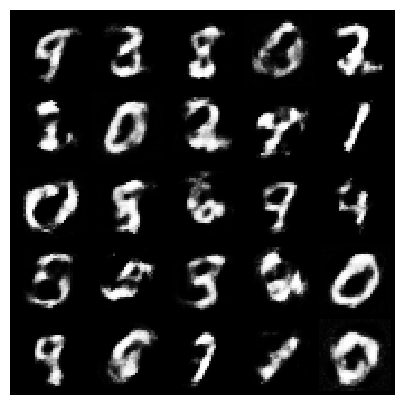

[Epoch 11/200] [Batch 655/938] [D loss: -3.099353] [G loss: 0.020123]


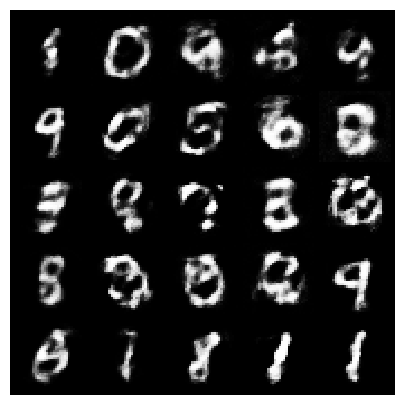

[Epoch 12/200] [Batch 215/938] [D loss: -2.824982] [G loss: -1.505152]


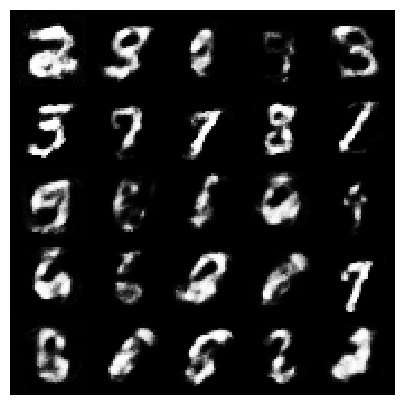

[Epoch 12/200] [Batch 715/938] [D loss: -2.848195] [G loss: 0.517332]


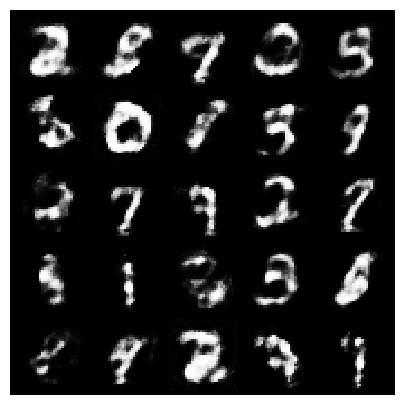

[Epoch 13/200] [Batch 275/938] [D loss: -3.104032] [G loss: 0.927762]


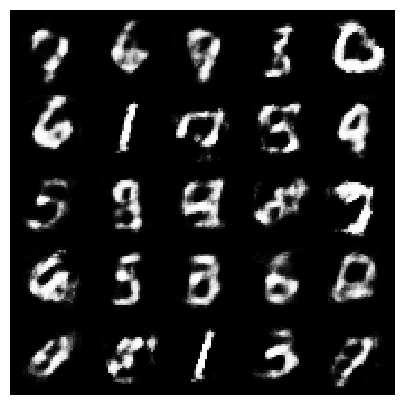

[Epoch 13/200] [Batch 775/938] [D loss: -2.727995] [G loss: 0.779378]


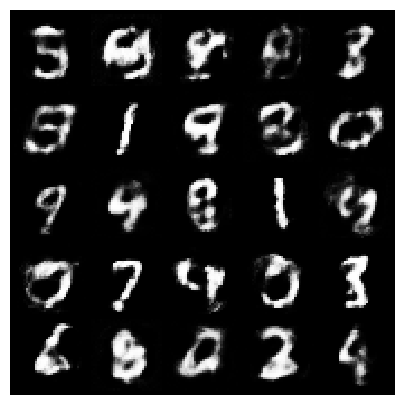

[Epoch 14/200] [Batch 335/938] [D loss: -2.283688] [G loss: -0.958192]


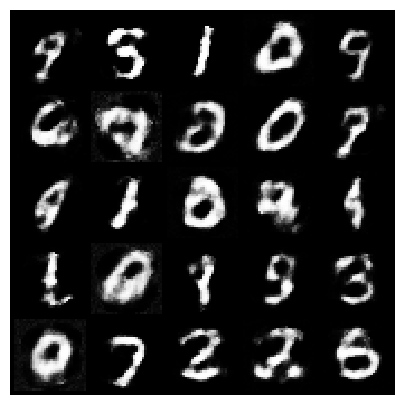

[Epoch 14/200] [Batch 835/938] [D loss: -2.306985] [G loss: 0.039099]


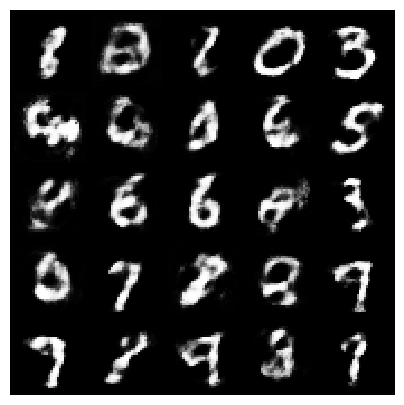

[Epoch 15/200] [Batch 395/938] [D loss: -2.308799] [G loss: -0.245880]


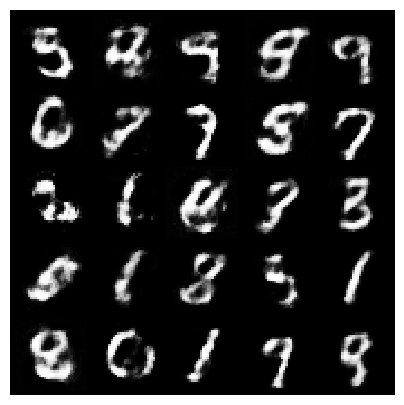

[Epoch 15/200] [Batch 895/938] [D loss: -2.636797] [G loss: -1.603416]


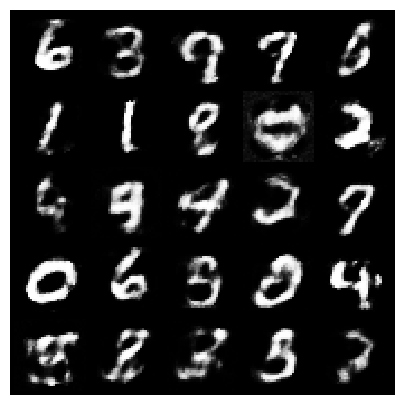

[Epoch 16/200] [Batch 455/938] [D loss: -2.630140] [G loss: -0.974930]


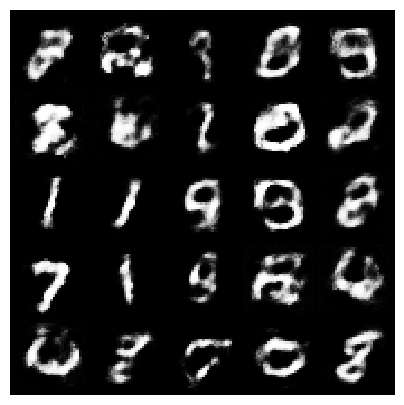

[Epoch 17/200] [Batch 15/938] [D loss: -2.408979] [G loss: -0.938786]


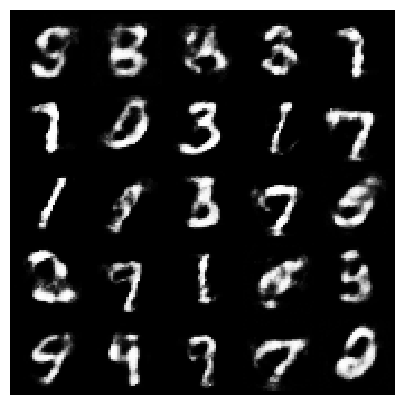

[Epoch 17/200] [Batch 515/938] [D loss: -2.341367] [G loss: -0.731354]


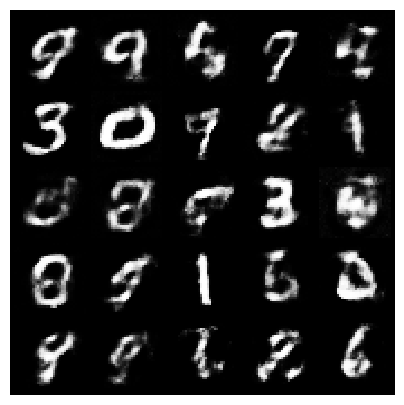

[Epoch 18/200] [Batch 75/938] [D loss: -2.986526] [G loss: -0.541901]


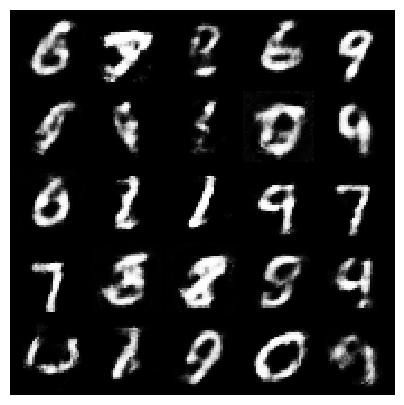

[Epoch 18/200] [Batch 575/938] [D loss: -2.261356] [G loss: -0.842963]


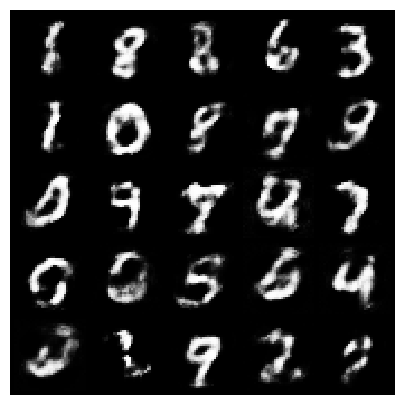

[Epoch 19/200] [Batch 135/938] [D loss: -2.225589] [G loss: -2.076638]


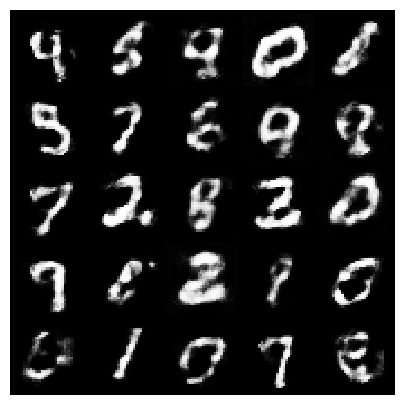

[Epoch 19/200] [Batch 635/938] [D loss: -2.756353] [G loss: -0.735162]


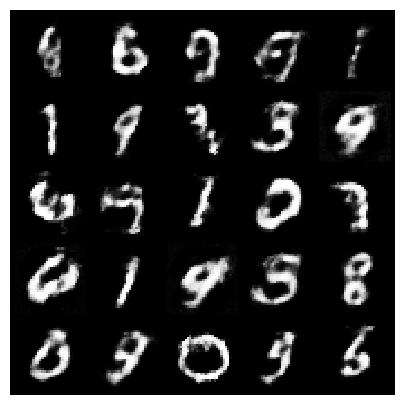

[Epoch 20/200] [Batch 195/938] [D loss: -2.662815] [G loss: -2.277314]


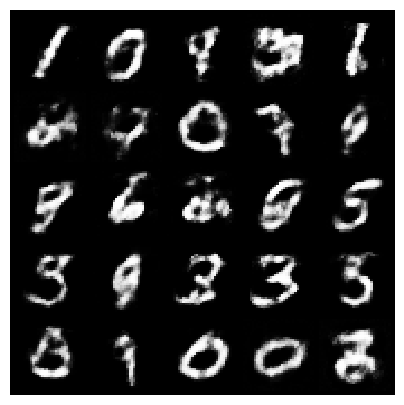

[Epoch 20/200] [Batch 695/938] [D loss: -1.822681] [G loss: -0.791862]


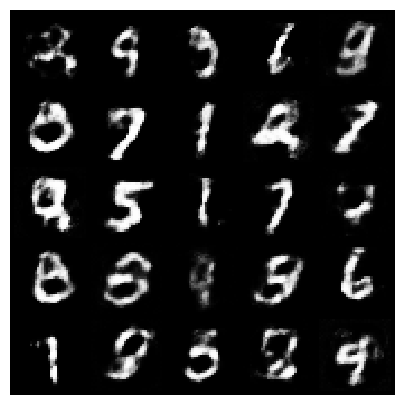

[Epoch 21/200] [Batch 255/938] [D loss: -2.171637] [G loss: -0.713425]


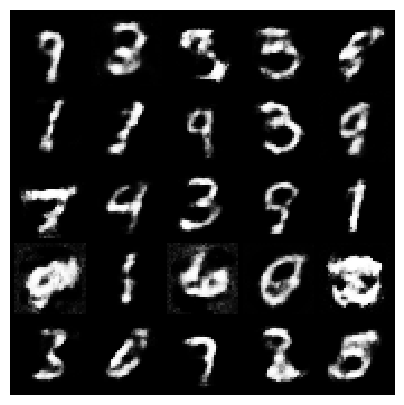

[Epoch 21/200] [Batch 755/938] [D loss: -2.010374] [G loss: -0.550996]


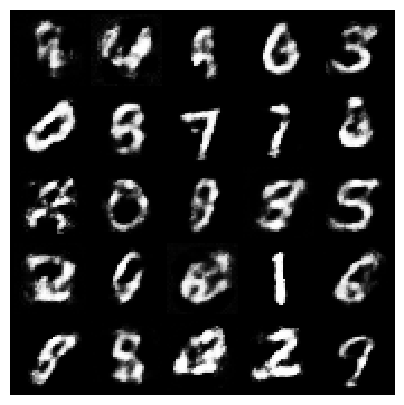

[Epoch 22/200] [Batch 315/938] [D loss: -1.997166] [G loss: -0.360211]


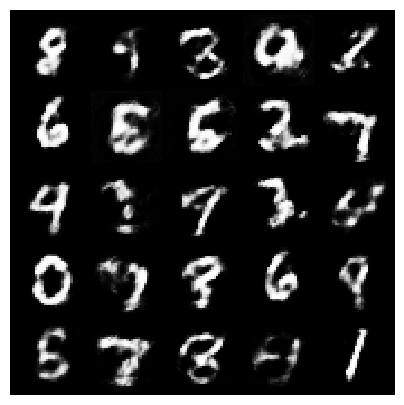

[Epoch 22/200] [Batch 815/938] [D loss: -2.047423] [G loss: -0.818472]


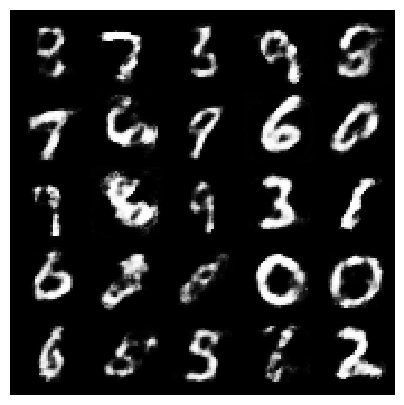

[Epoch 23/200] [Batch 375/938] [D loss: -2.301818] [G loss: -1.871101]


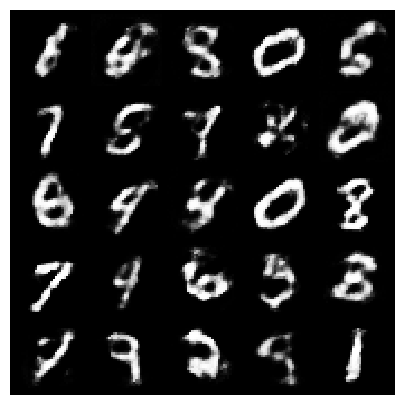

[Epoch 23/200] [Batch 875/938] [D loss: -1.633688] [G loss: -1.113721]


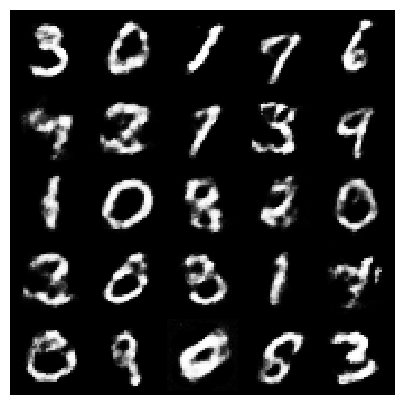

[Epoch 24/200] [Batch 435/938] [D loss: -2.126776] [G loss: -0.615240]


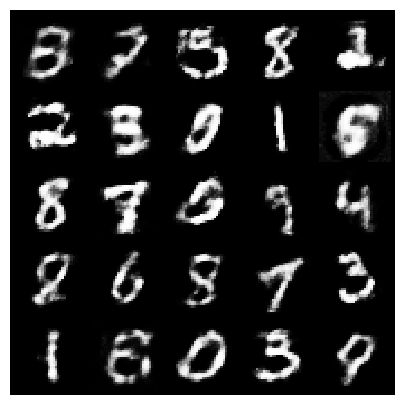

[Epoch 24/200] [Batch 935/938] [D loss: -2.018353] [G loss: -1.764019]


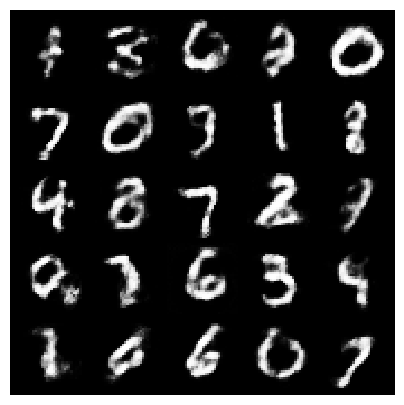

[Epoch 25/200] [Batch 495/938] [D loss: -2.124229] [G loss: -2.142159]


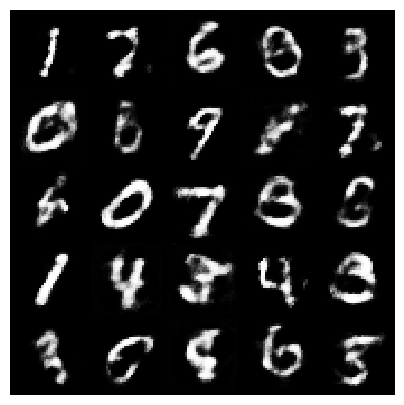

[Epoch 26/200] [Batch 55/938] [D loss: -2.192113] [G loss: -2.221200]


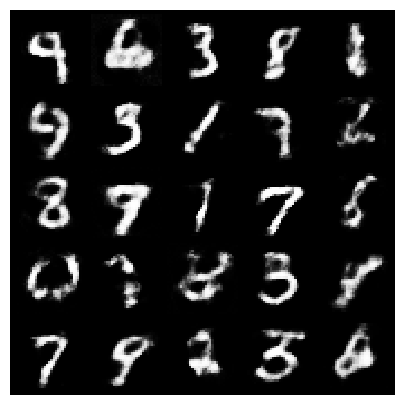

[Epoch 26/200] [Batch 555/938] [D loss: -2.161651] [G loss: -1.408295]


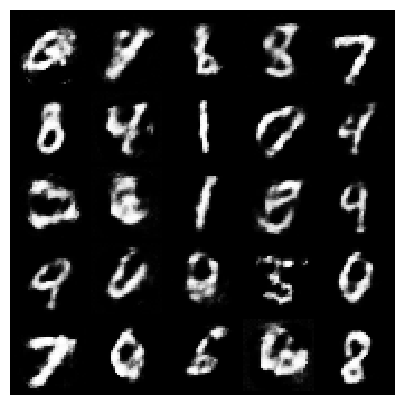

[Epoch 27/200] [Batch 115/938] [D loss: -1.910751] [G loss: -2.596219]


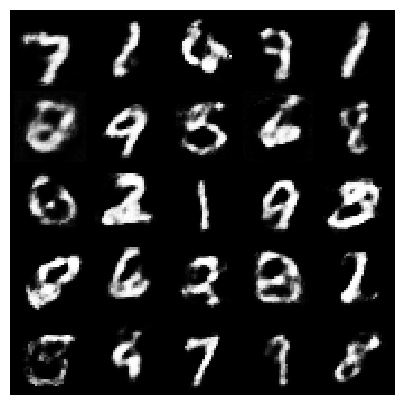

[Epoch 27/200] [Batch 615/938] [D loss: -1.954163] [G loss: -0.561856]


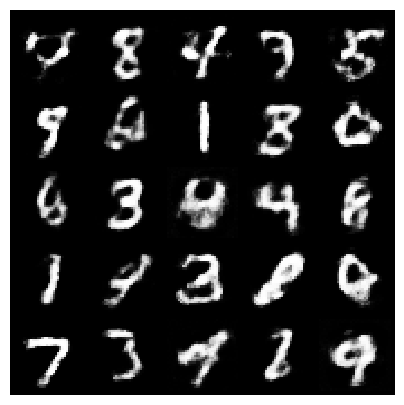

[Epoch 28/200] [Batch 175/938] [D loss: -1.783060] [G loss: -1.146479]


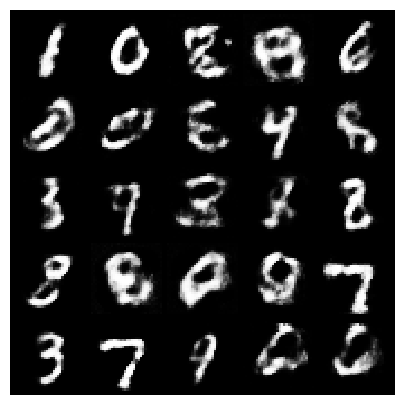

[Epoch 28/200] [Batch 675/938] [D loss: -1.890752] [G loss: -1.510254]


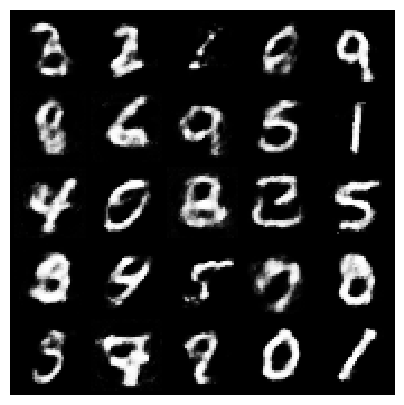

[Epoch 29/200] [Batch 235/938] [D loss: -1.729905] [G loss: -2.872129]


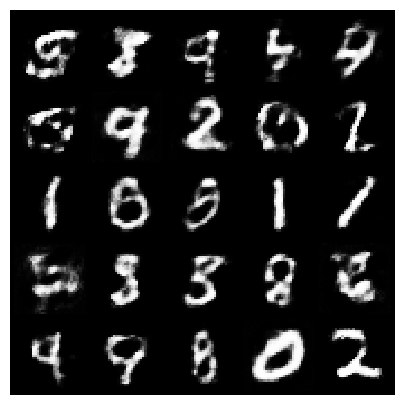

[Epoch 29/200] [Batch 735/938] [D loss: -1.443268] [G loss: -1.818271]


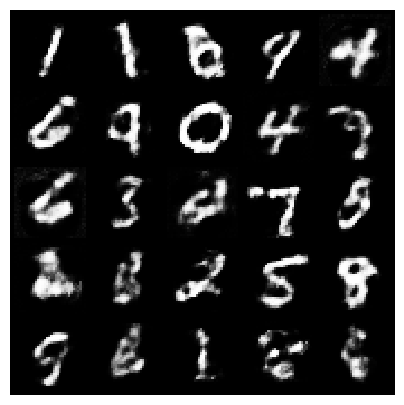

[Epoch 30/200] [Batch 295/938] [D loss: -2.310466] [G loss: -2.127788]


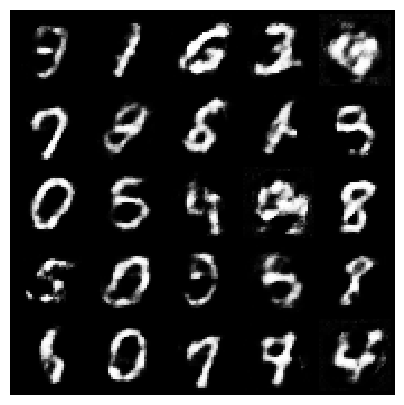

[Epoch 30/200] [Batch 795/938] [D loss: -2.210811] [G loss: -1.633660]


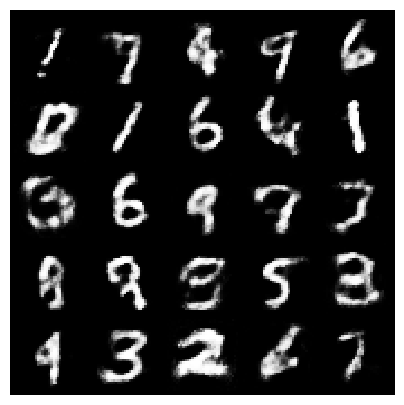

[Epoch 31/200] [Batch 355/938] [D loss: -2.143841] [G loss: -0.936354]


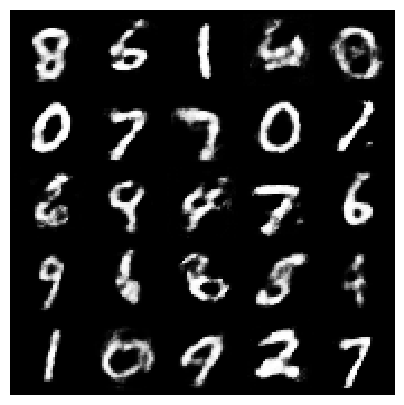

[Epoch 31/200] [Batch 855/938] [D loss: -1.554125] [G loss: -1.463887]


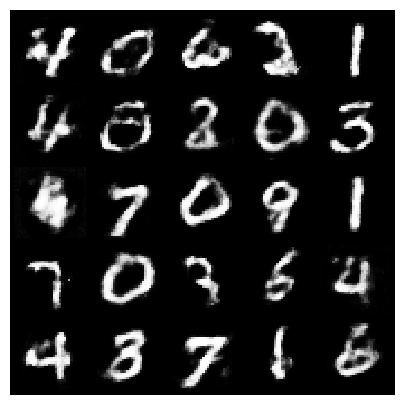

[Epoch 32/200] [Batch 415/938] [D loss: -1.515446] [G loss: -2.749323]


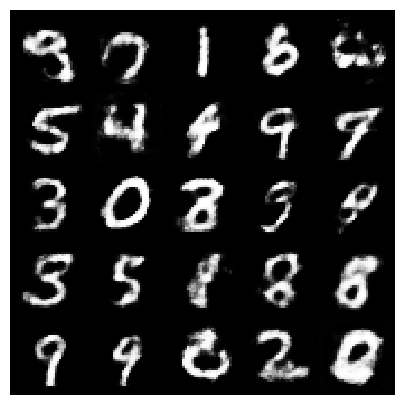

[Epoch 32/200] [Batch 915/938] [D loss: -1.692172] [G loss: -2.198545]


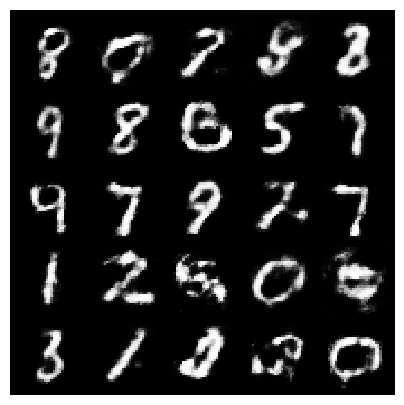

[Epoch 33/200] [Batch 475/938] [D loss: -1.281048] [G loss: -2.482497]


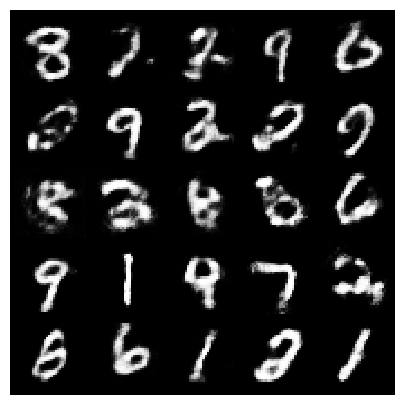

[Epoch 34/200] [Batch 35/938] [D loss: -1.094136] [G loss: -1.138736]


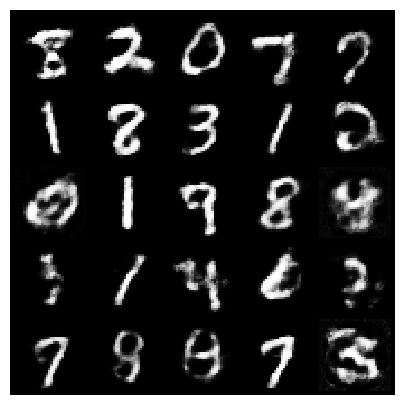

[Epoch 34/200] [Batch 535/938] [D loss: -1.443860] [G loss: -1.693538]


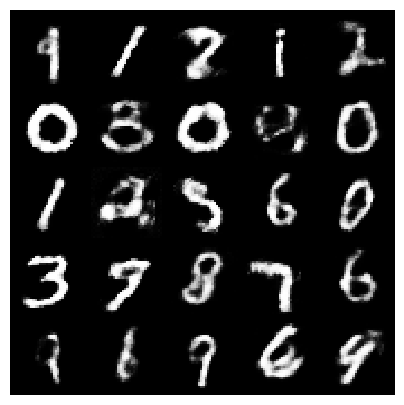

[Epoch 35/200] [Batch 95/938] [D loss: -1.518923] [G loss: -2.207454]


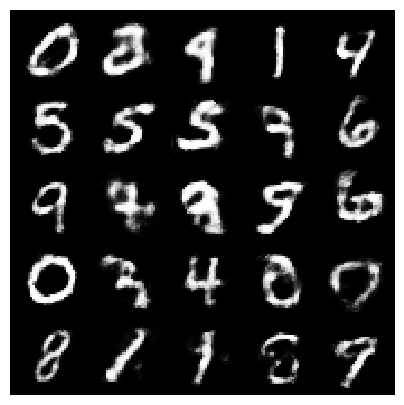

[Epoch 35/200] [Batch 595/938] [D loss: -1.437592] [G loss: -2.044511]


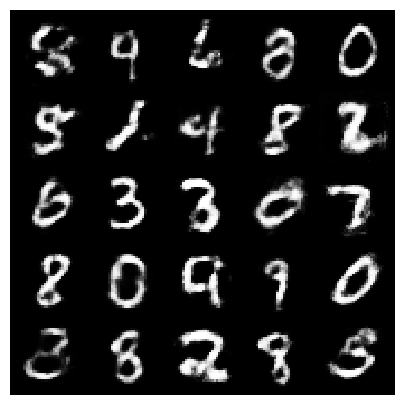

[Epoch 36/200] [Batch 155/938] [D loss: -1.493487] [G loss: -1.638862]


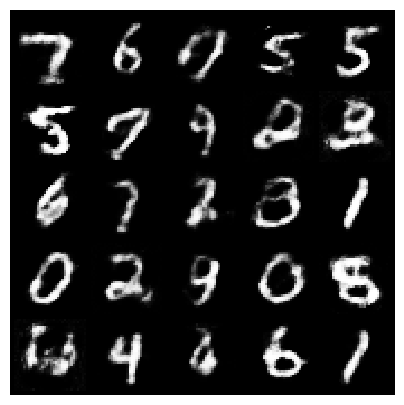

[Epoch 36/200] [Batch 655/938] [D loss: -1.161801] [G loss: -1.842945]


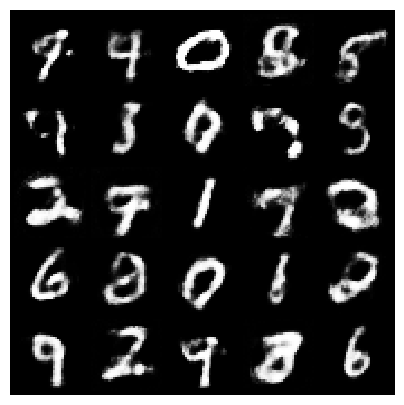

[Epoch 37/200] [Batch 215/938] [D loss: -1.942515] [G loss: -1.057643]


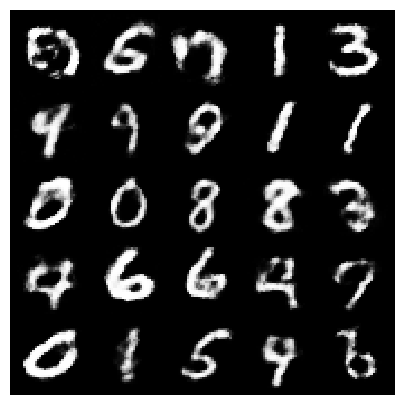

[Epoch 37/200] [Batch 715/938] [D loss: -1.572713] [G loss: -1.255176]


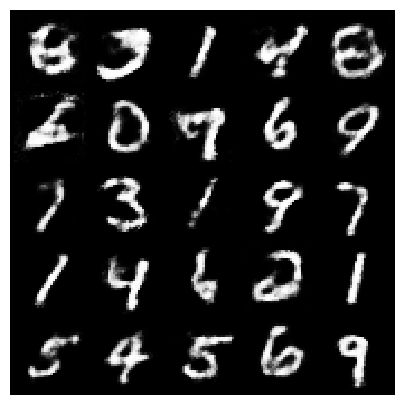

[Epoch 38/200] [Batch 275/938] [D loss: -2.023910] [G loss: -1.734341]


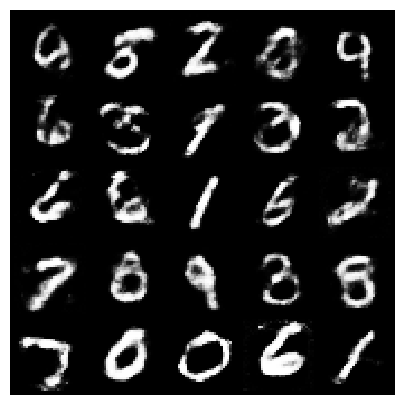

[Epoch 38/200] [Batch 775/938] [D loss: -1.595435] [G loss: -1.701696]


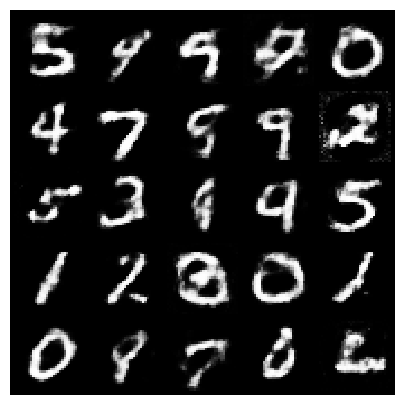

[Epoch 39/200] [Batch 335/938] [D loss: -1.822991] [G loss: -1.431123]


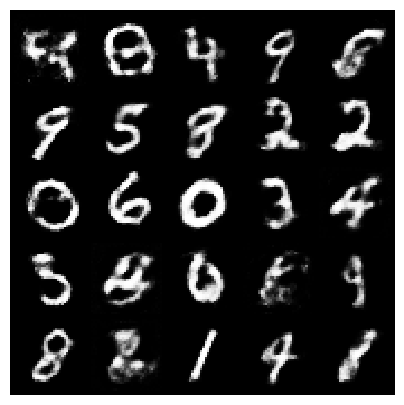

[Epoch 39/200] [Batch 835/938] [D loss: -1.566329] [G loss: -1.564935]


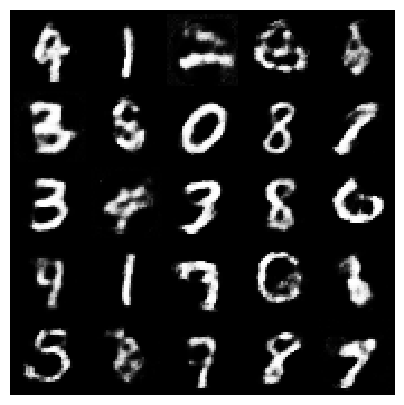

[Epoch 40/200] [Batch 395/938] [D loss: -1.506294] [G loss: -1.865996]


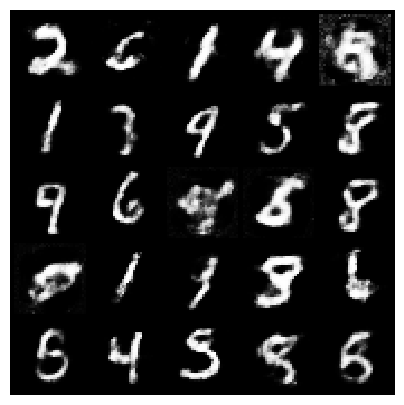

[Epoch 40/200] [Batch 895/938] [D loss: -1.153500] [G loss: -2.831337]


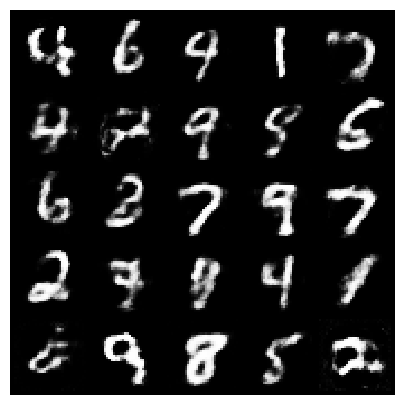

[Epoch 41/200] [Batch 455/938] [D loss: -1.483339] [G loss: -1.937383]


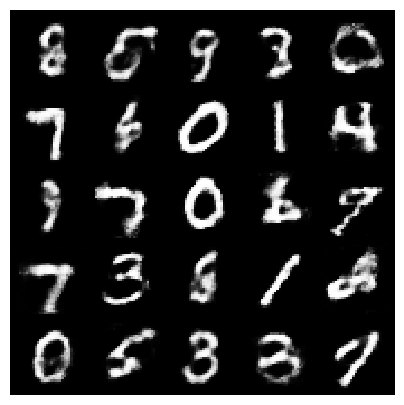

[Epoch 42/200] [Batch 15/938] [D loss: -1.351218] [G loss: -2.292270]


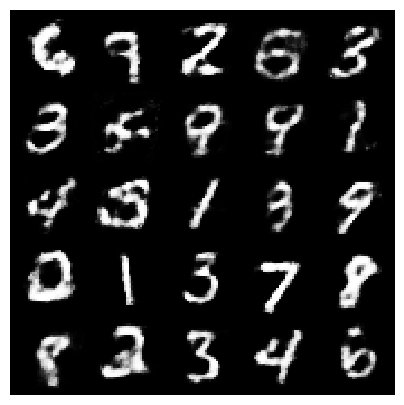

[Epoch 42/200] [Batch 515/938] [D loss: -1.356298] [G loss: -2.259206]


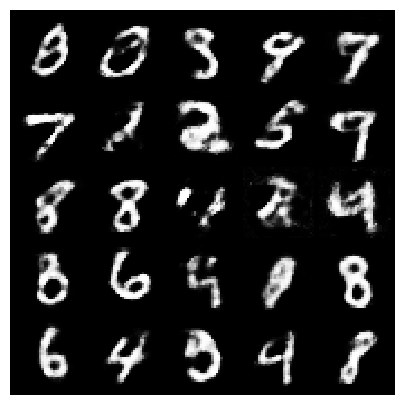

[Epoch 43/200] [Batch 75/938] [D loss: -1.706915] [G loss: -2.804832]


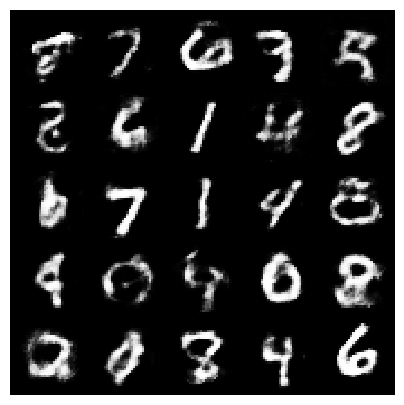

[Epoch 43/200] [Batch 575/938] [D loss: -1.577641] [G loss: -2.025704]


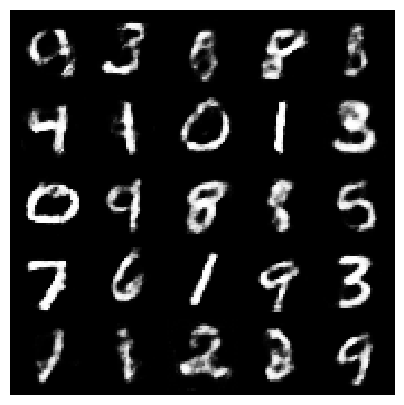

[Epoch 44/200] [Batch 135/938] [D loss: -1.652908] [G loss: -1.174088]


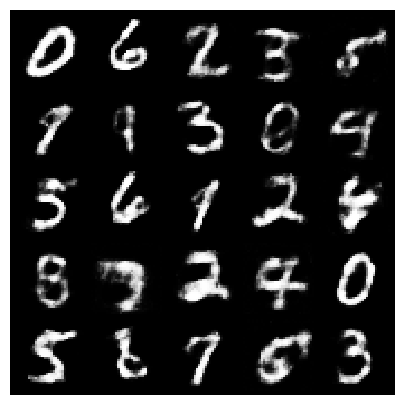

[Epoch 44/200] [Batch 635/938] [D loss: -1.367137] [G loss: -2.100537]


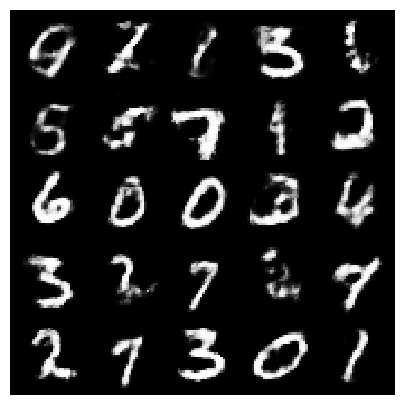

[Epoch 45/200] [Batch 195/938] [D loss: -1.595993] [G loss: -0.238385]


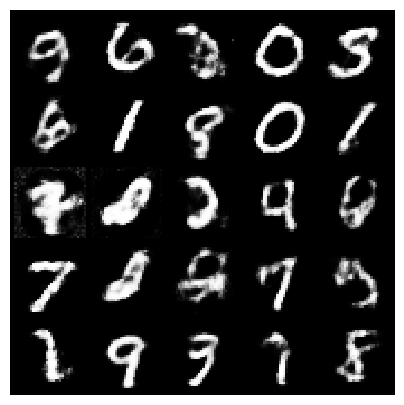

[Epoch 45/200] [Batch 695/938] [D loss: -1.163649] [G loss: -2.233020]


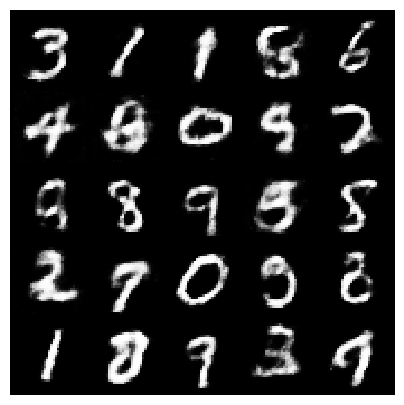

[Epoch 46/200] [Batch 255/938] [D loss: -1.873402] [G loss: -2.178252]


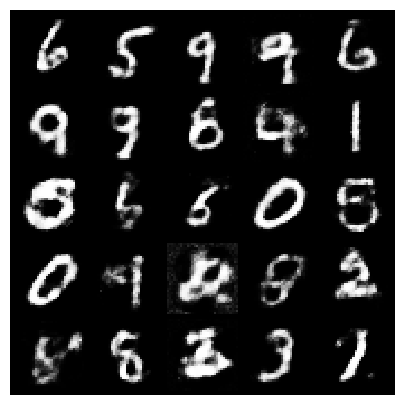

[Epoch 46/200] [Batch 755/938] [D loss: -1.409281] [G loss: -0.913324]


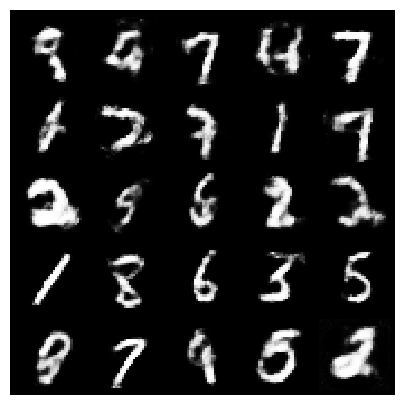

[Epoch 47/200] [Batch 315/938] [D loss: -1.493825] [G loss: -3.027000]


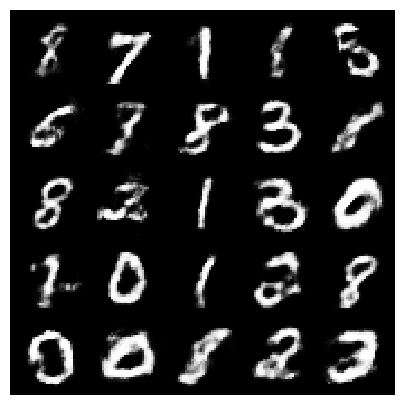

[Epoch 47/200] [Batch 815/938] [D loss: -1.640578] [G loss: -2.278514]


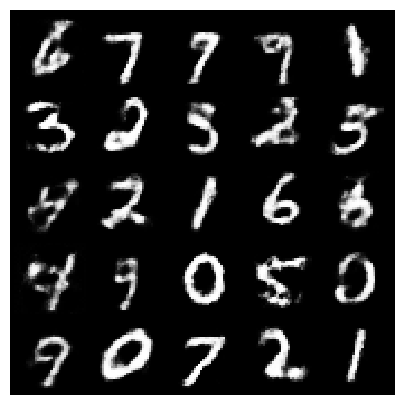

[Epoch 48/200] [Batch 375/938] [D loss: -1.594734] [G loss: -1.074706]


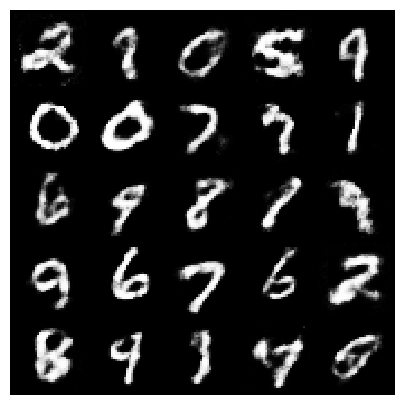

[Epoch 48/200] [Batch 875/938] [D loss: -1.097786] [G loss: -0.575191]


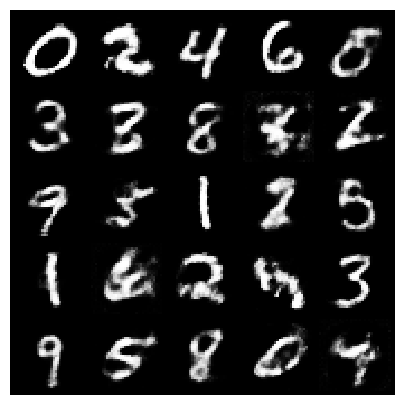

[Epoch 49/200] [Batch 435/938] [D loss: -1.005488] [G loss: -1.689448]


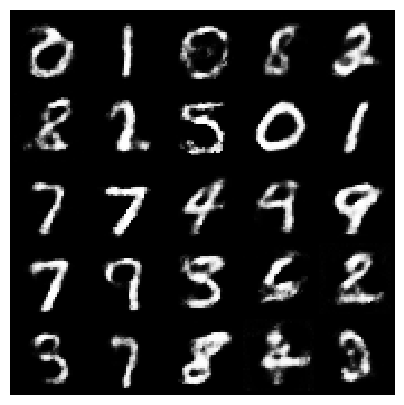

[Epoch 49/200] [Batch 935/938] [D loss: -0.899999] [G loss: -2.744441]


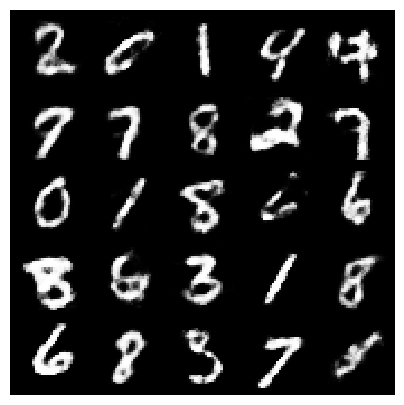

[Epoch 50/200] [Batch 495/938] [D loss: -1.371267] [G loss: -0.601206]


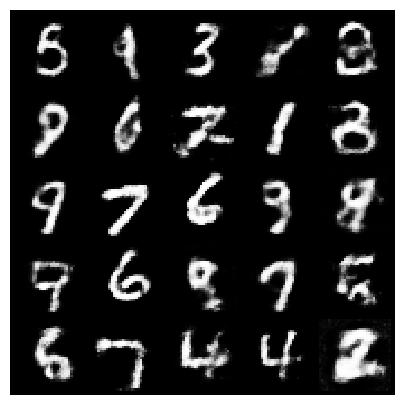

[Epoch 51/200] [Batch 55/938] [D loss: -1.123760] [G loss: -1.022328]


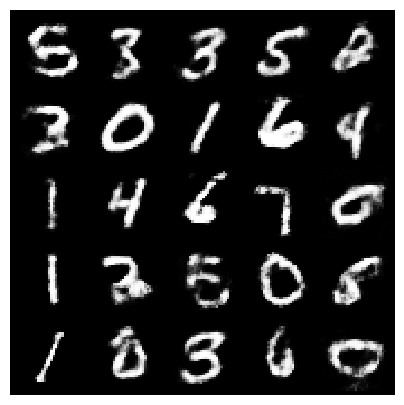

[Epoch 51/200] [Batch 555/938] [D loss: -1.587856] [G loss: -0.897285]


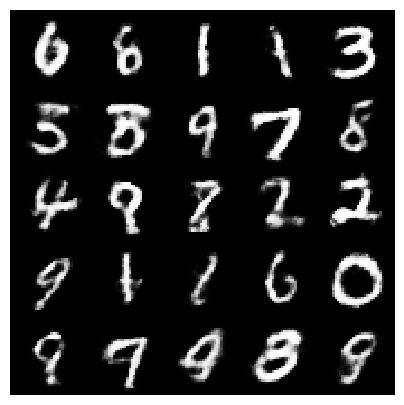

[Epoch 52/200] [Batch 115/938] [D loss: -1.050851] [G loss: -2.883512]


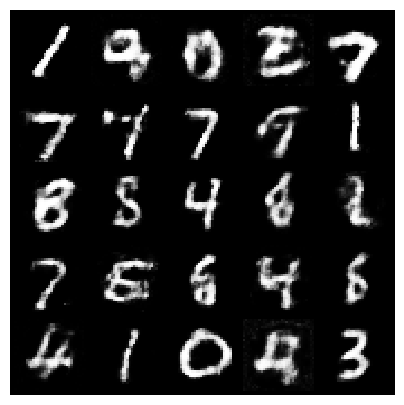

[Epoch 52/200] [Batch 615/938] [D loss: -1.382175] [G loss: -2.989875]


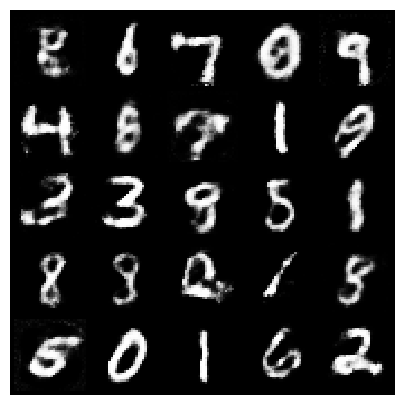

[Epoch 53/200] [Batch 175/938] [D loss: -1.231137] [G loss: -2.110753]


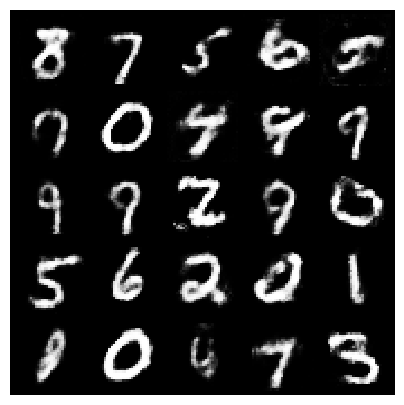

[Epoch 53/200] [Batch 675/938] [D loss: -1.104001] [G loss: -2.025751]


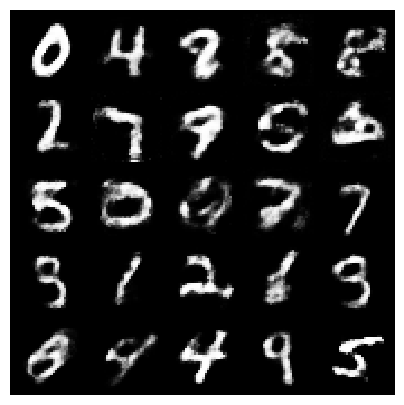

[Epoch 54/200] [Batch 235/938] [D loss: -1.329314] [G loss: -2.837082]


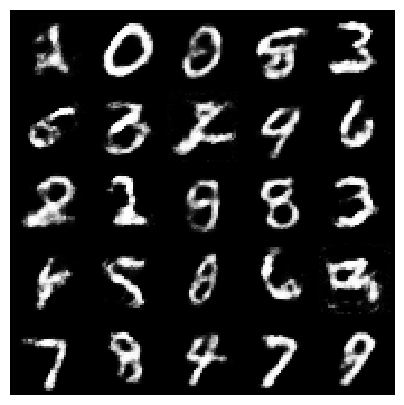

[Epoch 54/200] [Batch 735/938] [D loss: -1.164895] [G loss: -1.165586]


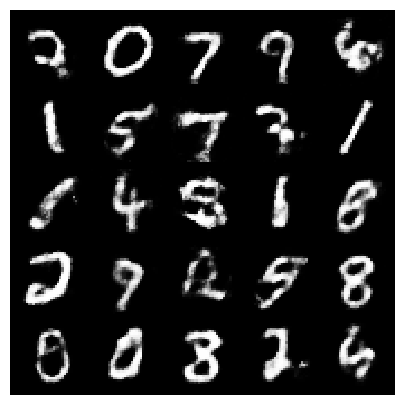

[Epoch 55/200] [Batch 295/938] [D loss: -1.184559] [G loss: -2.000885]


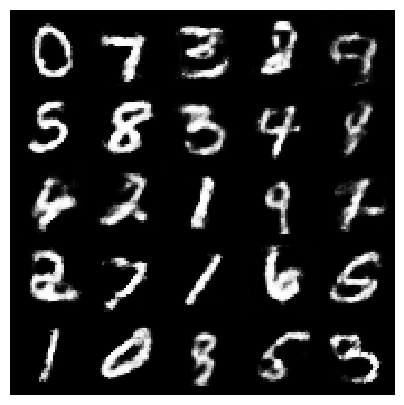

[Epoch 55/200] [Batch 795/938] [D loss: -1.134430] [G loss: -1.178756]


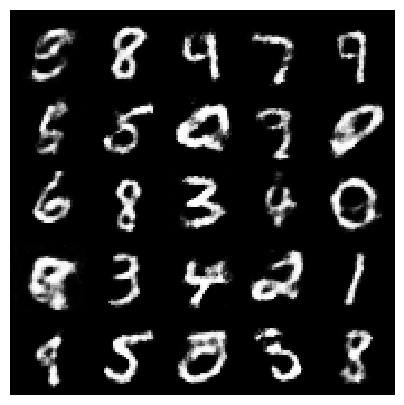

[Epoch 56/200] [Batch 355/938] [D loss: -1.473899] [G loss: -1.700959]


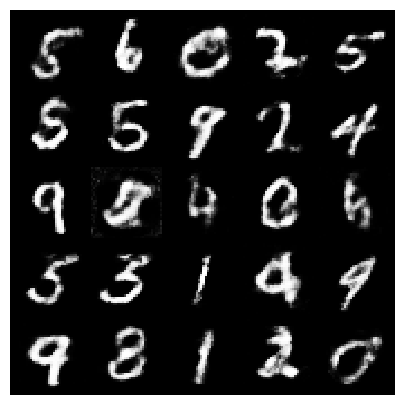

[Epoch 56/200] [Batch 855/938] [D loss: -1.402003] [G loss: -0.928401]


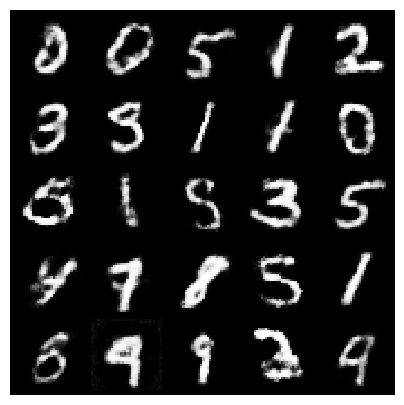

[Epoch 57/200] [Batch 415/938] [D loss: -1.382397] [G loss: -2.072421]


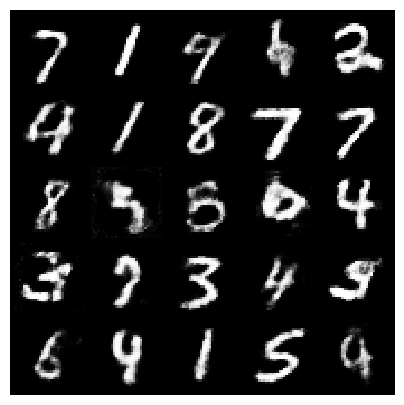

[Epoch 57/200] [Batch 915/938] [D loss: -1.360805] [G loss: -2.371510]


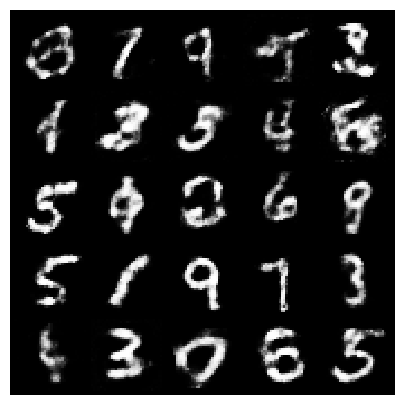

[Epoch 58/200] [Batch 475/938] [D loss: -1.410057] [G loss: 0.188352]


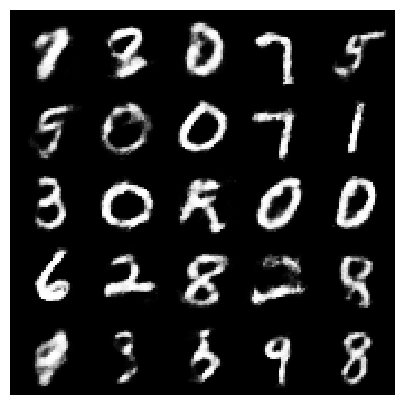

[Epoch 59/200] [Batch 35/938] [D loss: -1.101570] [G loss: -2.417729]


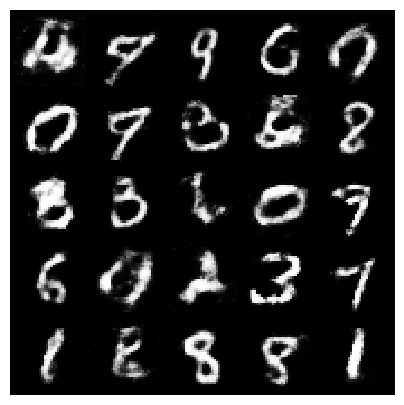

[Epoch 59/200] [Batch 535/938] [D loss: -1.024970] [G loss: -0.249592]


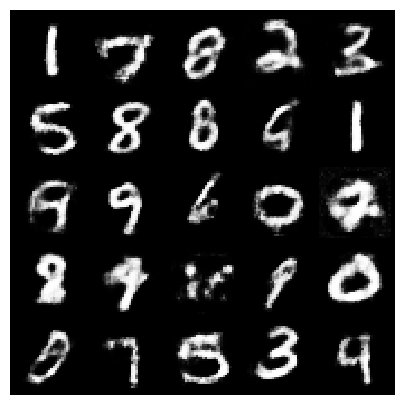

[Epoch 60/200] [Batch 95/938] [D loss: -0.987054] [G loss: -1.034659]


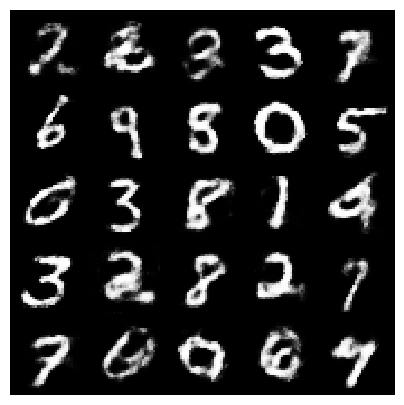

[Epoch 60/200] [Batch 595/938] [D loss: -1.639288] [G loss: -2.491226]


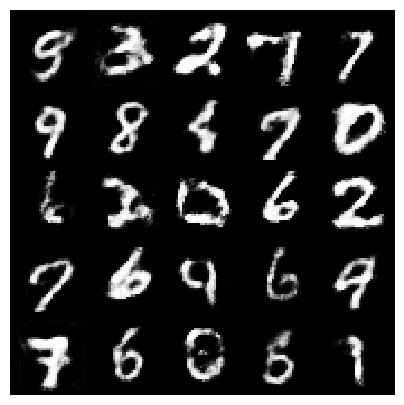

[Epoch 61/200] [Batch 155/938] [D loss: -1.534518] [G loss: -1.788675]


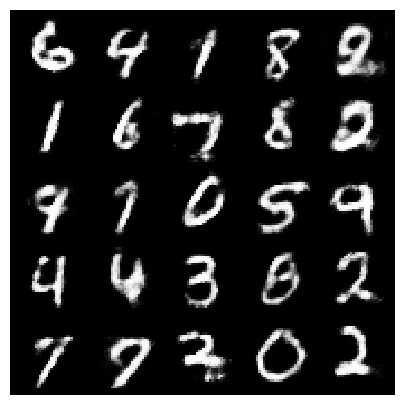

[Epoch 61/200] [Batch 655/938] [D loss: -1.060407] [G loss: -1.826926]


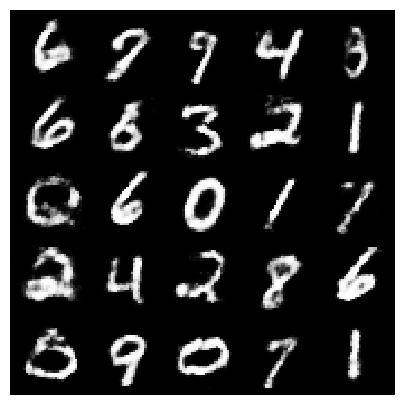

[Epoch 62/200] [Batch 215/938] [D loss: -1.105064] [G loss: -2.371537]


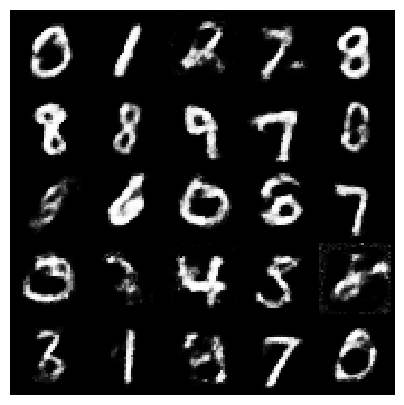

[Epoch 62/200] [Batch 715/938] [D loss: -1.006558] [G loss: -1.257124]


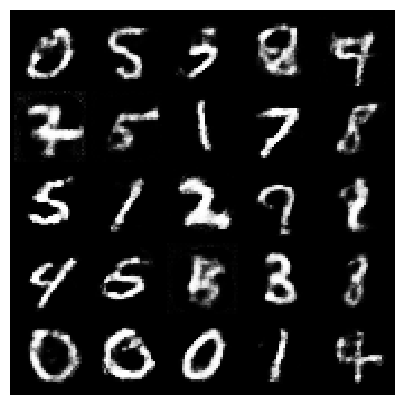

[Epoch 63/200] [Batch 275/938] [D loss: -1.114453] [G loss: -1.976900]


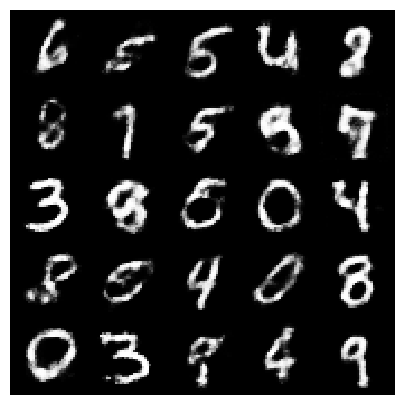

[Epoch 63/200] [Batch 775/938] [D loss: -1.338522] [G loss: -1.034828]


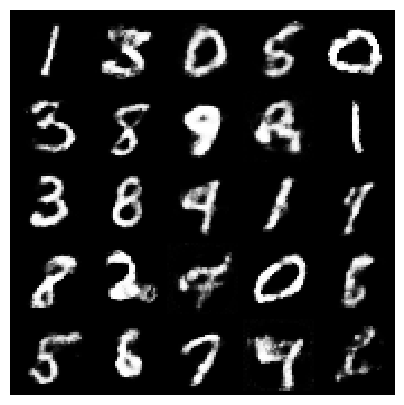

[Epoch 64/200] [Batch 335/938] [D loss: -1.198115] [G loss: -1.352307]


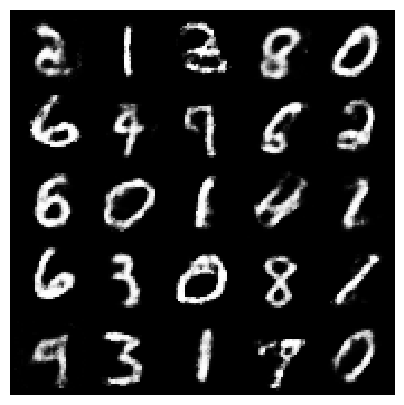

[Epoch 64/200] [Batch 835/938] [D loss: -1.060944] [G loss: -0.461261]


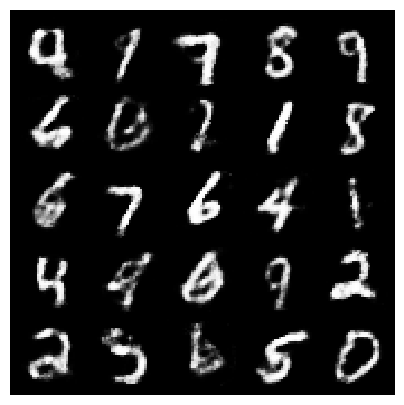

[Epoch 65/200] [Batch 395/938] [D loss: -1.167594] [G loss: -2.492703]


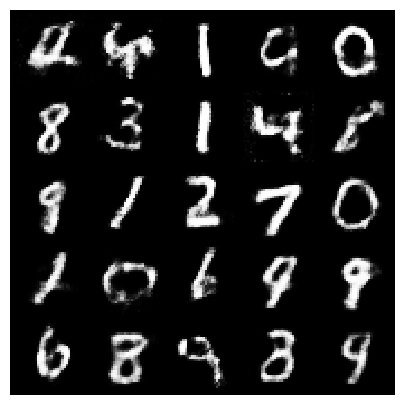

[Epoch 65/200] [Batch 895/938] [D loss: -0.974343] [G loss: -1.908584]


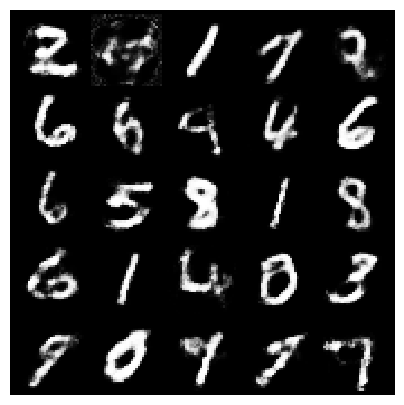

[Epoch 66/200] [Batch 455/938] [D loss: -1.020405] [G loss: -0.600796]


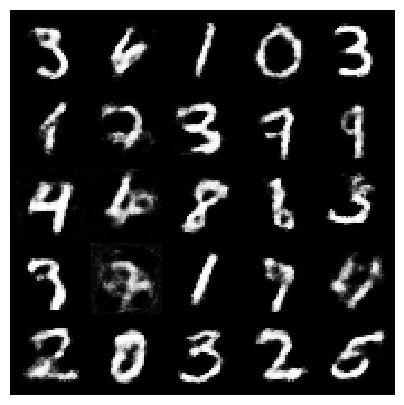

[Epoch 67/200] [Batch 15/938] [D loss: -1.266140] [G loss: -2.866292]


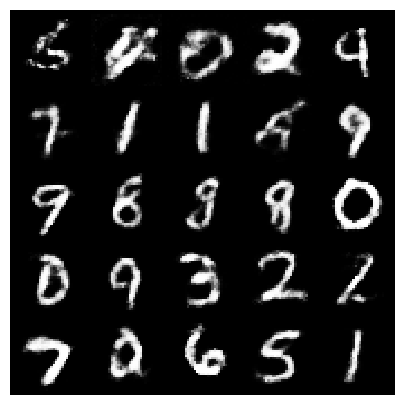

[Epoch 67/200] [Batch 515/938] [D loss: -1.130143] [G loss: -1.232014]


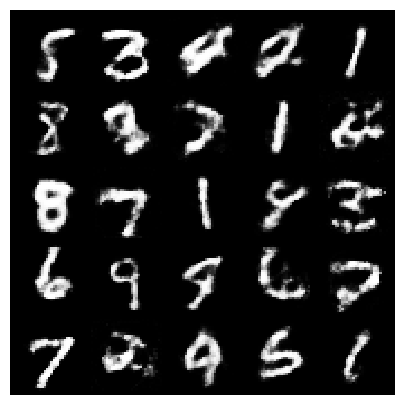

[Epoch 68/200] [Batch 75/938] [D loss: -1.117861] [G loss: -0.531175]


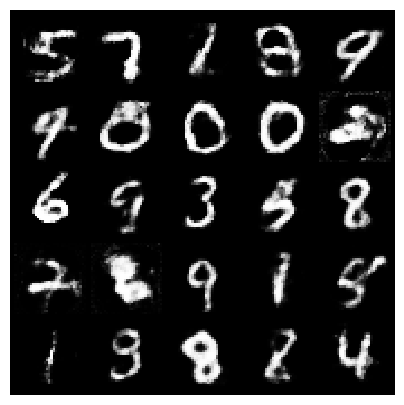

[Epoch 68/200] [Batch 575/938] [D loss: -1.110324] [G loss: -1.570076]


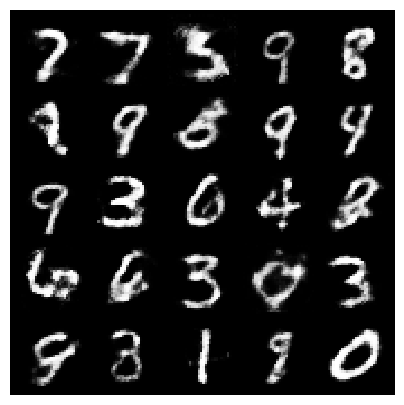

[Epoch 69/200] [Batch 135/938] [D loss: -0.924757] [G loss: -1.730673]


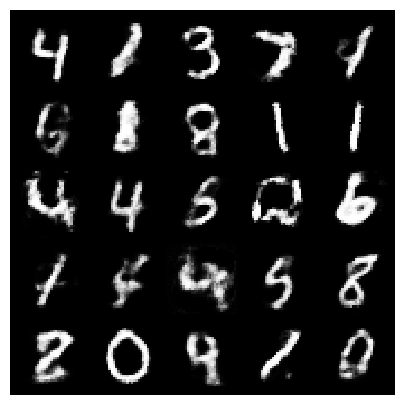

[Epoch 69/200] [Batch 635/938] [D loss: -0.789450] [G loss: -1.117380]


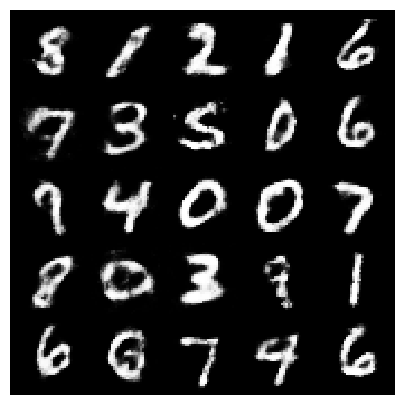

[Epoch 70/200] [Batch 195/938] [D loss: -1.323471] [G loss: -1.066325]


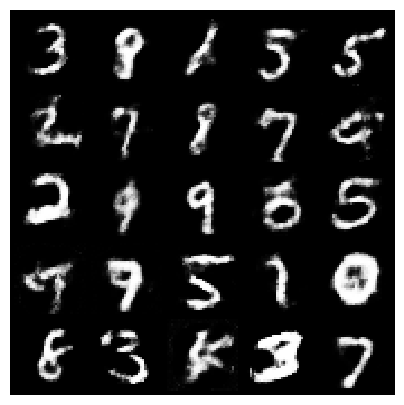

[Epoch 70/200] [Batch 695/938] [D loss: -0.861746] [G loss: -2.565743]


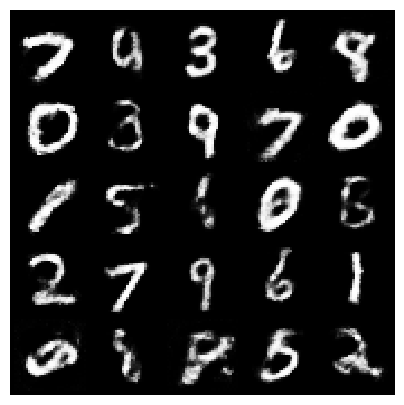

[Epoch 71/200] [Batch 255/938] [D loss: -0.914245] [G loss: -2.209118]


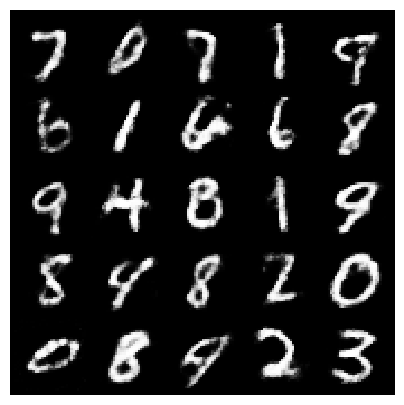

[Epoch 71/200] [Batch 755/938] [D loss: -0.955776] [G loss: -0.961534]


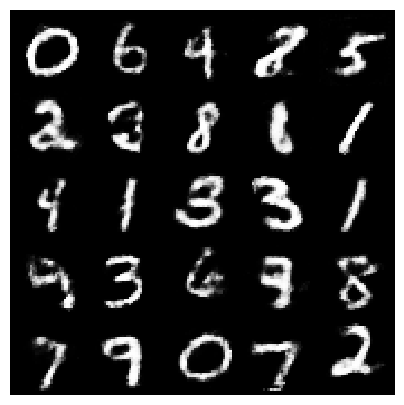

[Epoch 72/200] [Batch 315/938] [D loss: -1.219224] [G loss: -0.314439]


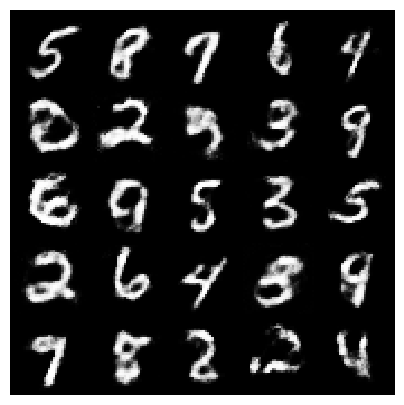

[Epoch 72/200] [Batch 815/938] [D loss: -1.263531] [G loss: -1.706788]


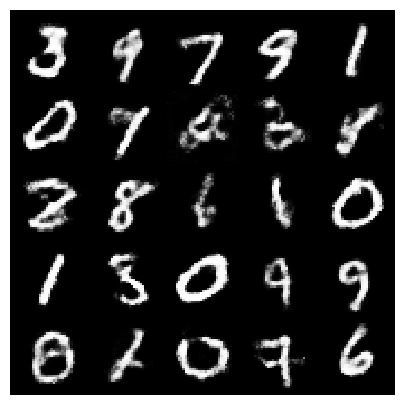

[Epoch 73/200] [Batch 375/938] [D loss: -1.231722] [G loss: -1.175697]


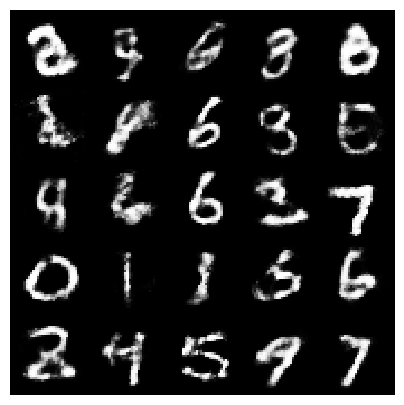

[Epoch 73/200] [Batch 875/938] [D loss: -0.830814] [G loss: -0.712319]


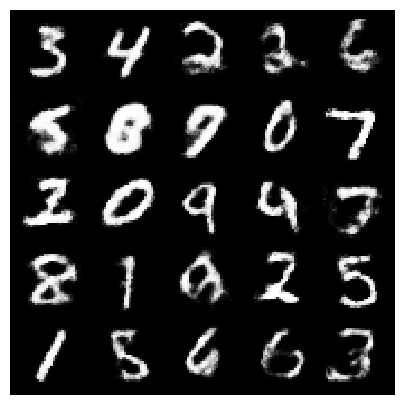

[Epoch 74/200] [Batch 435/938] [D loss: -0.940859] [G loss: -1.477905]


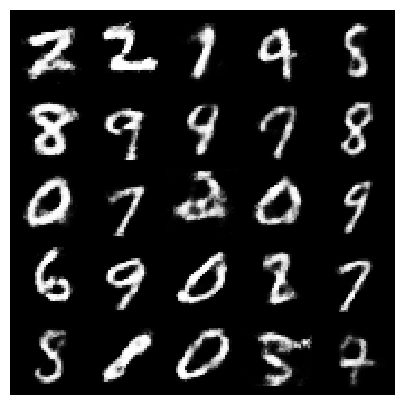

[Epoch 74/200] [Batch 935/938] [D loss: -1.481462] [G loss: -1.719068]


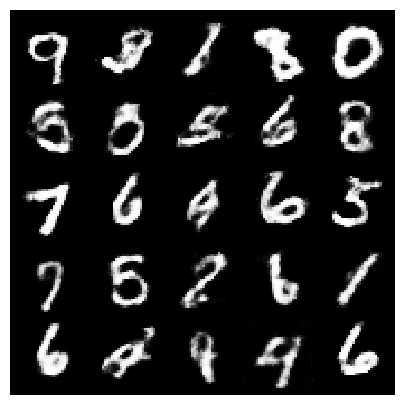

[Epoch 75/200] [Batch 495/938] [D loss: -1.017293] [G loss: -1.699286]


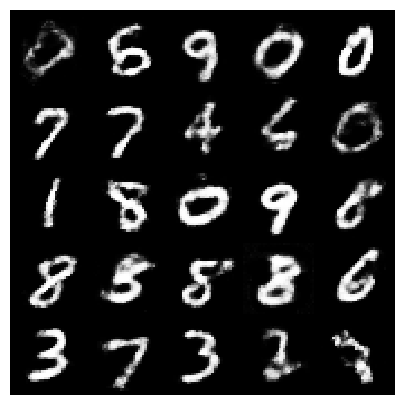

[Epoch 76/200] [Batch 55/938] [D loss: -1.157328] [G loss: -1.481188]


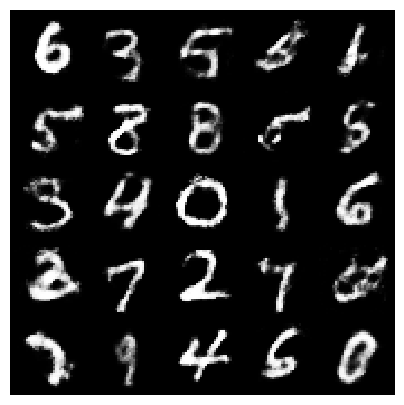

[Epoch 76/200] [Batch 555/938] [D loss: -0.731636] [G loss: -1.789065]


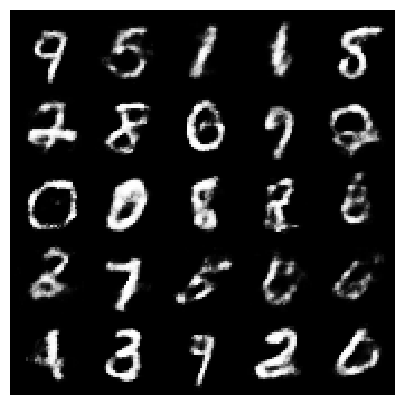

[Epoch 77/200] [Batch 115/938] [D loss: -1.544823] [G loss: -0.492322]


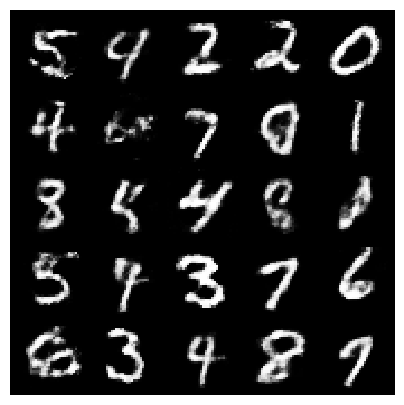

[Epoch 77/200] [Batch 615/938] [D loss: -1.383708] [G loss: -2.387178]


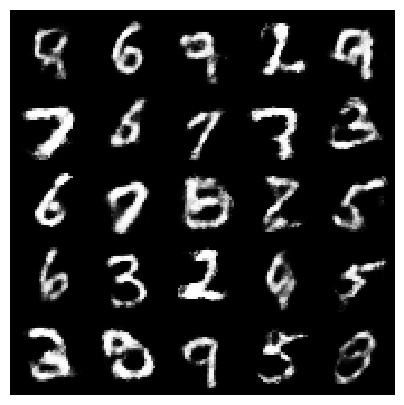

[Epoch 78/200] [Batch 175/938] [D loss: -0.494737] [G loss: -1.385622]


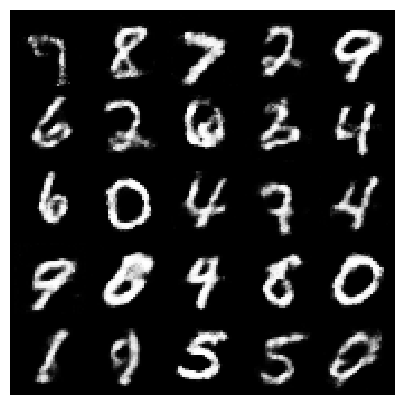

[Epoch 78/200] [Batch 675/938] [D loss: -1.288460] [G loss: -1.364128]


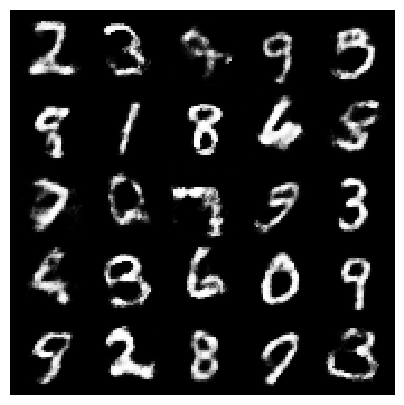

[Epoch 79/200] [Batch 235/938] [D loss: -1.453610] [G loss: -1.182633]


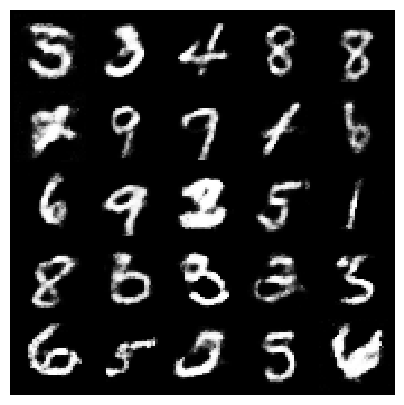

[Epoch 79/200] [Batch 735/938] [D loss: -1.231471] [G loss: -2.436922]


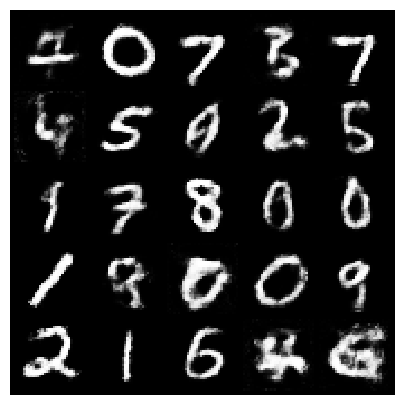

[Epoch 80/200] [Batch 295/938] [D loss: -0.934807] [G loss: -1.003789]


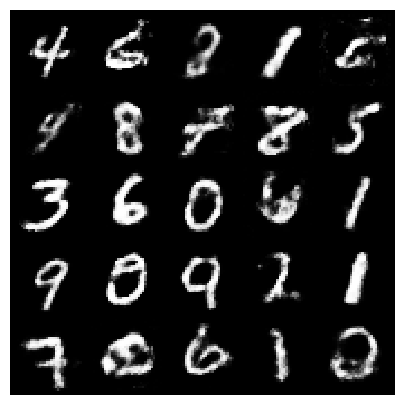

[Epoch 80/200] [Batch 795/938] [D loss: -0.810001] [G loss: -1.499768]


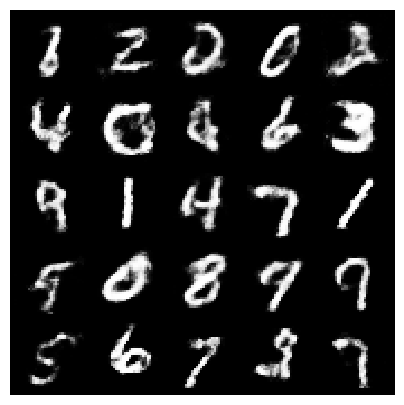

[Epoch 81/200] [Batch 355/938] [D loss: -1.238462] [G loss: -2.993919]


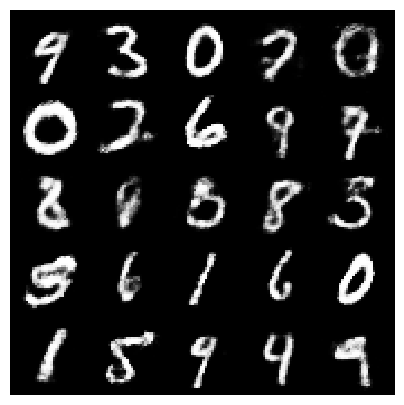

[Epoch 81/200] [Batch 855/938] [D loss: -1.016063] [G loss: -1.493867]


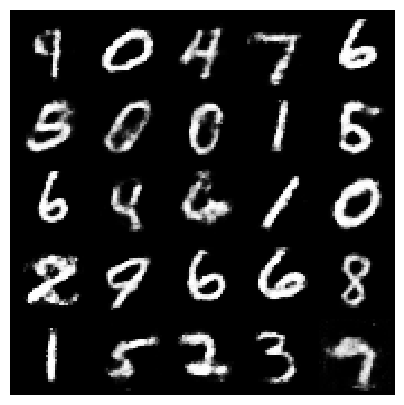

[Epoch 82/200] [Batch 415/938] [D loss: -0.936948] [G loss: -1.265836]


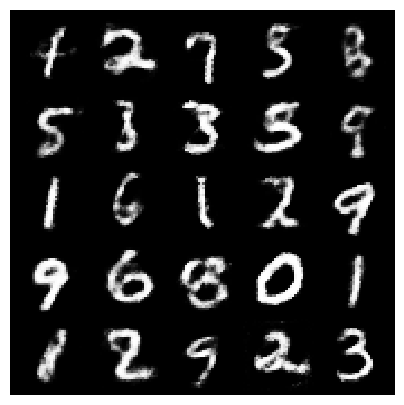

[Epoch 82/200] [Batch 915/938] [D loss: -0.553540] [G loss: -0.880671]


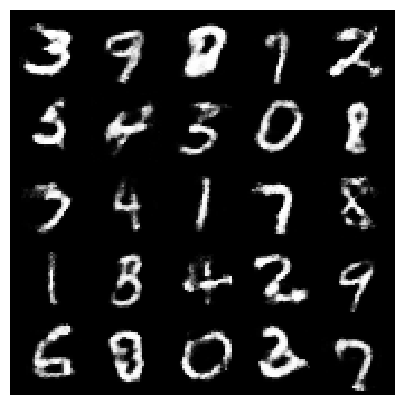

[Epoch 83/200] [Batch 475/938] [D loss: -0.544052] [G loss: -1.048084]


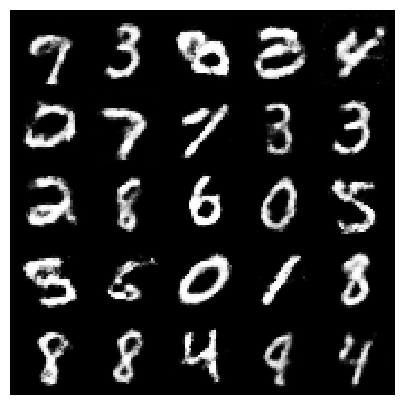

[Epoch 84/200] [Batch 35/938] [D loss: -0.778554] [G loss: -1.347954]


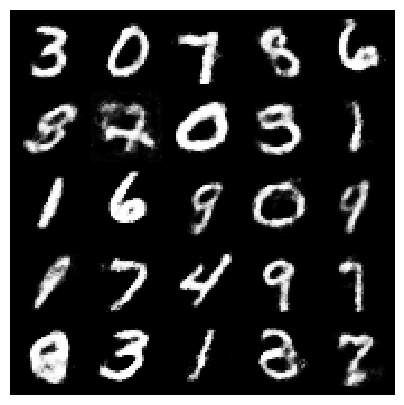

[Epoch 84/200] [Batch 535/938] [D loss: -0.726193] [G loss: -3.584571]


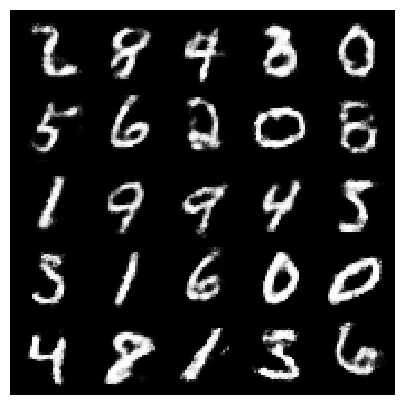

[Epoch 85/200] [Batch 95/938] [D loss: -0.663414] [G loss: -1.974572]


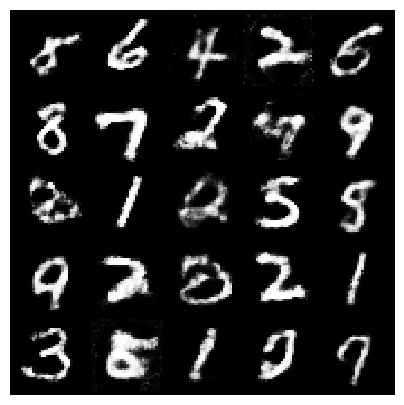

[Epoch 85/200] [Batch 595/938] [D loss: -0.884218] [G loss: -1.922405]


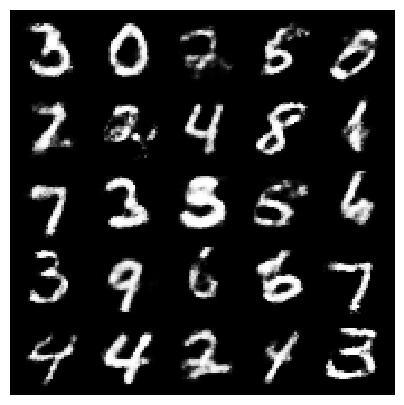

[Epoch 86/200] [Batch 155/938] [D loss: -1.065020] [G loss: -1.078484]


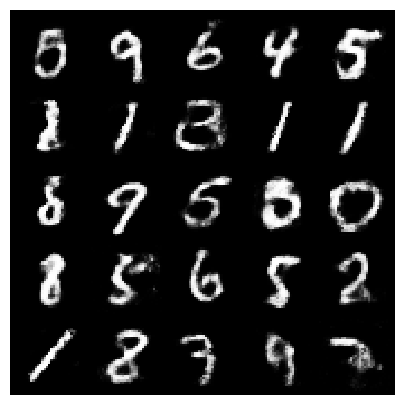

[Epoch 86/200] [Batch 655/938] [D loss: -1.021497] [G loss: -1.215617]


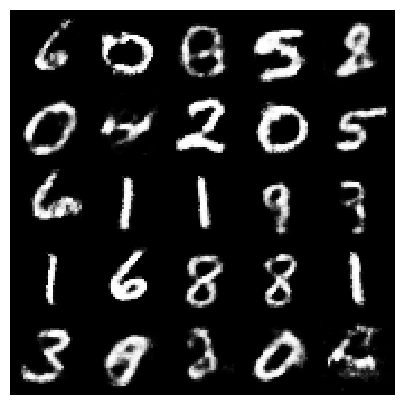

[Epoch 87/200] [Batch 215/938] [D loss: -0.835387] [G loss: -1.253045]


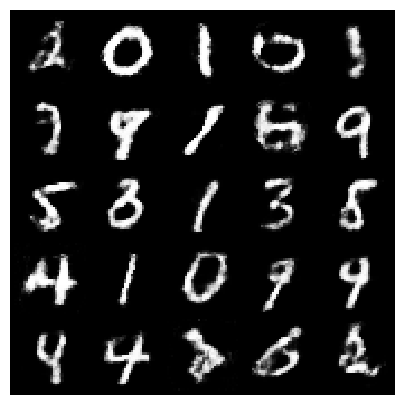

[Epoch 87/200] [Batch 715/938] [D loss: -0.648592] [G loss: -1.886096]


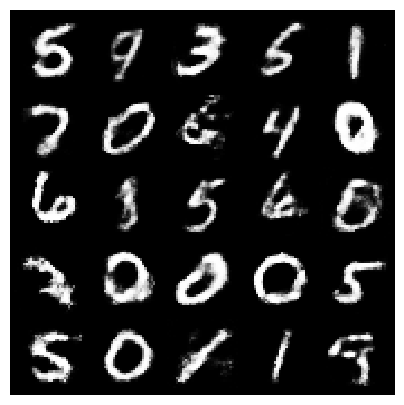

[Epoch 88/200] [Batch 275/938] [D loss: -1.297031] [G loss: -0.767608]


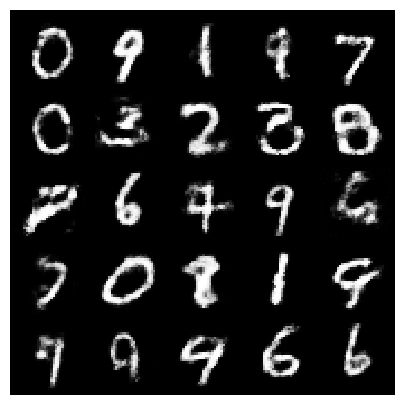

[Epoch 88/200] [Batch 775/938] [D loss: -1.004672] [G loss: -1.307088]


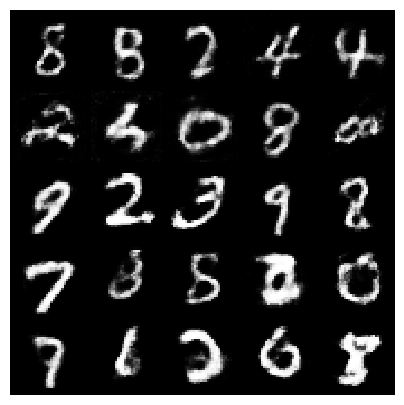

[Epoch 89/200] [Batch 335/938] [D loss: -0.686575] [G loss: -1.471921]


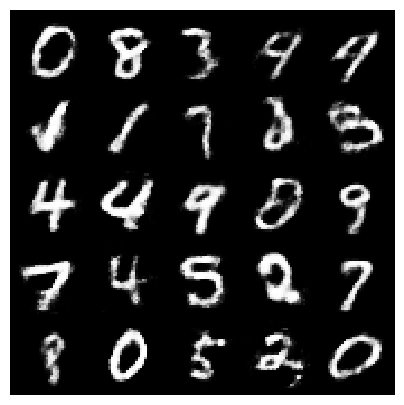

[Epoch 89/200] [Batch 835/938] [D loss: -0.641097] [G loss: -2.372797]


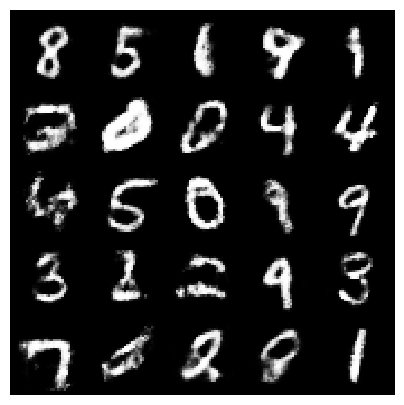

[Epoch 90/200] [Batch 395/938] [D loss: -1.008870] [G loss: -2.525373]


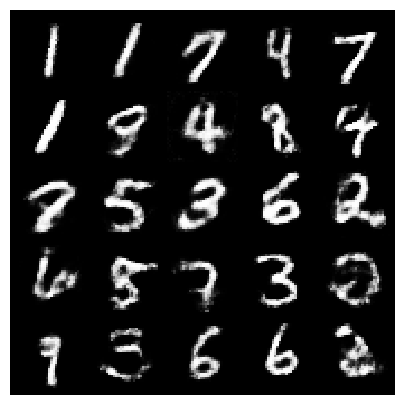

[Epoch 90/200] [Batch 895/938] [D loss: -1.019205] [G loss: -1.984536]


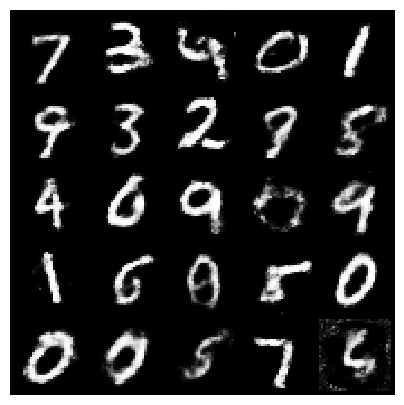

[Epoch 91/200] [Batch 455/938] [D loss: -0.983567] [G loss: 0.017706]


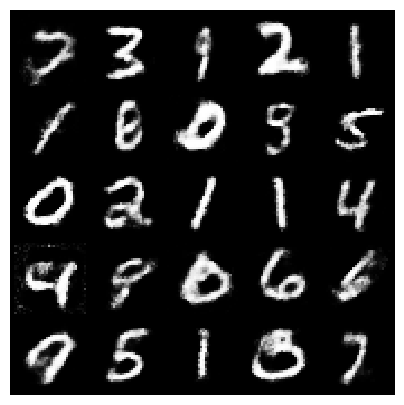

[Epoch 92/200] [Batch 15/938] [D loss: -1.017288] [G loss: -1.078787]


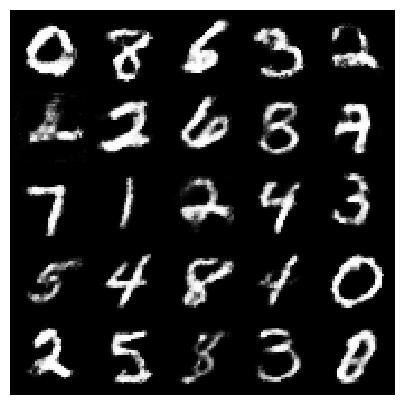

[Epoch 92/200] [Batch 515/938] [D loss: -1.138327] [G loss: -2.036508]


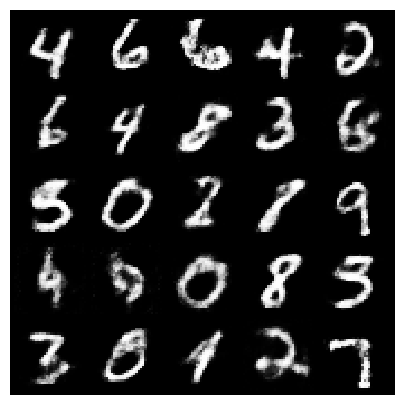

[Epoch 93/200] [Batch 75/938] [D loss: -1.003963] [G loss: -1.763056]


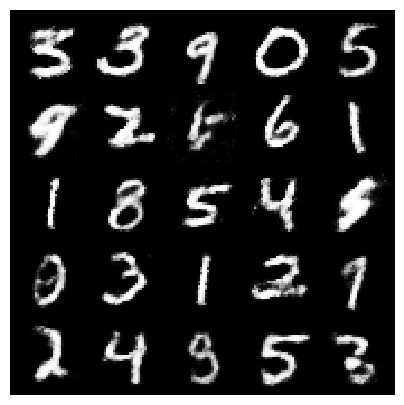

[Epoch 93/200] [Batch 575/938] [D loss: -0.930744] [G loss: -1.975444]


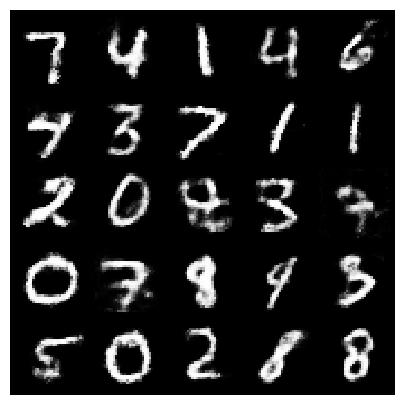

[Epoch 94/200] [Batch 135/938] [D loss: -0.801631] [G loss: -2.119481]


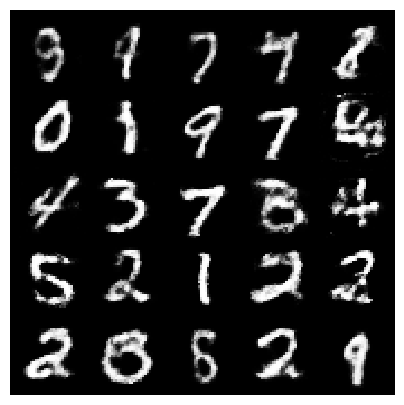

[Epoch 94/200] [Batch 635/938] [D loss: -0.809420] [G loss: -2.476079]


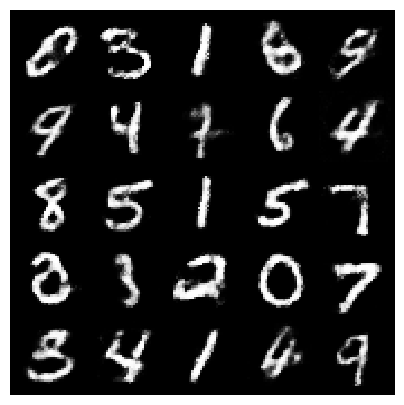

[Epoch 95/200] [Batch 195/938] [D loss: -0.642572] [G loss: -1.076030]


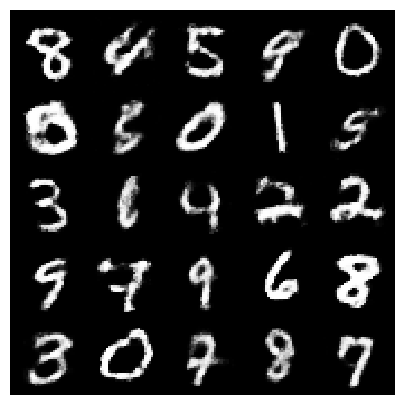

[Epoch 95/200] [Batch 695/938] [D loss: -0.511805] [G loss: -2.018654]


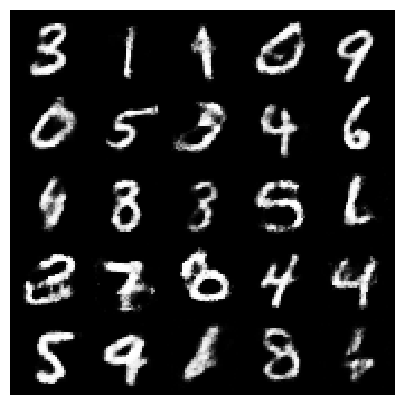

[Epoch 96/200] [Batch 255/938] [D loss: -1.186294] [G loss: -0.881557]


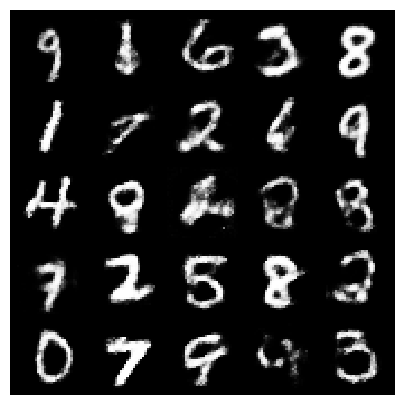

[Epoch 96/200] [Batch 755/938] [D loss: -0.803203] [G loss: -1.583065]


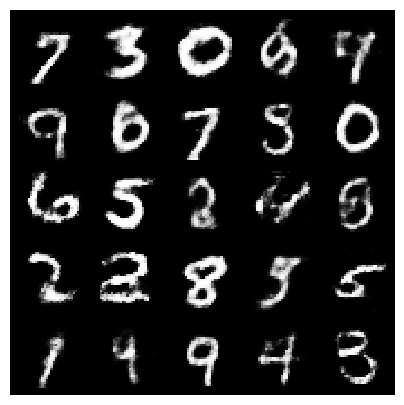

[Epoch 97/200] [Batch 315/938] [D loss: -0.832487] [G loss: -1.519096]


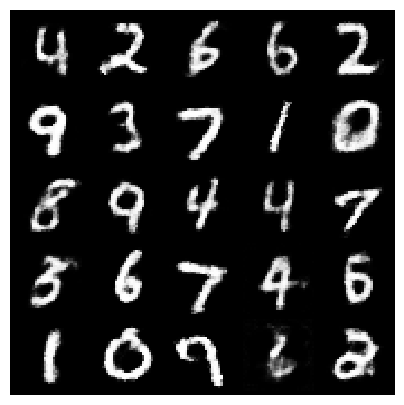

[Epoch 97/200] [Batch 815/938] [D loss: -0.690624] [G loss: -2.266477]


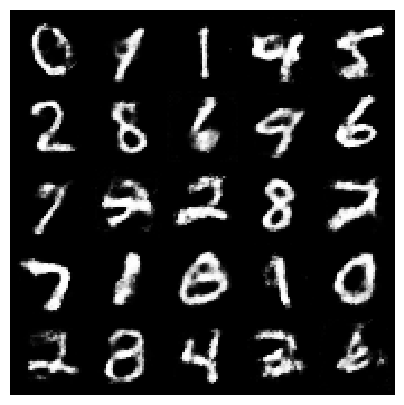

[Epoch 98/200] [Batch 375/938] [D loss: -1.122408] [G loss: -0.798143]


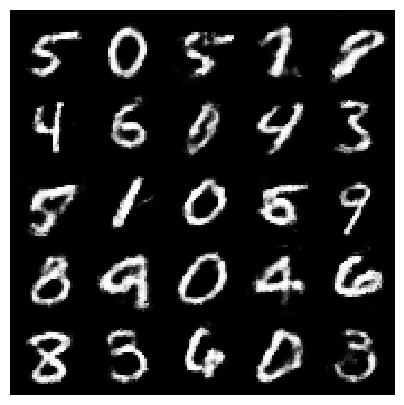

[Epoch 98/200] [Batch 875/938] [D loss: -0.701439] [G loss: 0.148164]


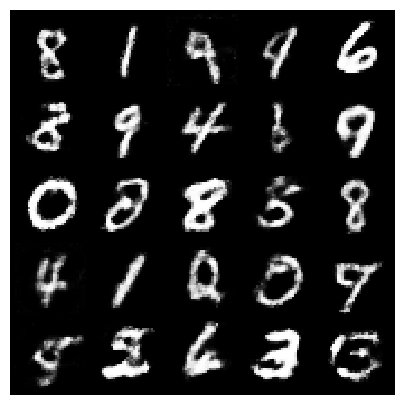

[Epoch 99/200] [Batch 435/938] [D loss: -1.086714] [G loss: -0.581948]


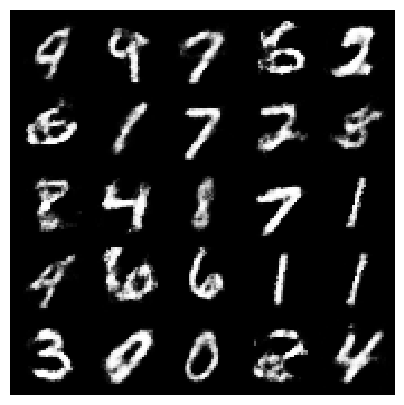

[Epoch 99/200] [Batch 935/938] [D loss: -0.908148] [G loss: -2.190297]


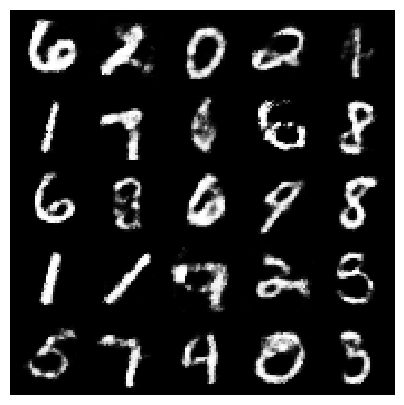

[Epoch 100/200] [Batch 495/938] [D loss: -1.076155] [G loss: -1.252736]


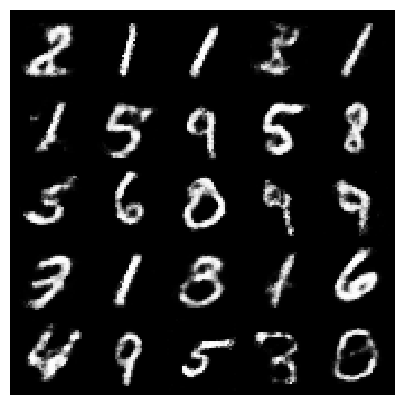

[Epoch 101/200] [Batch 55/938] [D loss: -1.000712] [G loss: -0.353940]


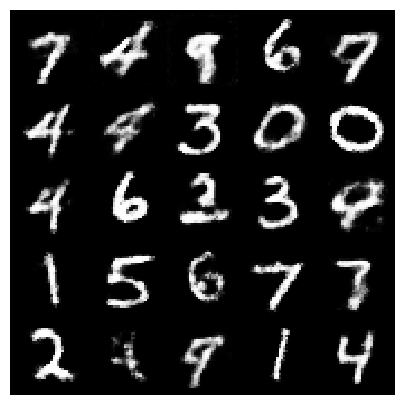

[Epoch 101/200] [Batch 555/938] [D loss: -1.196152] [G loss: -1.401410]


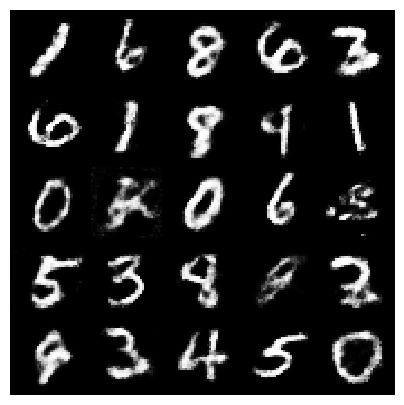

[Epoch 102/200] [Batch 115/938] [D loss: -0.754437] [G loss: -2.608451]


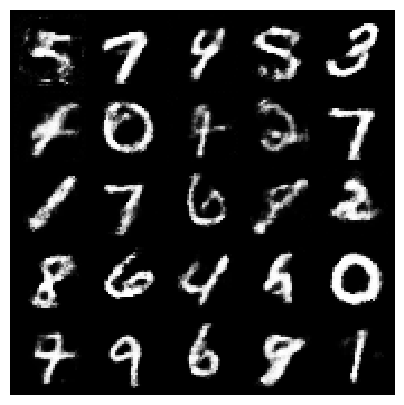

[Epoch 102/200] [Batch 615/938] [D loss: -0.942836] [G loss: -0.335138]


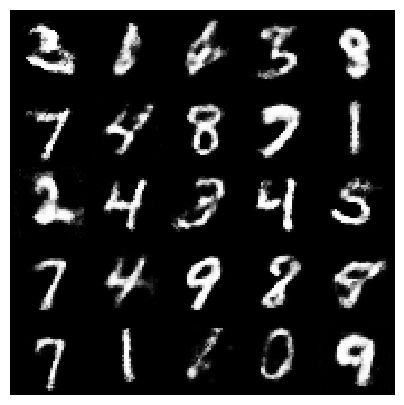

[Epoch 103/200] [Batch 175/938] [D loss: -0.940797] [G loss: -1.078752]


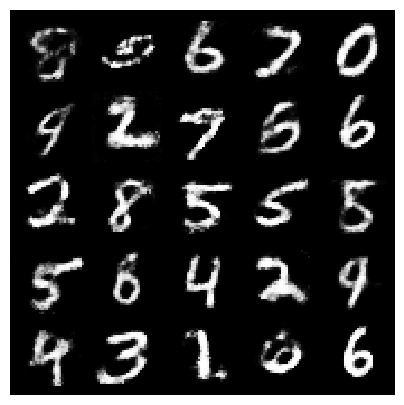

[Epoch 103/200] [Batch 675/938] [D loss: -1.228898] [G loss: -2.264904]


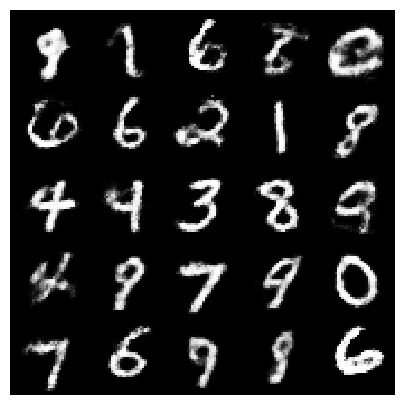

[Epoch 104/200] [Batch 235/938] [D loss: -0.827997] [G loss: -2.337969]


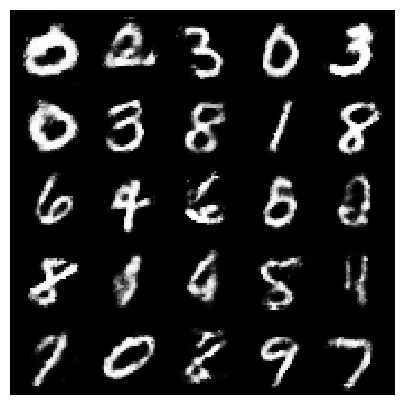

[Epoch 104/200] [Batch 735/938] [D loss: -0.737798] [G loss: -2.265374]


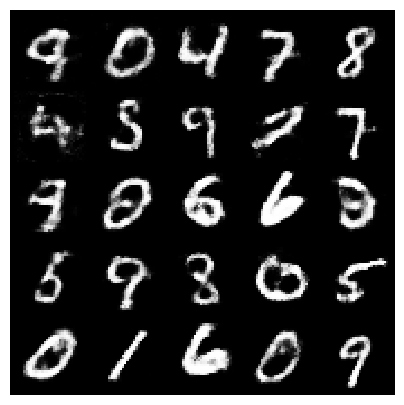

[Epoch 105/200] [Batch 295/938] [D loss: -0.943764] [G loss: -2.730424]


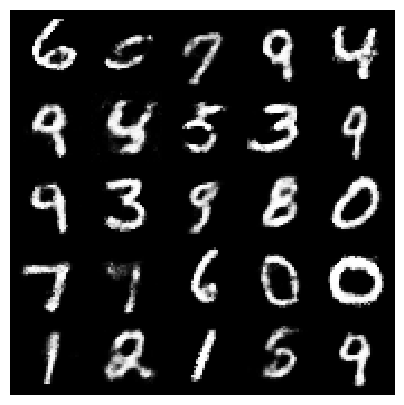

[Epoch 105/200] [Batch 795/938] [D loss: -1.296292] [G loss: -2.100694]


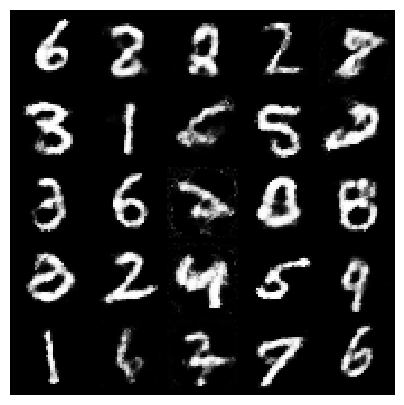

[Epoch 106/200] [Batch 355/938] [D loss: -0.875469] [G loss: -0.853391]


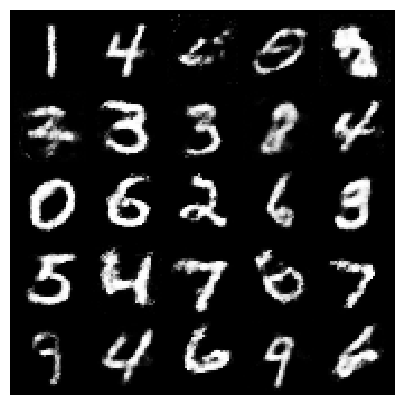

[Epoch 106/200] [Batch 855/938] [D loss: -0.994127] [G loss: -0.442348]


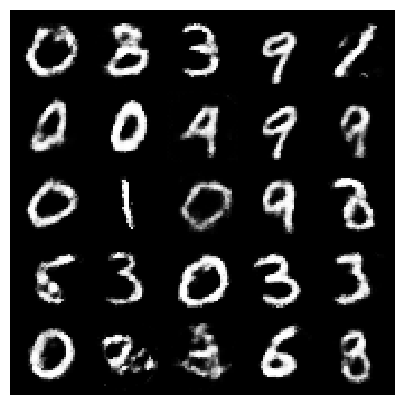

[Epoch 107/200] [Batch 415/938] [D loss: -1.029100] [G loss: -1.253210]


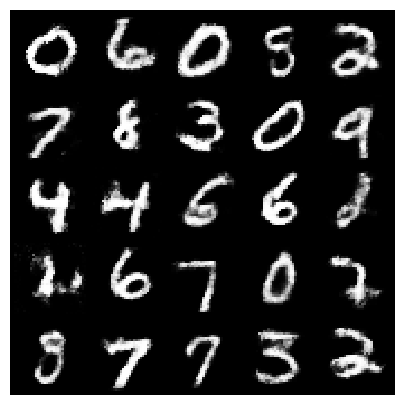

[Epoch 107/200] [Batch 915/938] [D loss: -1.304380] [G loss: -2.135919]


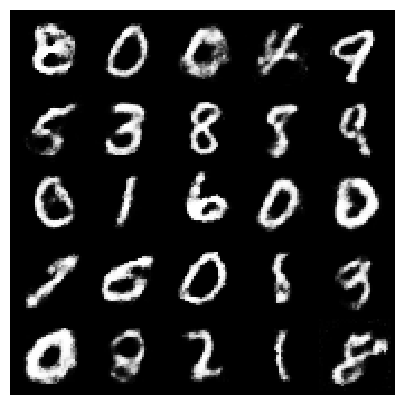

[Epoch 108/200] [Batch 475/938] [D loss: -1.056397] [G loss: 0.079811]


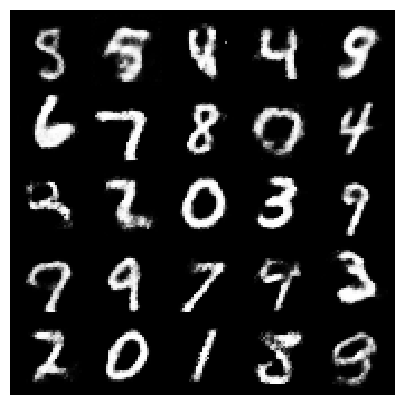

[Epoch 109/200] [Batch 35/938] [D loss: -1.038835] [G loss: -0.118420]


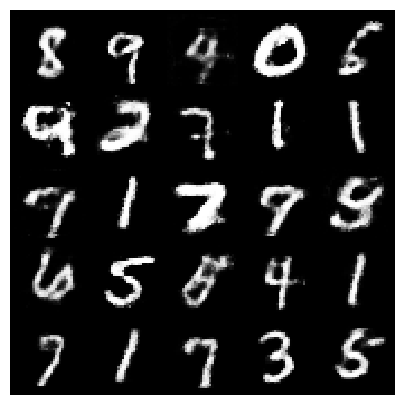

[Epoch 109/200] [Batch 535/938] [D loss: -1.015414] [G loss: -1.972865]


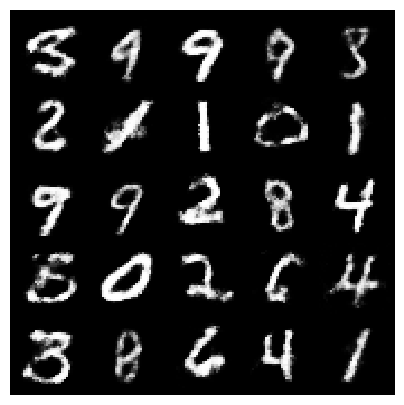

[Epoch 110/200] [Batch 95/938] [D loss: -0.616345] [G loss: -3.184482]


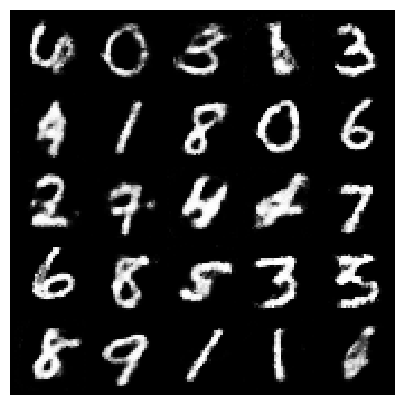

[Epoch 110/200] [Batch 595/938] [D loss: -0.602033] [G loss: -2.289728]


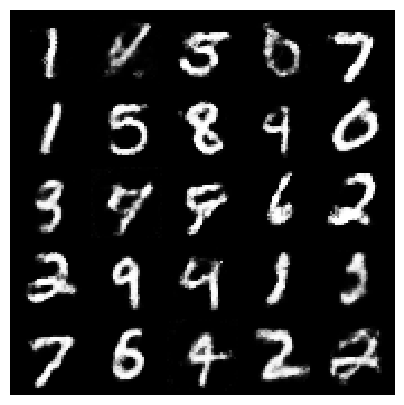

[Epoch 111/200] [Batch 155/938] [D loss: -0.899813] [G loss: -2.776893]


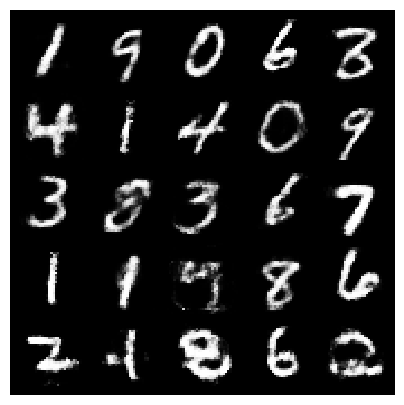

[Epoch 111/200] [Batch 655/938] [D loss: -0.809253] [G loss: -2.552359]


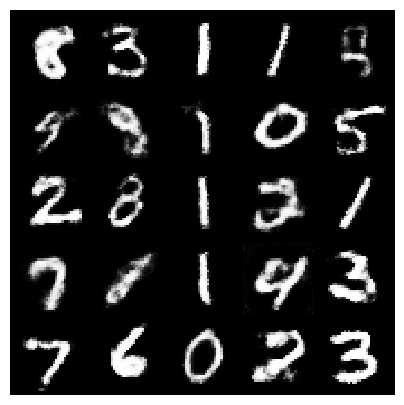

[Epoch 112/200] [Batch 215/938] [D loss: -0.593009] [G loss: -1.248510]


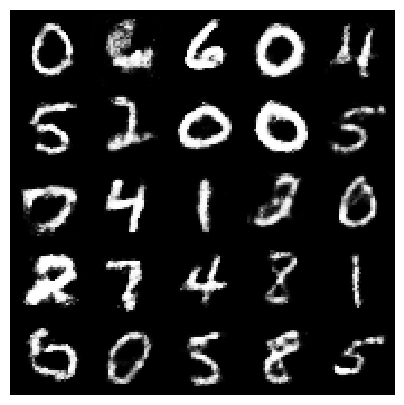

[Epoch 112/200] [Batch 715/938] [D loss: -0.849578] [G loss: -2.430327]


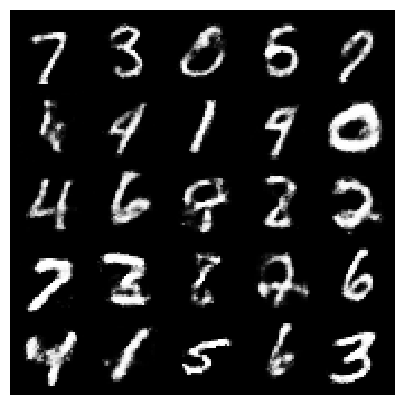

[Epoch 113/200] [Batch 275/938] [D loss: -0.989625] [G loss: -1.599361]


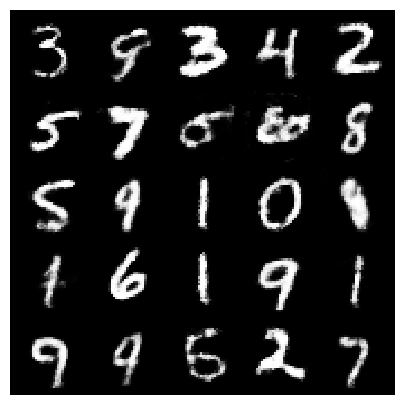

[Epoch 113/200] [Batch 775/938] [D loss: -1.280298] [G loss: -1.587459]


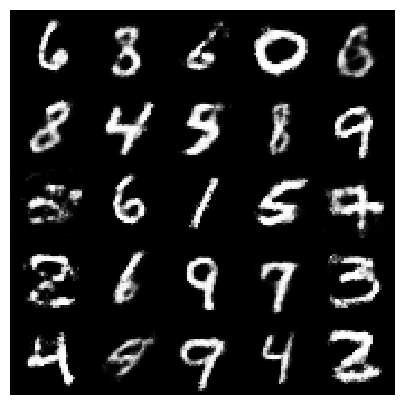

[Epoch 114/200] [Batch 335/938] [D loss: -0.943366] [G loss: -3.478312]


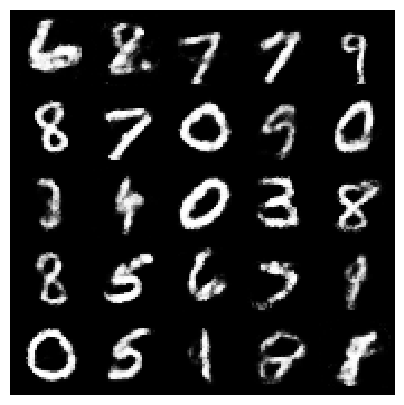

[Epoch 114/200] [Batch 835/938] [D loss: -1.102226] [G loss: -2.471370]


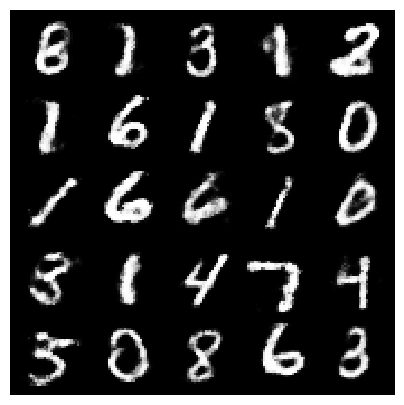

[Epoch 115/200] [Batch 395/938] [D loss: -0.906614] [G loss: -1.754917]


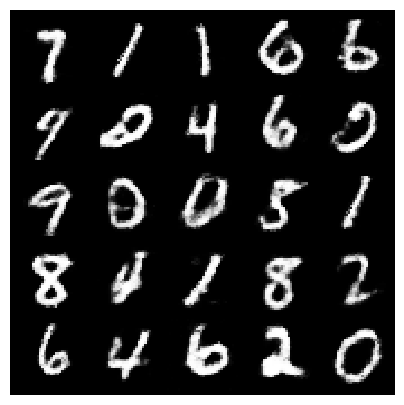

[Epoch 115/200] [Batch 895/938] [D loss: -1.177808] [G loss: -2.683413]


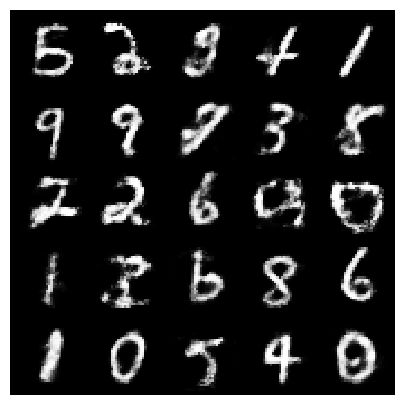

[Epoch 116/200] [Batch 455/938] [D loss: -0.918413] [G loss: -0.576027]


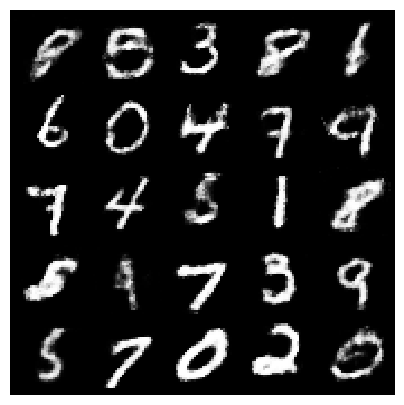

[Epoch 117/200] [Batch 15/938] [D loss: -1.090843] [G loss: -1.553363]


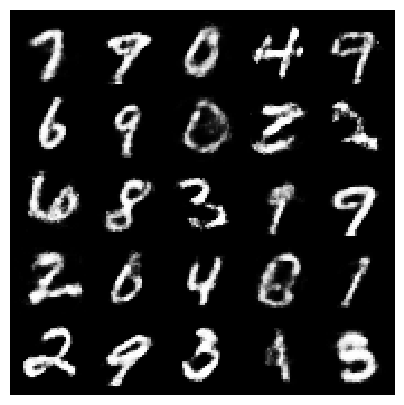

[Epoch 117/200] [Batch 515/938] [D loss: -0.787224] [G loss: -2.495409]


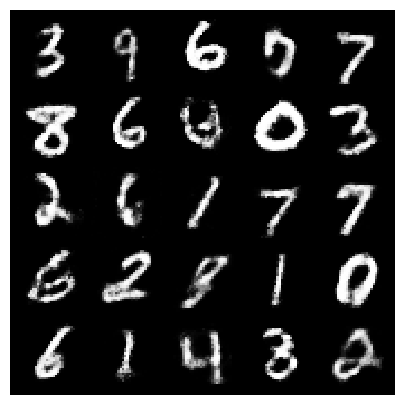

[Epoch 118/200] [Batch 75/938] [D loss: -0.988140] [G loss: -1.250826]


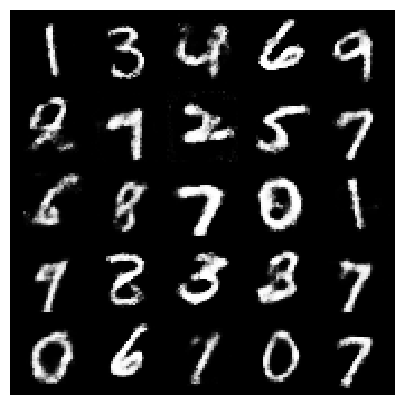

[Epoch 118/200] [Batch 575/938] [D loss: -0.730704] [G loss: -0.253076]


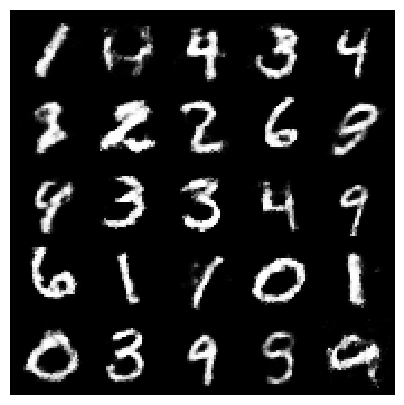

[Epoch 119/200] [Batch 135/938] [D loss: -1.222468] [G loss: -1.156994]


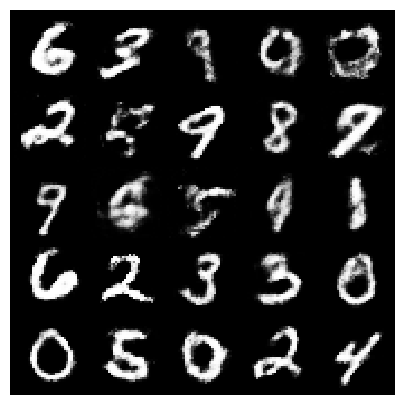

[Epoch 119/200] [Batch 635/938] [D loss: -0.858062] [G loss: -2.457578]


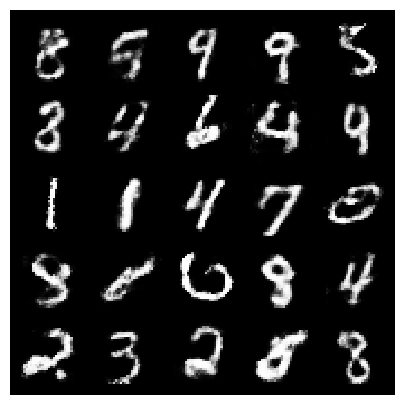

[Epoch 120/200] [Batch 195/938] [D loss: -0.783614] [G loss: -0.713467]


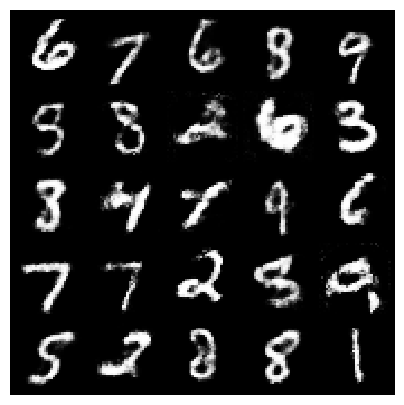

[Epoch 120/200] [Batch 695/938] [D loss: -0.515636] [G loss: -2.905313]


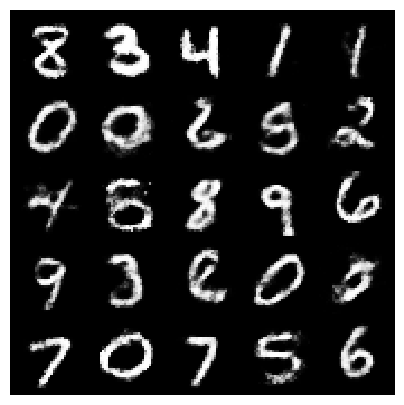

[Epoch 121/200] [Batch 255/938] [D loss: -0.597441] [G loss: -2.055602]


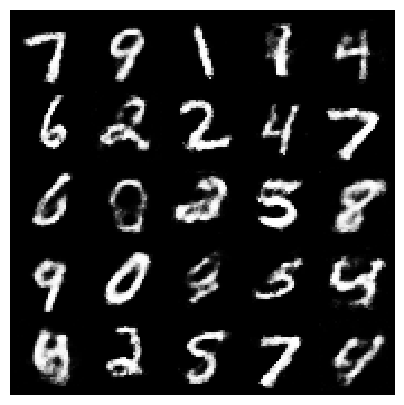

[Epoch 121/200] [Batch 755/938] [D loss: -0.462136] [G loss: -2.087613]


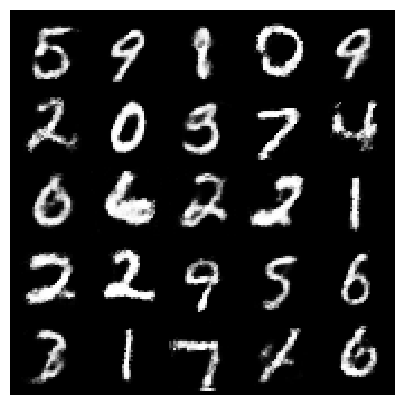

[Epoch 122/200] [Batch 315/938] [D loss: -0.786345] [G loss: -1.883821]


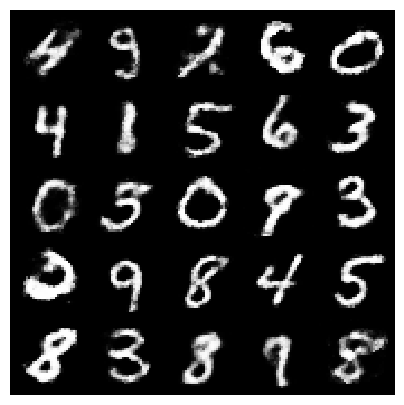

[Epoch 122/200] [Batch 815/938] [D loss: -0.617646] [G loss: -1.349455]


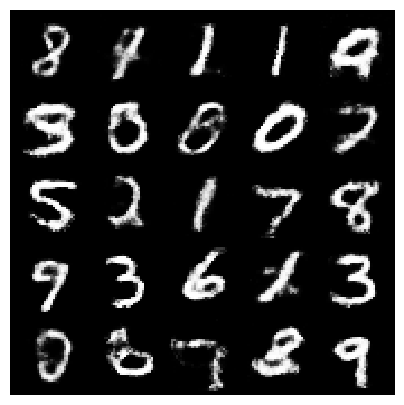

[Epoch 123/200] [Batch 375/938] [D loss: -0.767395] [G loss: -0.456642]


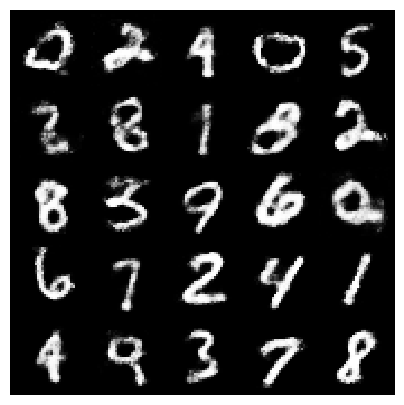

[Epoch 123/200] [Batch 875/938] [D loss: -0.706791] [G loss: -3.265052]


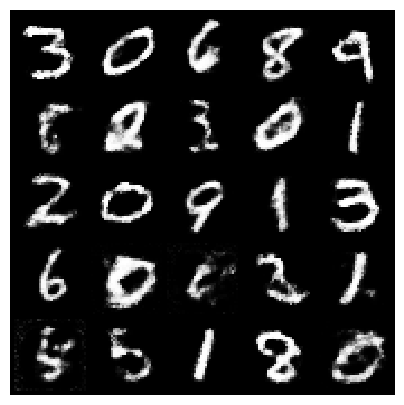

[Epoch 124/200] [Batch 435/938] [D loss: -0.643191] [G loss: -2.501966]


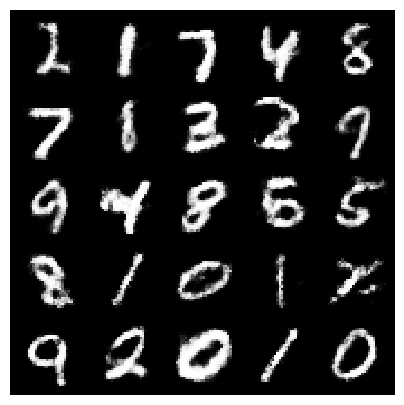

[Epoch 124/200] [Batch 935/938] [D loss: -0.496506] [G loss: -0.651082]


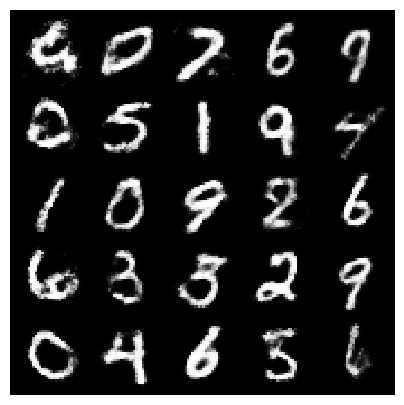

[Epoch 125/200] [Batch 495/938] [D loss: -0.500346] [G loss: -0.562447]


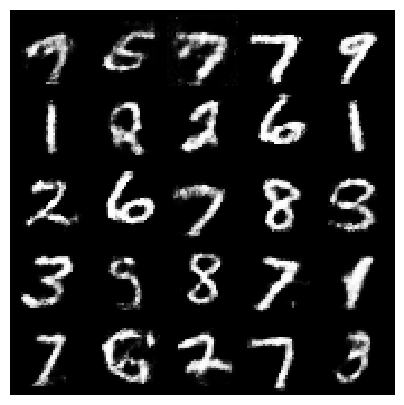

[Epoch 126/200] [Batch 55/938] [D loss: -0.990729] [G loss: -2.377333]


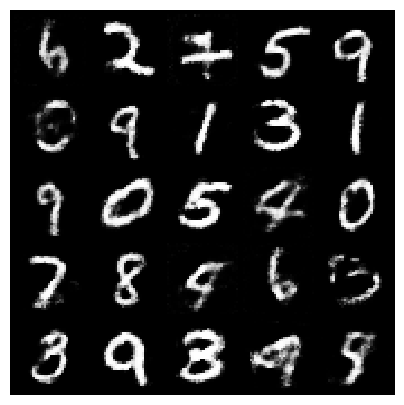

[Epoch 126/200] [Batch 555/938] [D loss: -1.008272] [G loss: -2.212313]


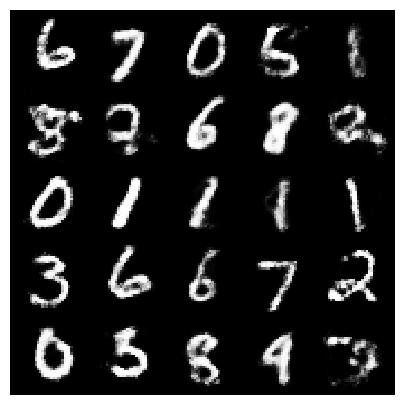

[Epoch 127/200] [Batch 115/938] [D loss: -1.186904] [G loss: -2.148467]


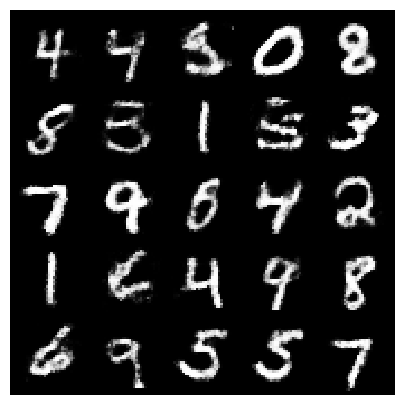

[Epoch 127/200] [Batch 615/938] [D loss: -1.210823] [G loss: -2.944277]


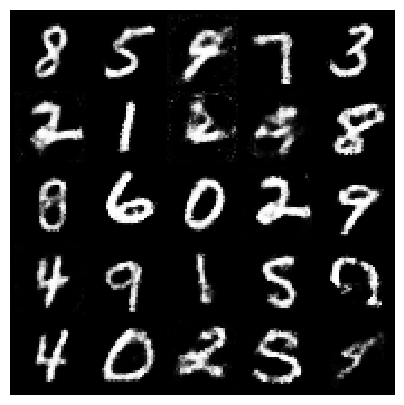

[Epoch 128/200] [Batch 175/938] [D loss: -1.470194] [G loss: -1.513651]


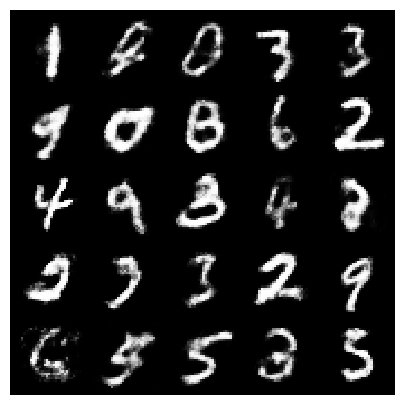

[Epoch 128/200] [Batch 675/938] [D loss: -0.737077] [G loss: -1.019713]


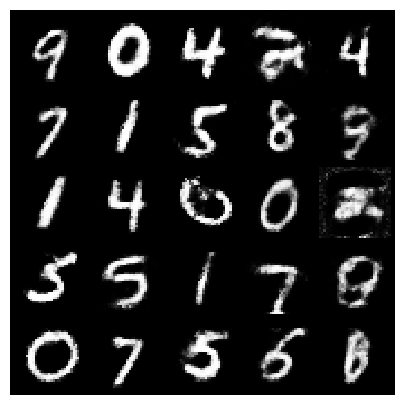

[Epoch 129/200] [Batch 235/938] [D loss: -0.912532] [G loss: -1.870202]


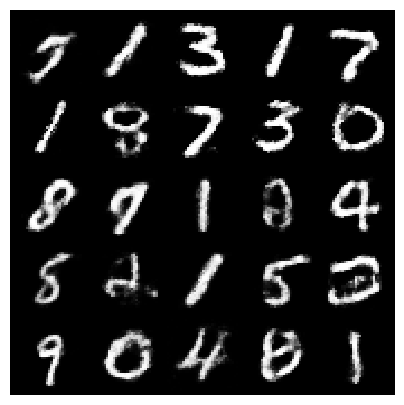

[Epoch 129/200] [Batch 735/938] [D loss: -1.062933] [G loss: -3.089485]


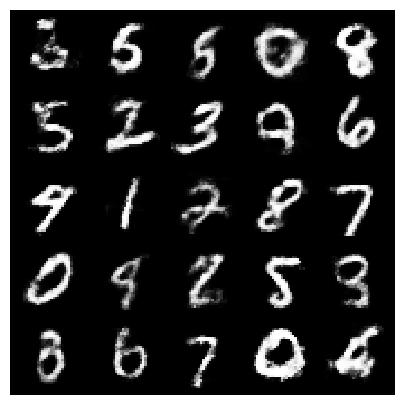

[Epoch 130/200] [Batch 295/938] [D loss: -0.554204] [G loss: -2.462402]


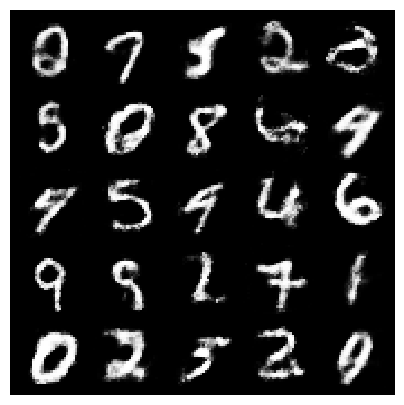

[Epoch 130/200] [Batch 795/938] [D loss: -0.907875] [G loss: -3.780708]


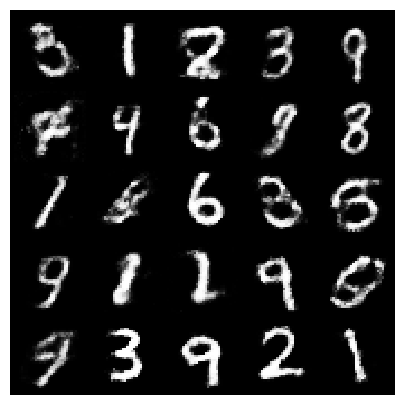

[Epoch 131/200] [Batch 355/938] [D loss: -0.774360] [G loss: -0.619186]


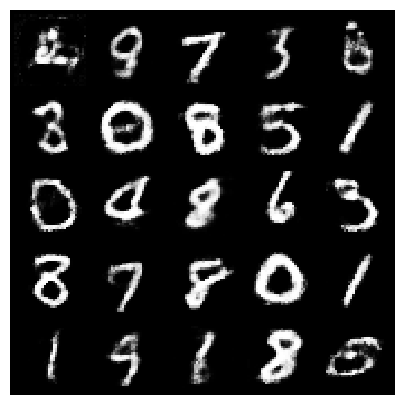

[Epoch 131/200] [Batch 855/938] [D loss: -1.159670] [G loss: -1.572863]


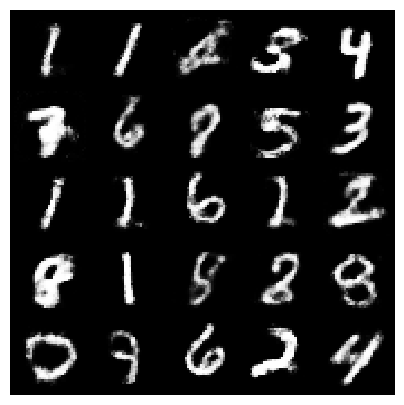

[Epoch 132/200] [Batch 415/938] [D loss: -0.558512] [G loss: -0.576722]


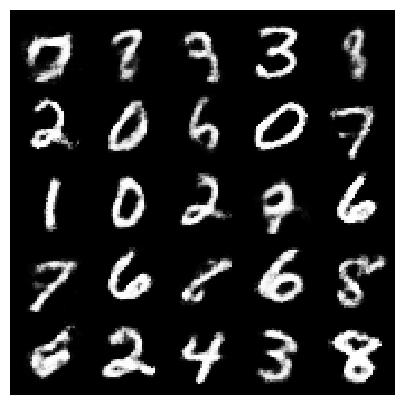

[Epoch 132/200] [Batch 915/938] [D loss: -0.689690] [G loss: -1.016215]


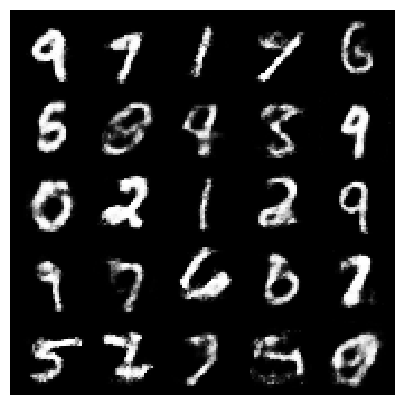

[Epoch 133/200] [Batch 475/938] [D loss: -0.798494] [G loss: -1.880287]


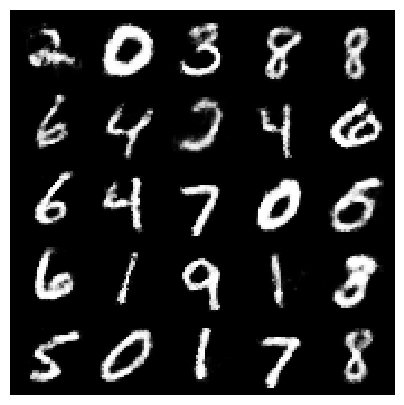

[Epoch 134/200] [Batch 35/938] [D loss: -0.633002] [G loss: -1.452423]


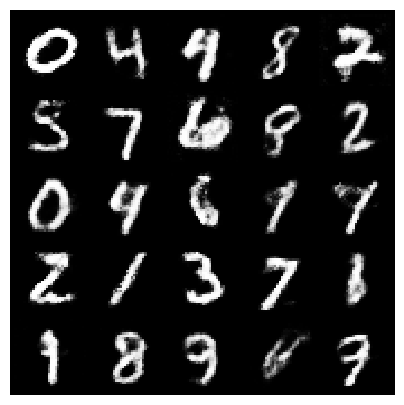

[Epoch 134/200] [Batch 535/938] [D loss: -1.302949] [G loss: -2.678645]


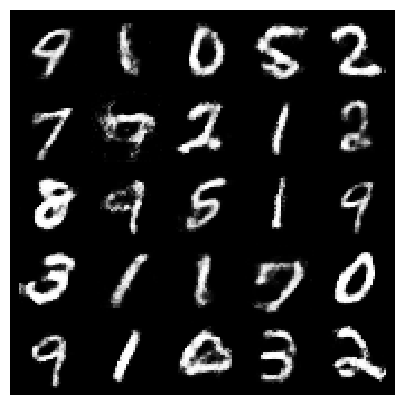

[Epoch 135/200] [Batch 95/938] [D loss: -0.682068] [G loss: -1.773582]


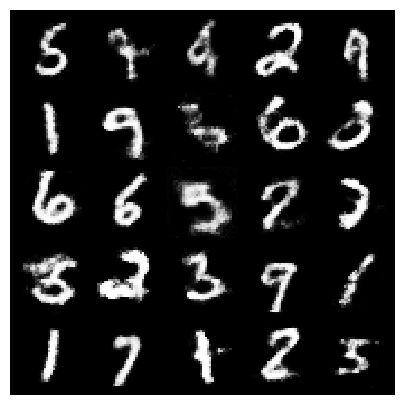

[Epoch 135/200] [Batch 595/938] [D loss: -0.643163] [G loss: -0.942074]


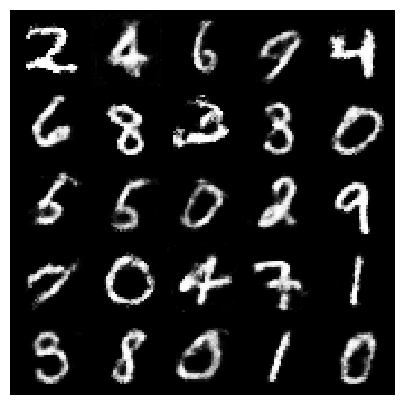

[Epoch 136/200] [Batch 155/938] [D loss: -0.140478] [G loss: -1.978323]


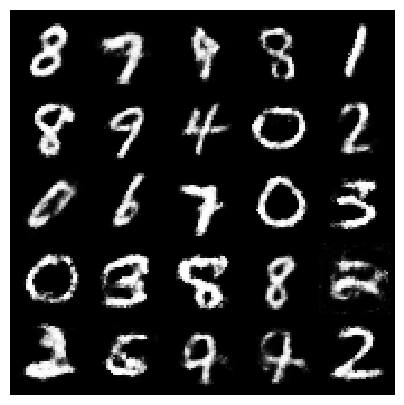

[Epoch 136/200] [Batch 655/938] [D loss: -0.198041] [G loss: -2.666834]


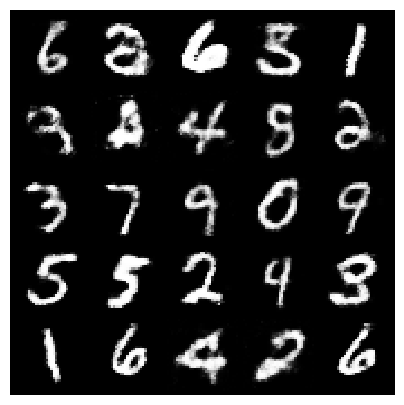

[Epoch 137/200] [Batch 215/938] [D loss: -0.892227] [G loss: -2.611303]


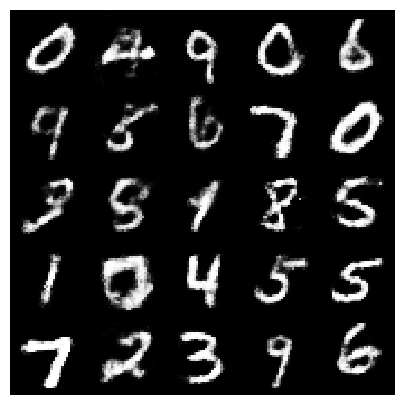

[Epoch 137/200] [Batch 715/938] [D loss: -0.669399] [G loss: -2.537799]


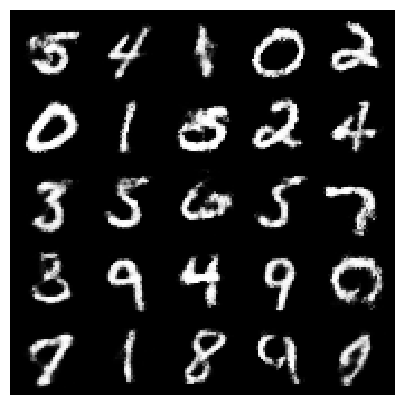

[Epoch 138/200] [Batch 275/938] [D loss: -0.795582] [G loss: -1.301263]


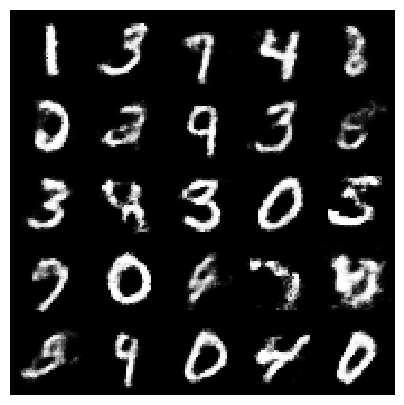

[Epoch 138/200] [Batch 775/938] [D loss: -0.930043] [G loss: 0.269540]


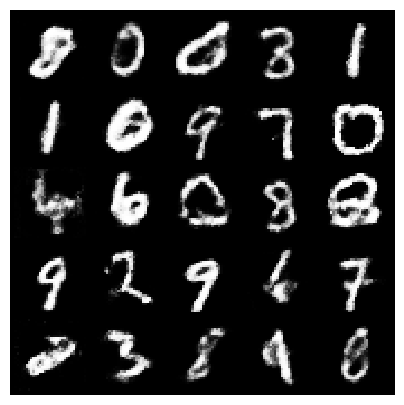

[Epoch 139/200] [Batch 335/938] [D loss: -1.094867] [G loss: -0.355502]


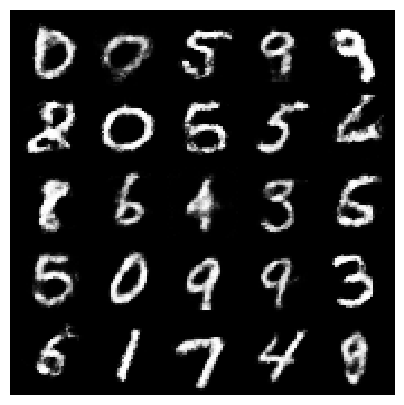

[Epoch 139/200] [Batch 835/938] [D loss: -1.234638] [G loss: -1.343310]


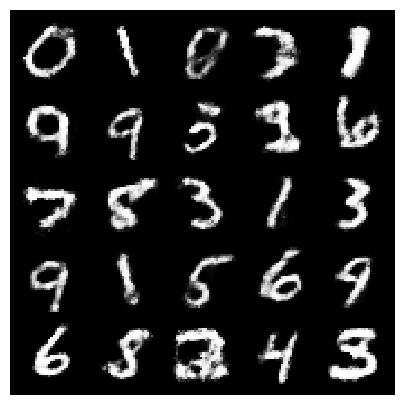

[Epoch 140/200] [Batch 395/938] [D loss: -0.801584] [G loss: -0.345334]


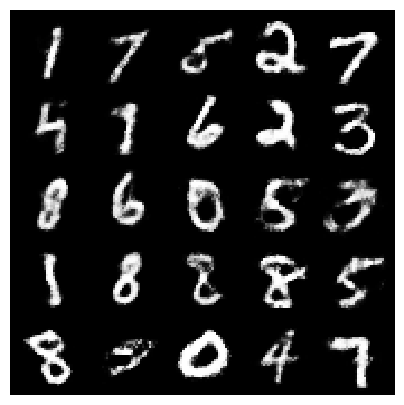

[Epoch 140/200] [Batch 895/938] [D loss: -1.337068] [G loss: -0.544148]


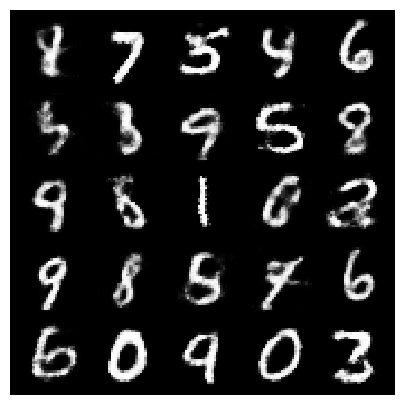

[Epoch 141/200] [Batch 455/938] [D loss: -0.788627] [G loss: -2.883955]


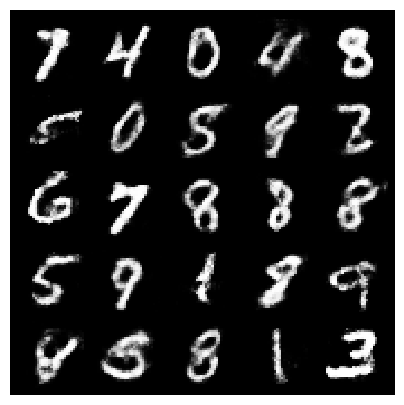

[Epoch 142/200] [Batch 15/938] [D loss: -1.191017] [G loss: 0.292399]


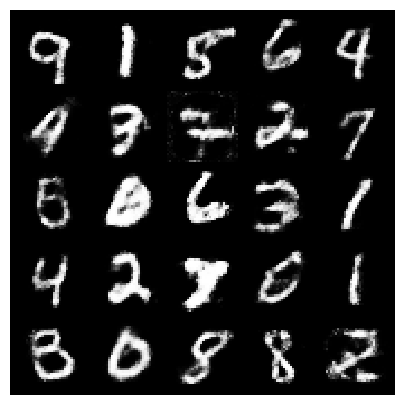

[Epoch 142/200] [Batch 515/938] [D loss: -0.928736] [G loss: -3.417682]


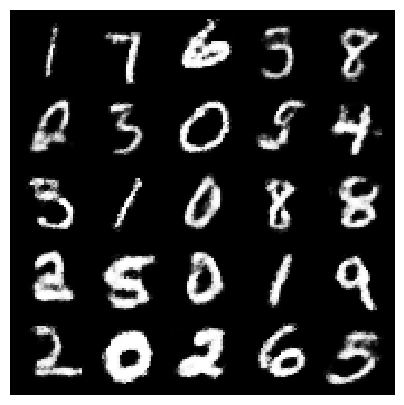

[Epoch 143/200] [Batch 75/938] [D loss: -0.931811] [G loss: -1.427958]


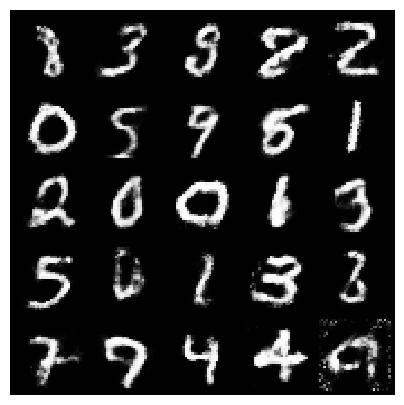

[Epoch 143/200] [Batch 575/938] [D loss: -0.522983] [G loss: -2.271737]


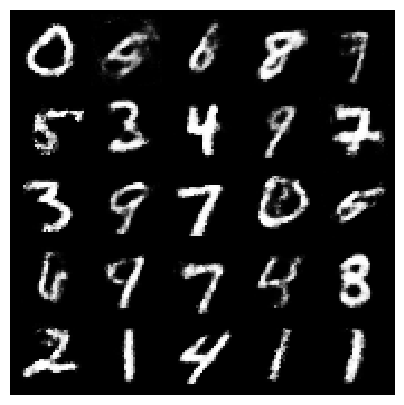

[Epoch 144/200] [Batch 135/938] [D loss: -0.886492] [G loss: -4.109912]


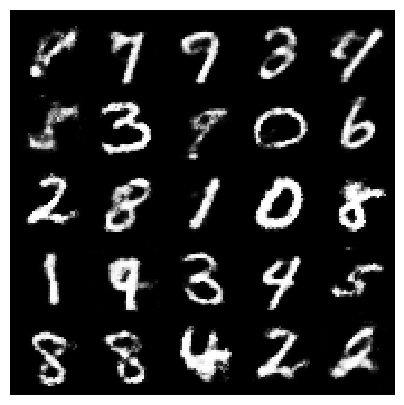

[Epoch 144/200] [Batch 635/938] [D loss: -0.683348] [G loss: -1.157382]


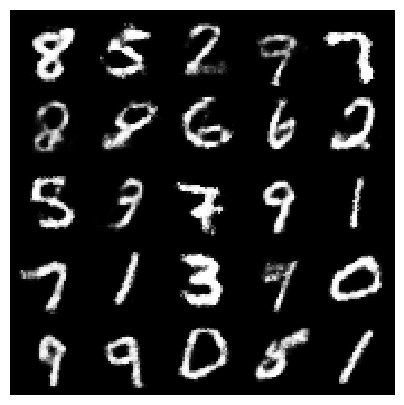

[Epoch 145/200] [Batch 195/938] [D loss: -0.397260] [G loss: -1.822289]


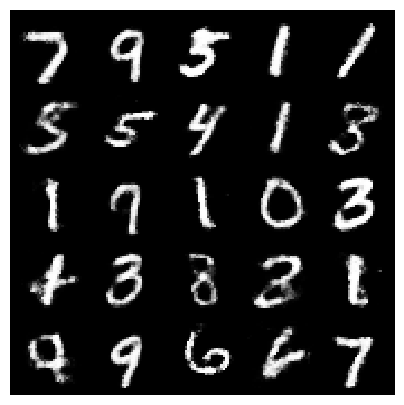

[Epoch 145/200] [Batch 695/938] [D loss: -0.692653] [G loss: -2.210959]


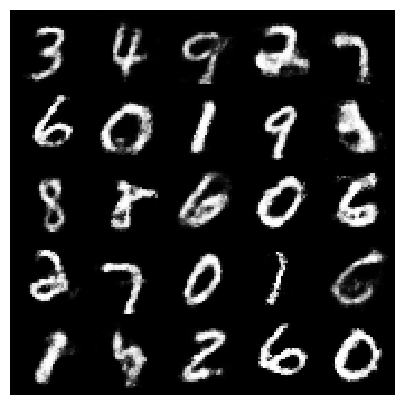

[Epoch 146/200] [Batch 255/938] [D loss: -0.673859] [G loss: -4.108875]


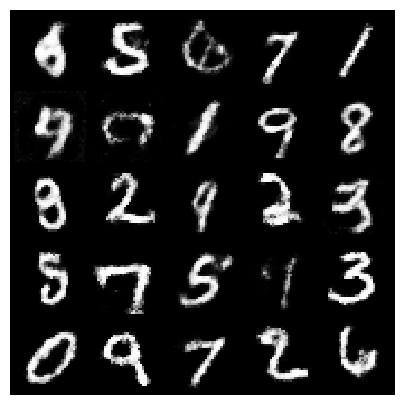

[Epoch 146/200] [Batch 755/938] [D loss: -0.516880] [G loss: -3.219785]


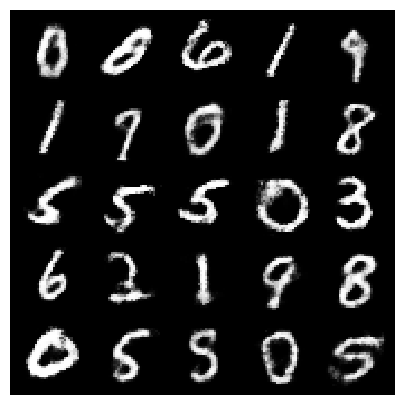

[Epoch 147/200] [Batch 315/938] [D loss: -0.232638] [G loss: -3.724867]


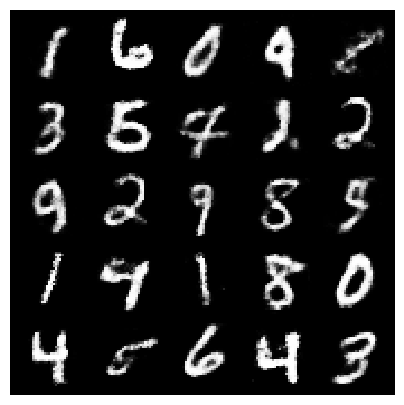

[Epoch 147/200] [Batch 815/938] [D loss: -1.081437] [G loss: -2.307417]


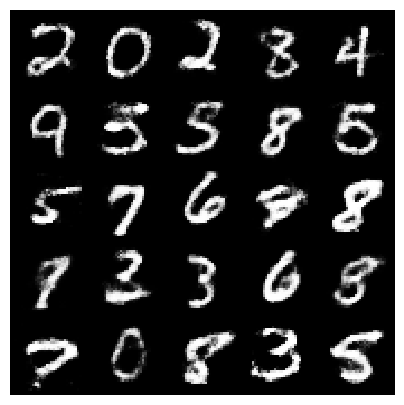

[Epoch 148/200] [Batch 375/938] [D loss: -1.043497] [G loss: -3.414800]


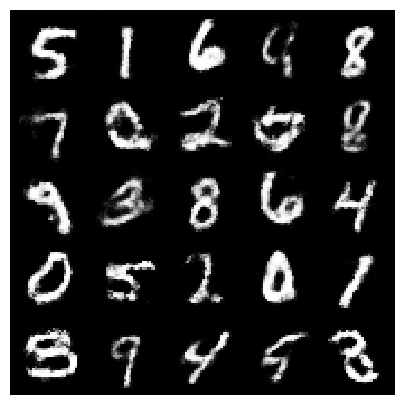

[Epoch 148/200] [Batch 875/938] [D loss: -0.462211] [G loss: -2.555471]


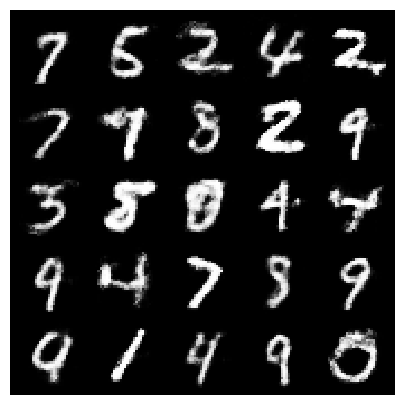

[Epoch 149/200] [Batch 435/938] [D loss: -0.933864] [G loss: -2.773064]


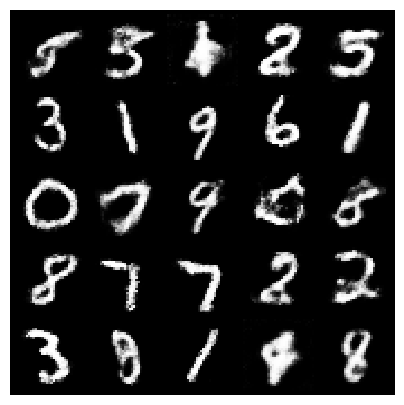

[Epoch 149/200] [Batch 935/938] [D loss: -0.829923] [G loss: -2.824694]


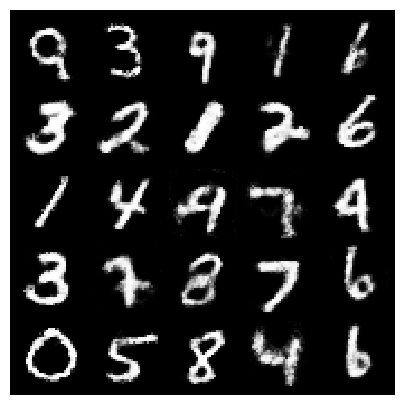

[Epoch 150/200] [Batch 495/938] [D loss: -0.540713] [G loss: -3.013143]


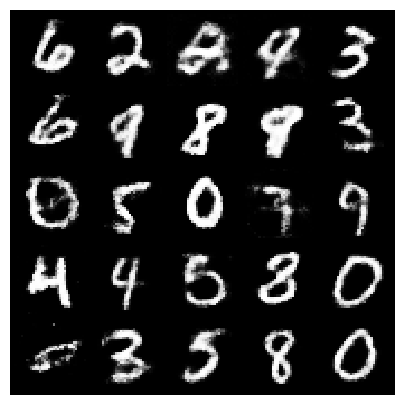

[Epoch 151/200] [Batch 55/938] [D loss: -0.902711] [G loss: -2.041917]


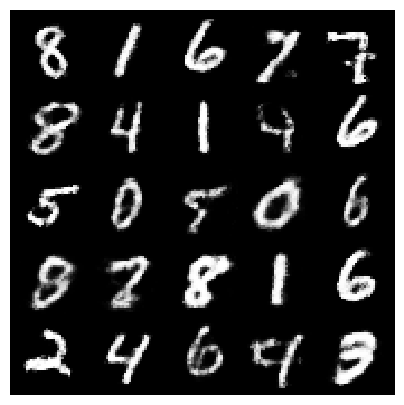

[Epoch 151/200] [Batch 555/938] [D loss: -0.408251] [G loss: -2.286075]


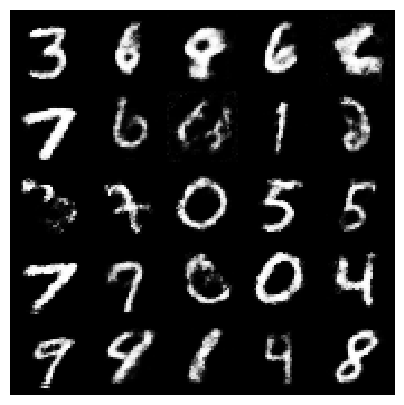

[Epoch 152/200] [Batch 115/938] [D loss: -0.820321] [G loss: -1.807263]


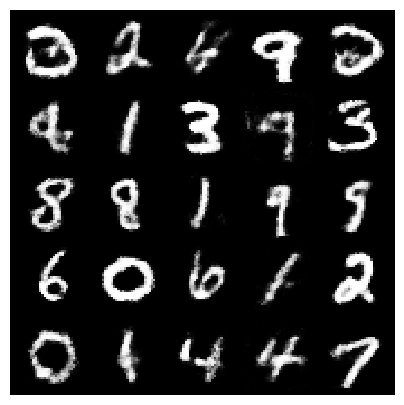

[Epoch 152/200] [Batch 615/938] [D loss: -1.352713] [G loss: -1.312193]


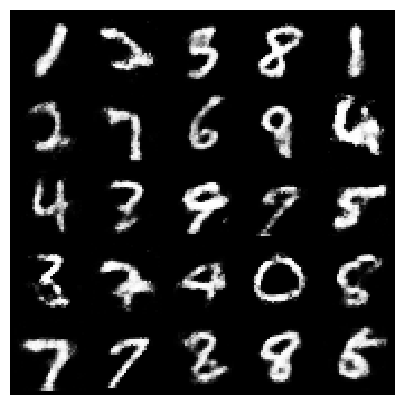

[Epoch 153/200] [Batch 175/938] [D loss: -0.941664] [G loss: -1.689599]


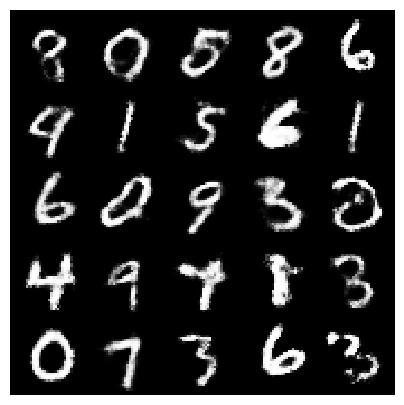

[Epoch 153/200] [Batch 675/938] [D loss: -1.244807] [G loss: -1.782905]


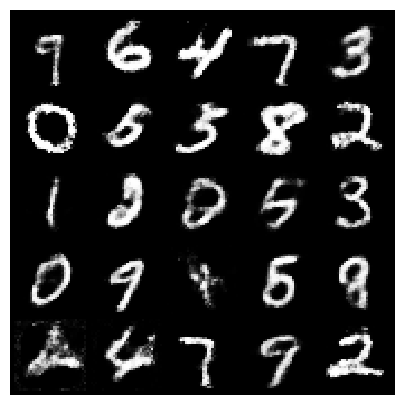

[Epoch 154/200] [Batch 235/938] [D loss: -0.658045] [G loss: -0.614750]


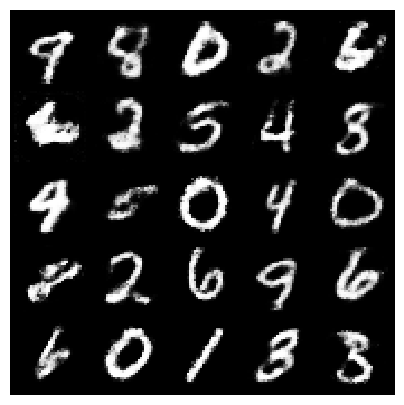

[Epoch 154/200] [Batch 735/938] [D loss: -0.559043] [G loss: -1.659702]


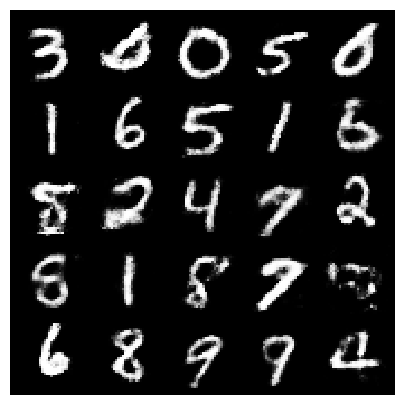

[Epoch 155/200] [Batch 295/938] [D loss: -0.947793] [G loss: -3.946873]


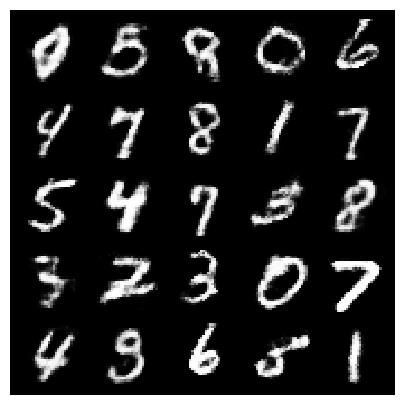

[Epoch 155/200] [Batch 795/938] [D loss: -0.521163] [G loss: -0.922168]


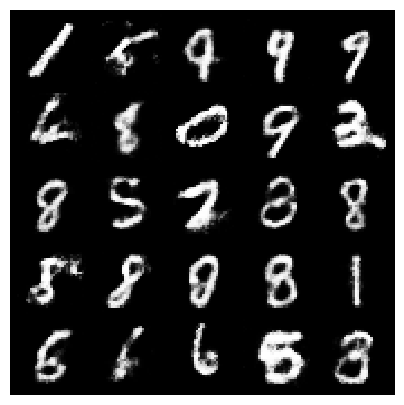

[Epoch 156/200] [Batch 355/938] [D loss: -0.897856] [G loss: -1.936920]


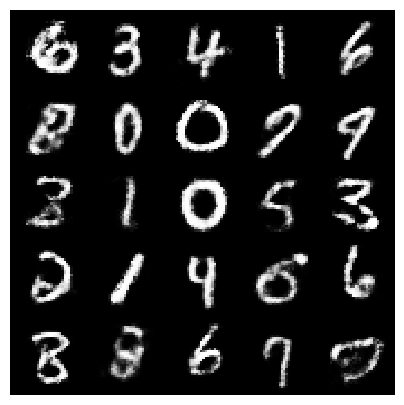

[Epoch 156/200] [Batch 855/938] [D loss: -0.768740] [G loss: -2.452746]


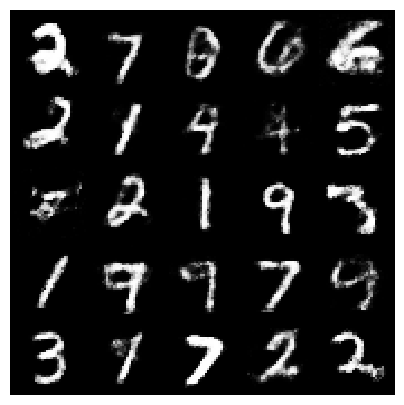

[Epoch 157/200] [Batch 415/938] [D loss: -0.778916] [G loss: -1.763406]


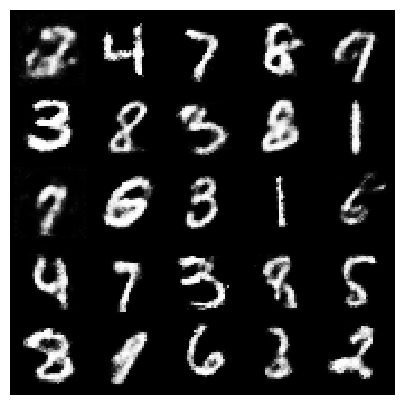

[Epoch 157/200] [Batch 915/938] [D loss: -0.442947] [G loss: -1.271206]


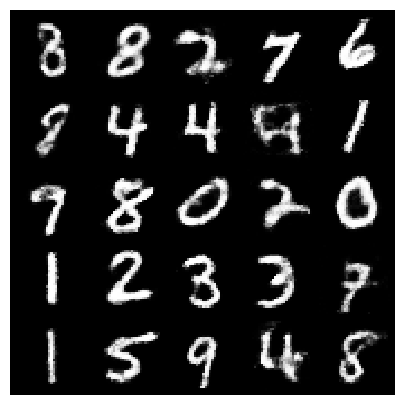

[Epoch 158/200] [Batch 475/938] [D loss: -0.911400] [G loss: -3.182159]


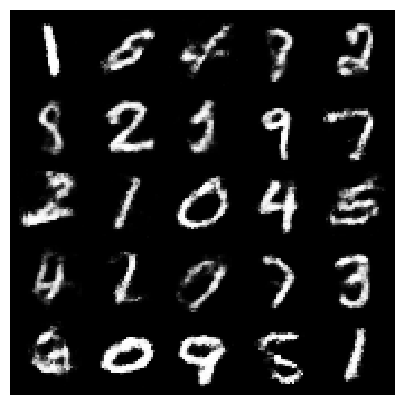

[Epoch 159/200] [Batch 35/938] [D loss: -1.048942] [G loss: -2.433050]


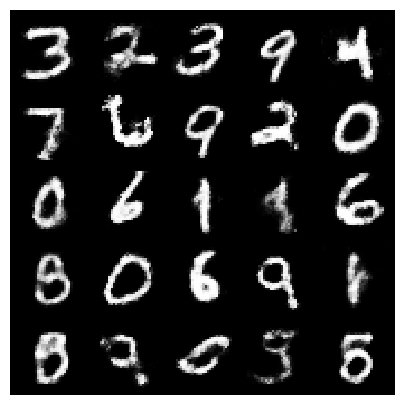

[Epoch 159/200] [Batch 535/938] [D loss: -0.866971] [G loss: -2.063650]


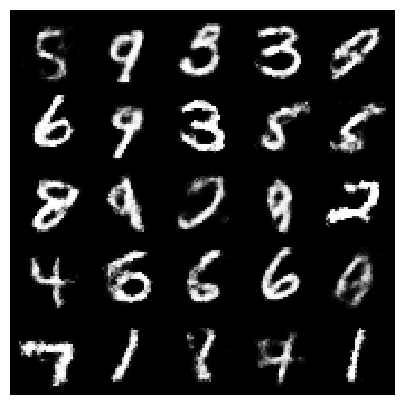

[Epoch 160/200] [Batch 95/938] [D loss: -1.091050] [G loss: -4.607836]


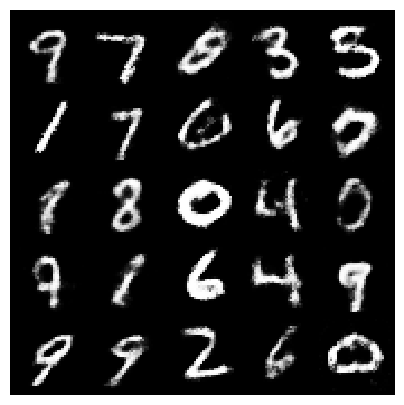

[Epoch 160/200] [Batch 595/938] [D loss: -1.133991] [G loss: -2.907125]


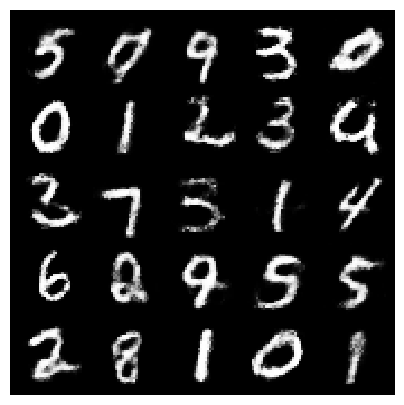

[Epoch 161/200] [Batch 155/938] [D loss: -0.653656] [G loss: -0.786595]


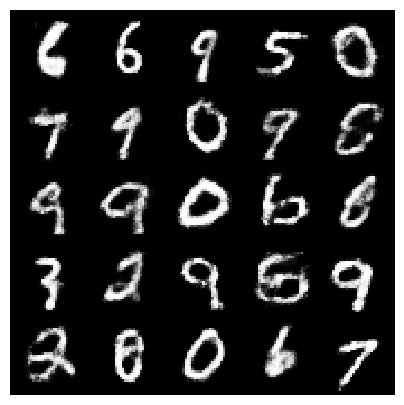

[Epoch 161/200] [Batch 655/938] [D loss: -0.872799] [G loss: -2.435936]


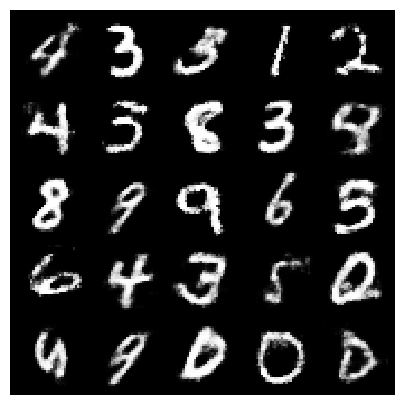

[Epoch 162/200] [Batch 215/938] [D loss: -0.905232] [G loss: -1.662989]


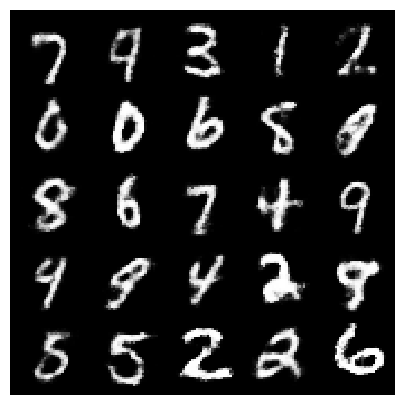

[Epoch 162/200] [Batch 715/938] [D loss: -0.959519] [G loss: -3.346759]


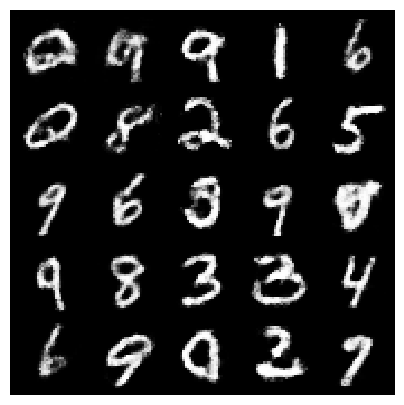

[Epoch 163/200] [Batch 275/938] [D loss: -0.847402] [G loss: -1.332539]


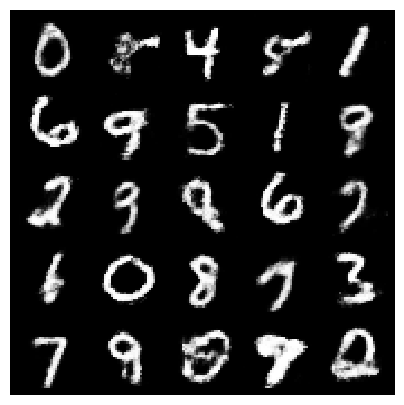

[Epoch 163/200] [Batch 775/938] [D loss: -0.731375] [G loss: -3.638592]


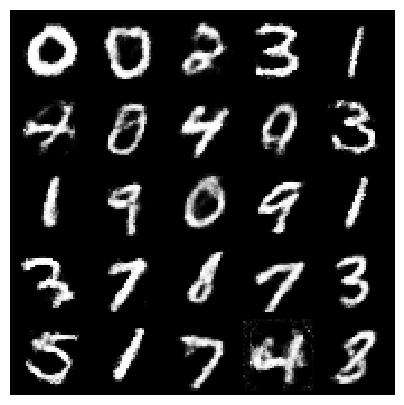

[Epoch 164/200] [Batch 335/938] [D loss: -0.210788] [G loss: -3.553104]


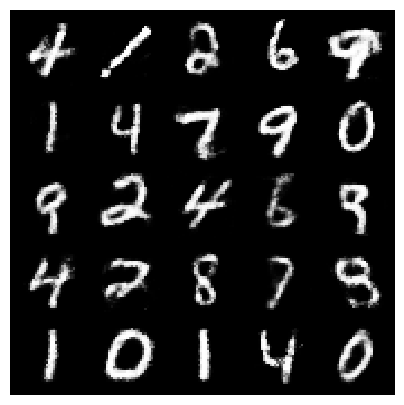

[Epoch 164/200] [Batch 835/938] [D loss: -0.330103] [G loss: -3.305907]


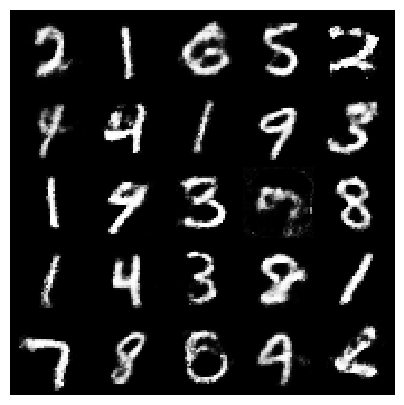

[Epoch 165/200] [Batch 395/938] [D loss: -0.883234] [G loss: -1.420988]


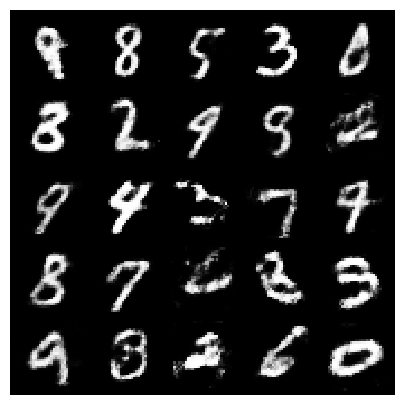

[Epoch 165/200] [Batch 895/938] [D loss: -0.870452] [G loss: -1.692536]


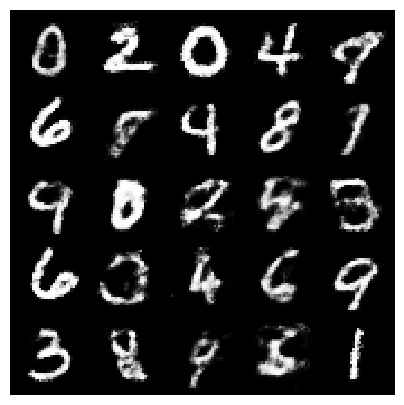

[Epoch 166/200] [Batch 455/938] [D loss: -0.826843] [G loss: -4.057845]


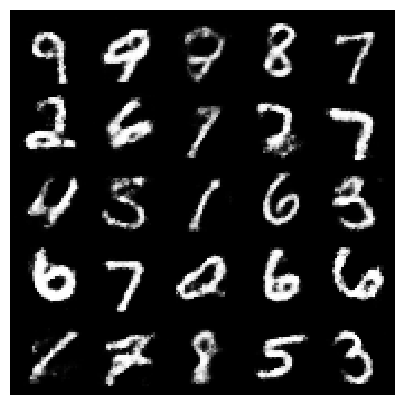

[Epoch 167/200] [Batch 15/938] [D loss: -0.696580] [G loss: -1.983421]


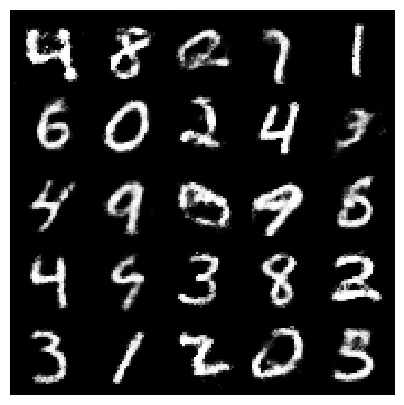

[Epoch 167/200] [Batch 515/938] [D loss: -1.010097] [G loss: -2.285483]


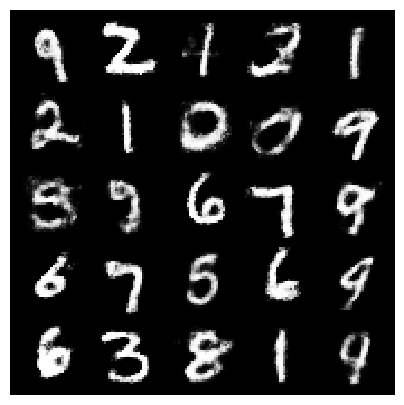

[Epoch 168/200] [Batch 75/938] [D loss: -1.022612] [G loss: -1.772200]


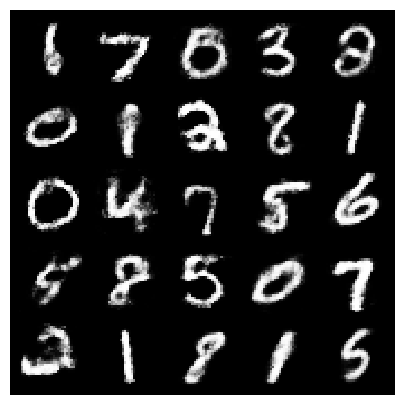

[Epoch 168/200] [Batch 575/938] [D loss: -0.599385] [G loss: -1.921674]


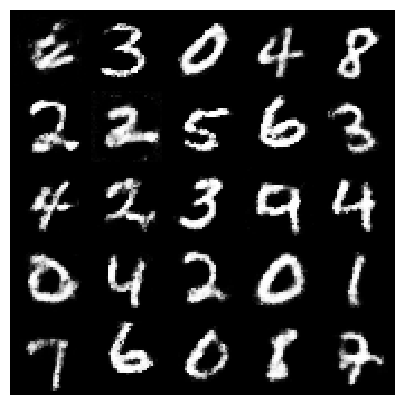

[Epoch 169/200] [Batch 135/938] [D loss: -0.506208] [G loss: -2.577899]


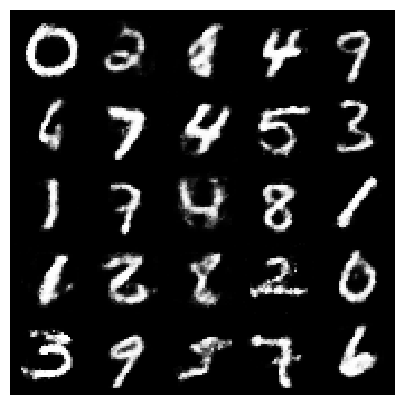

[Epoch 169/200] [Batch 635/938] [D loss: -1.171291] [G loss: -1.504277]


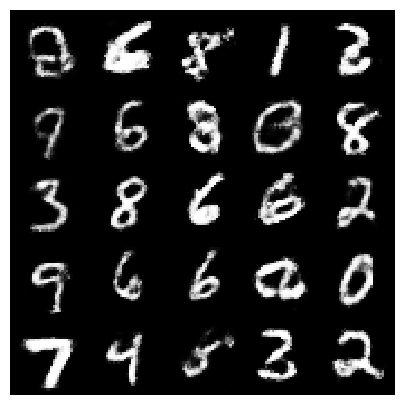

[Epoch 170/200] [Batch 195/938] [D loss: -0.994670] [G loss: -0.749310]


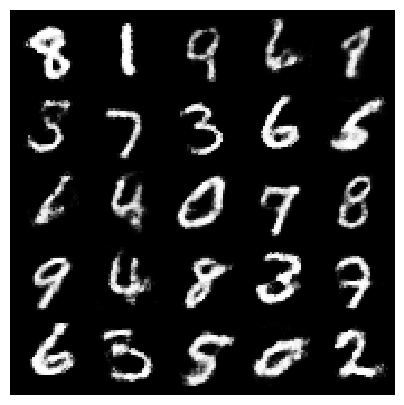

[Epoch 170/200] [Batch 695/938] [D loss: -0.896475] [G loss: -1.499497]


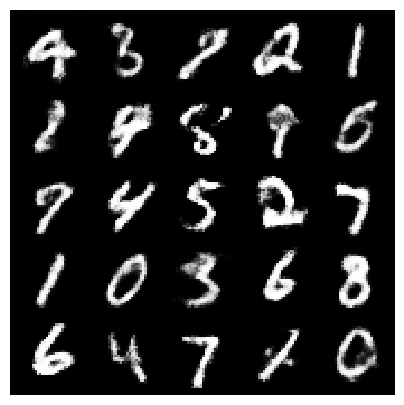

[Epoch 171/200] [Batch 255/938] [D loss: -0.732013] [G loss: -1.277893]


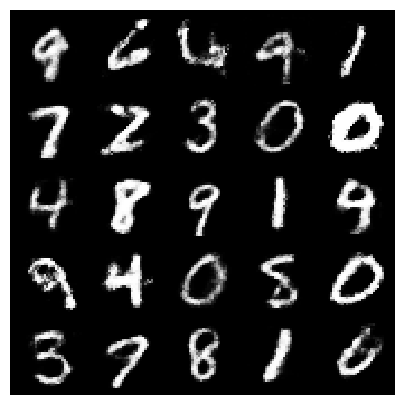

[Epoch 171/200] [Batch 755/938] [D loss: -0.853721] [G loss: -1.425455]


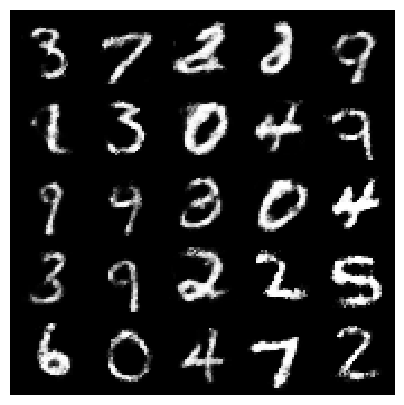

[Epoch 172/200] [Batch 315/938] [D loss: -1.089992] [G loss: -2.374650]


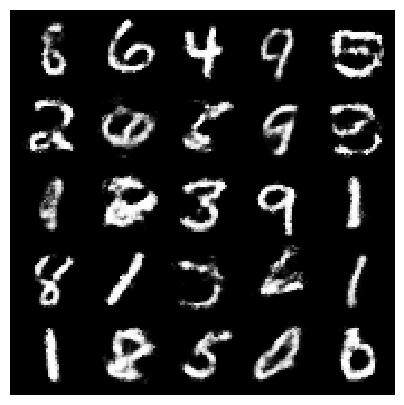

[Epoch 172/200] [Batch 815/938] [D loss: -0.680565] [G loss: -4.084702]


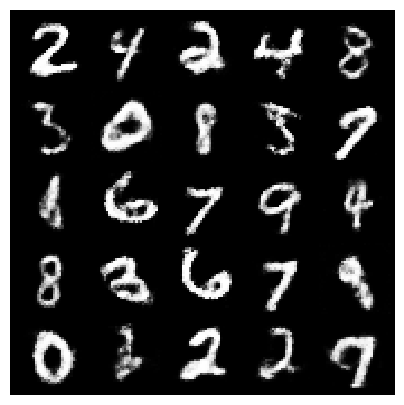

[Epoch 173/200] [Batch 375/938] [D loss: -0.396159] [G loss: -2.210962]


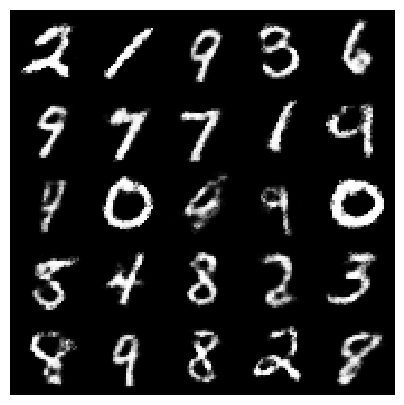

[Epoch 173/200] [Batch 875/938] [D loss: -0.325799] [G loss: -5.004222]


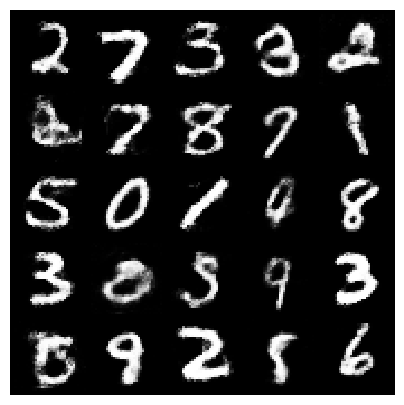

[Epoch 174/200] [Batch 435/938] [D loss: -0.747755] [G loss: -3.597688]


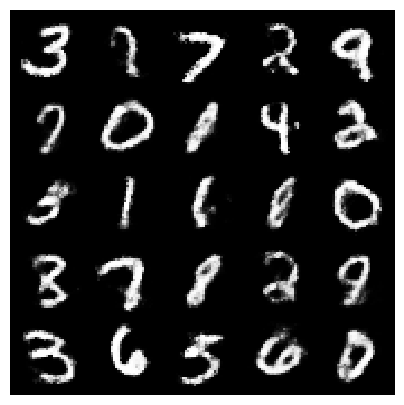

[Epoch 174/200] [Batch 935/938] [D loss: -0.457351] [G loss: -1.044517]


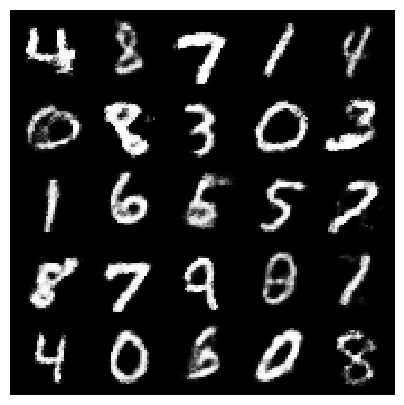

[Epoch 175/200] [Batch 495/938] [D loss: -0.725500] [G loss: -3.676280]


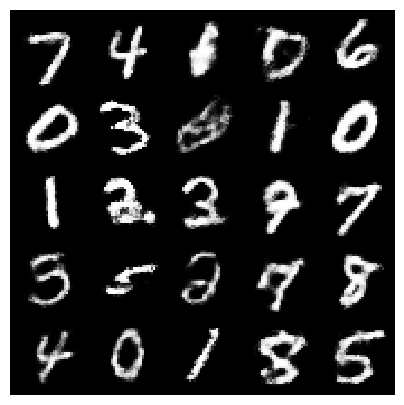

[Epoch 176/200] [Batch 55/938] [D loss: -0.690697] [G loss: -2.580120]


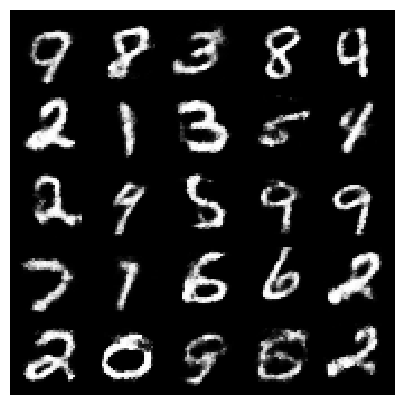

[Epoch 176/200] [Batch 555/938] [D loss: -0.411792] [G loss: -3.207169]


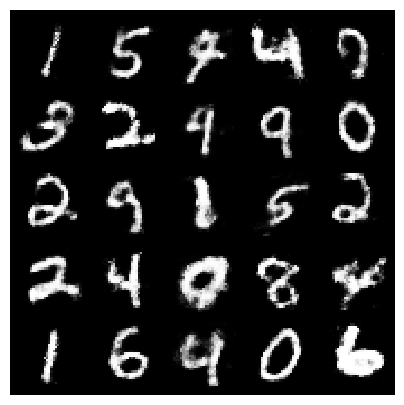

[Epoch 177/200] [Batch 115/938] [D loss: -0.408806] [G loss: -1.618963]


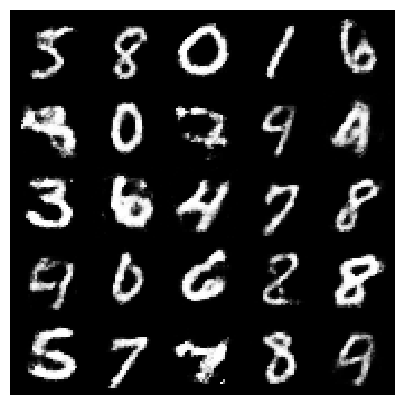

[Epoch 177/200] [Batch 615/938] [D loss: -1.076522] [G loss: -3.462856]


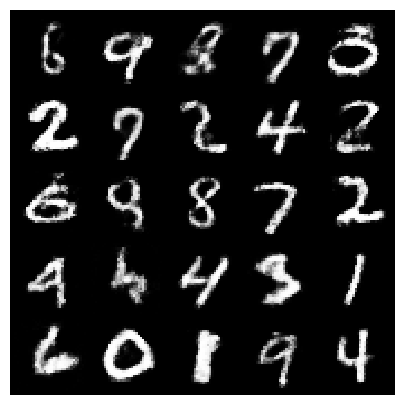

[Epoch 178/200] [Batch 175/938] [D loss: -0.486938] [G loss: -3.603161]


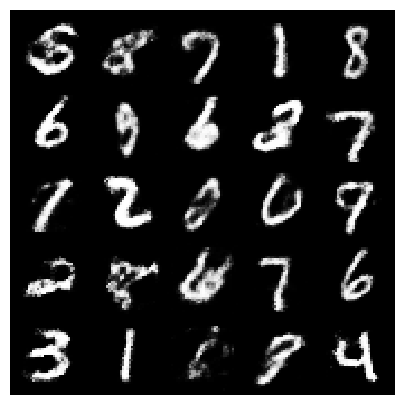

[Epoch 178/200] [Batch 675/938] [D loss: -0.731172] [G loss: -1.858222]


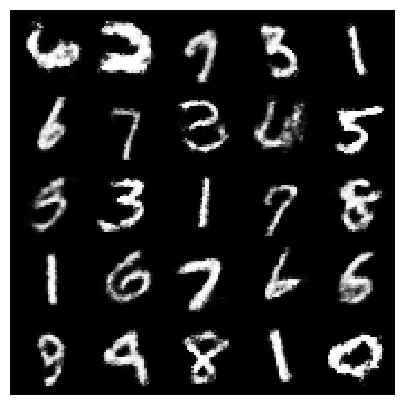

[Epoch 179/200] [Batch 235/938] [D loss: -0.213362] [G loss: -2.909112]


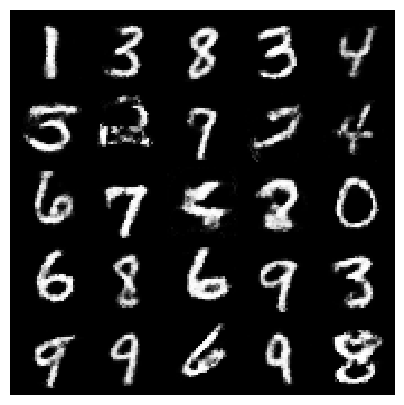

[Epoch 179/200] [Batch 735/938] [D loss: -0.823633] [G loss: -3.089951]


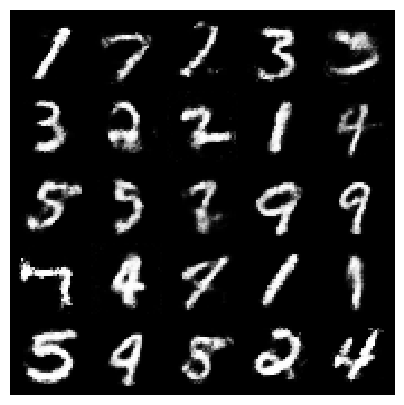

[Epoch 180/200] [Batch 295/938] [D loss: -0.836590] [G loss: -0.619211]


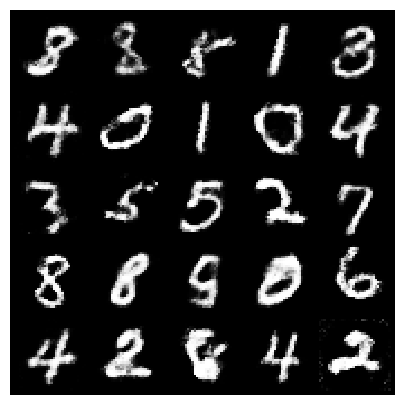

[Epoch 180/200] [Batch 795/938] [D loss: -0.983072] [G loss: -2.478511]


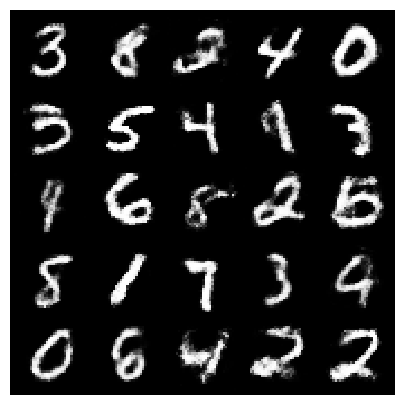

[Epoch 181/200] [Batch 355/938] [D loss: -0.639635] [G loss: -3.292961]


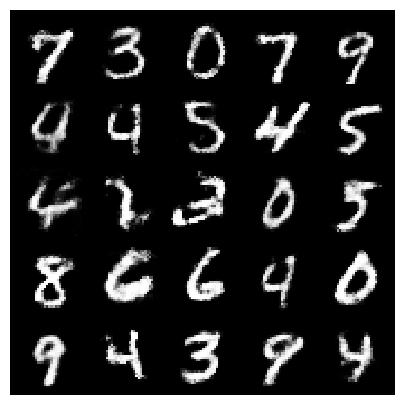

[Epoch 181/200] [Batch 855/938] [D loss: -0.814043] [G loss: -3.459430]


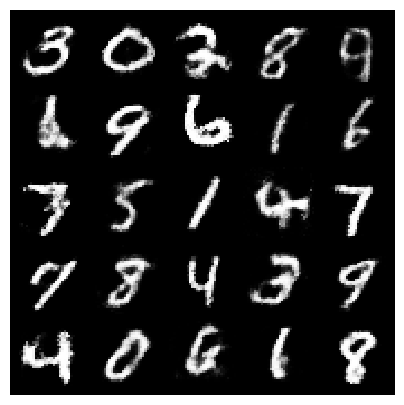

[Epoch 182/200] [Batch 415/938] [D loss: -0.484956] [G loss: -1.528131]


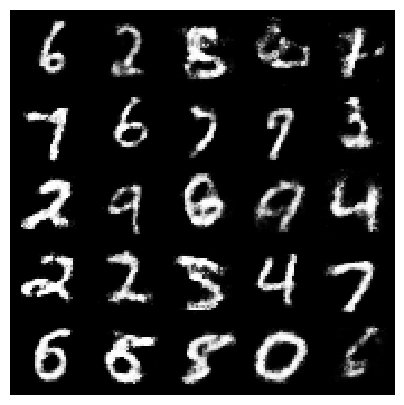

[Epoch 182/200] [Batch 915/938] [D loss: -0.875073] [G loss: -0.042742]


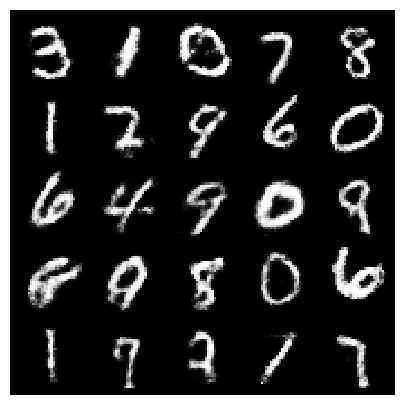

[Epoch 183/200] [Batch 475/938] [D loss: -0.286851] [G loss: -1.436648]


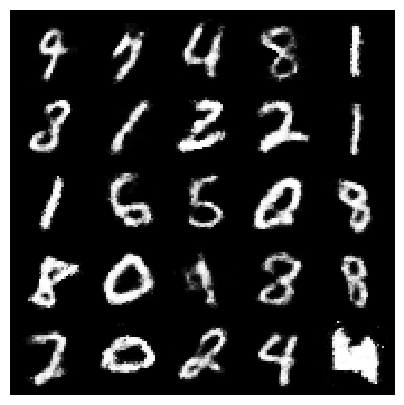

[Epoch 184/200] [Batch 35/938] [D loss: -0.665070] [G loss: -3.084737]


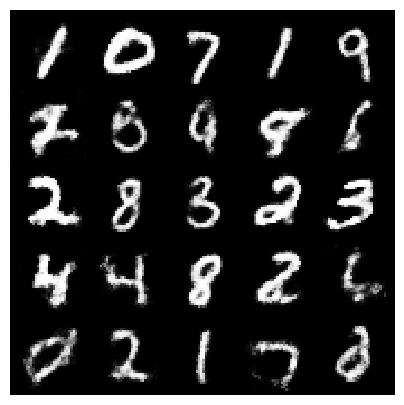

[Epoch 184/200] [Batch 535/938] [D loss: -0.838485] [G loss: -1.960689]


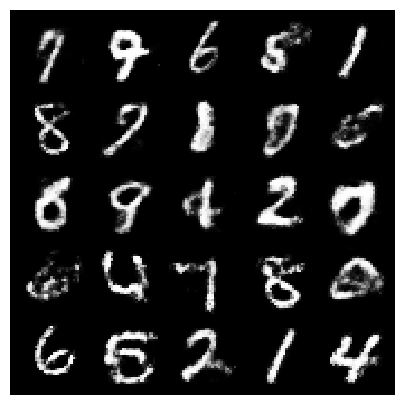

[Epoch 185/200] [Batch 95/938] [D loss: -0.259070] [G loss: -1.920379]


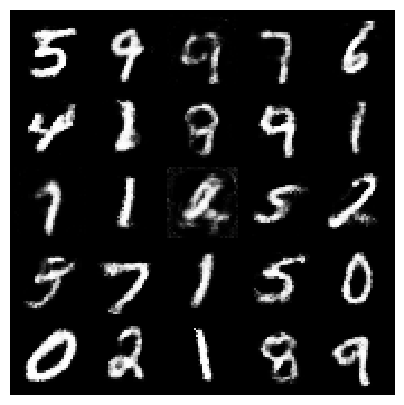

[Epoch 185/200] [Batch 595/938] [D loss: -0.758280] [G loss: -2.013164]


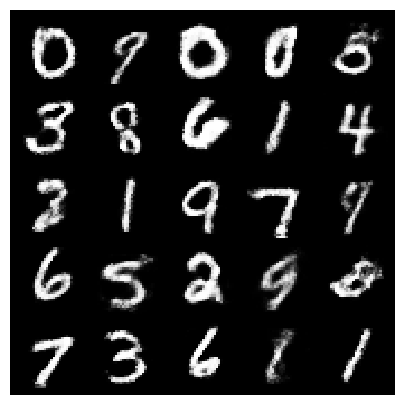

[Epoch 186/200] [Batch 155/938] [D loss: -0.835797] [G loss: -2.864054]


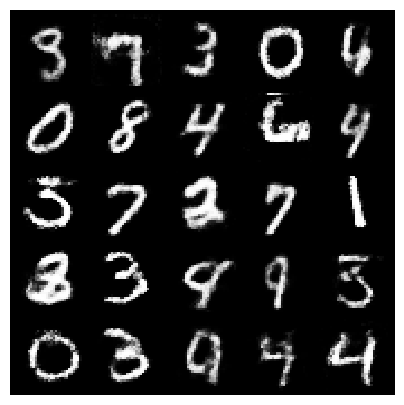

[Epoch 186/200] [Batch 655/938] [D loss: -0.866516] [G loss: -3.957383]


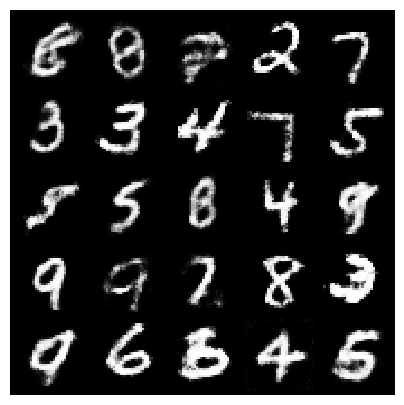

[Epoch 187/200] [Batch 215/938] [D loss: -0.804199] [G loss: -2.615294]


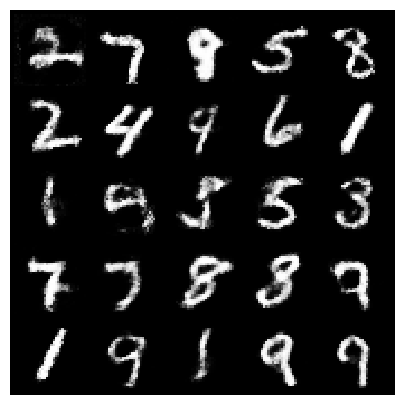

[Epoch 187/200] [Batch 715/938] [D loss: -0.739301] [G loss: -2.324047]


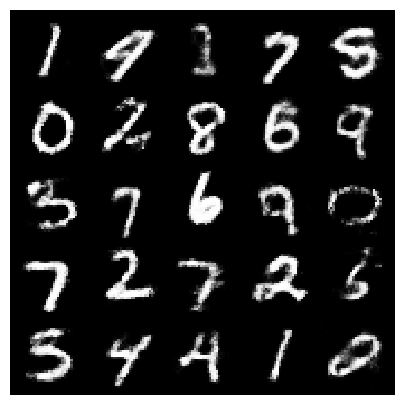

[Epoch 188/200] [Batch 275/938] [D loss: -0.891658] [G loss: -3.986255]


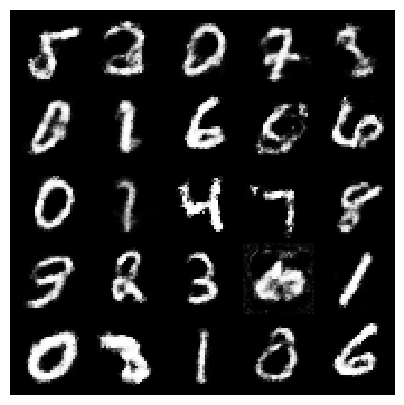

[Epoch 188/200] [Batch 775/938] [D loss: -0.828780] [G loss: -2.429125]


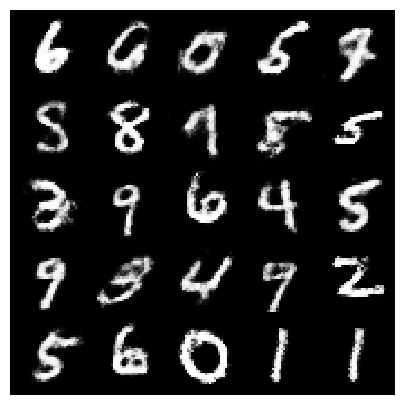

[Epoch 189/200] [Batch 335/938] [D loss: -0.271179] [G loss: -3.914124]


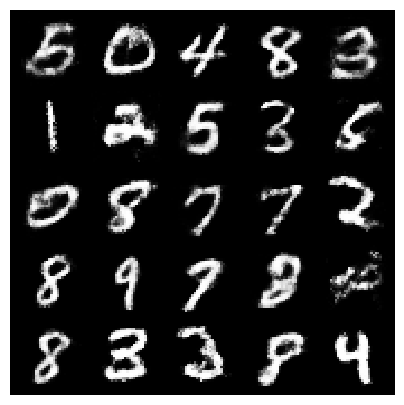

[Epoch 189/200] [Batch 835/938] [D loss: -0.760378] [G loss: -2.009555]


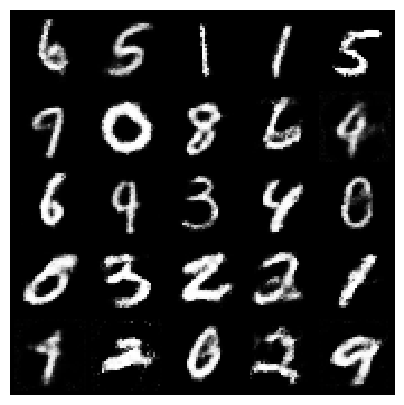

[Epoch 190/200] [Batch 395/938] [D loss: -0.559834] [G loss: -0.645017]


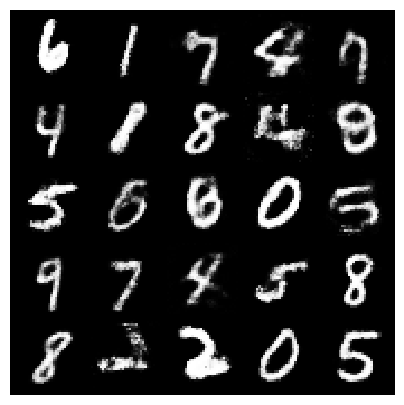

[Epoch 190/200] [Batch 895/938] [D loss: -0.575409] [G loss: -2.743528]


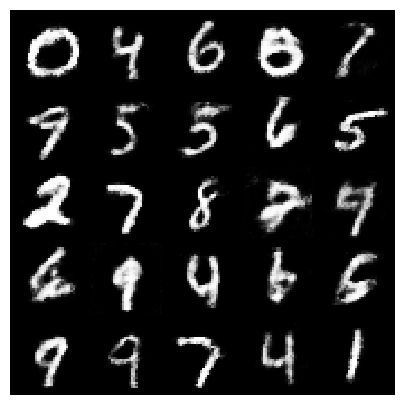

[Epoch 191/200] [Batch 455/938] [D loss: -0.623863] [G loss: -2.134016]


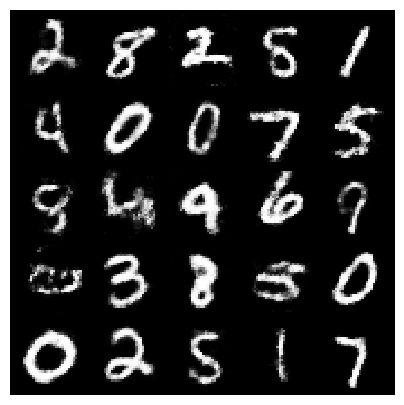

[Epoch 192/200] [Batch 15/938] [D loss: -0.530501] [G loss: -2.279410]


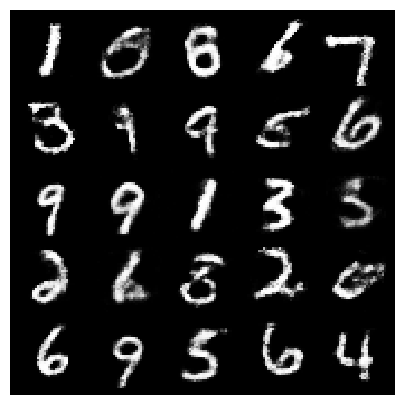

[Epoch 192/200] [Batch 515/938] [D loss: -1.153469] [G loss: -0.278481]


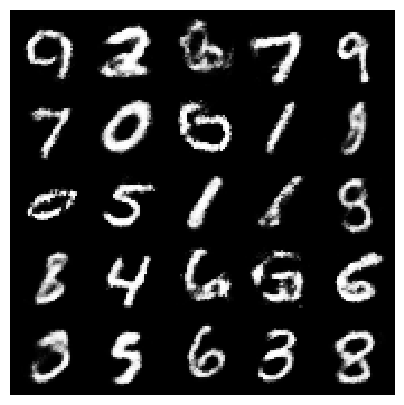

[Epoch 193/200] [Batch 75/938] [D loss: -0.476139] [G loss: -1.613422]


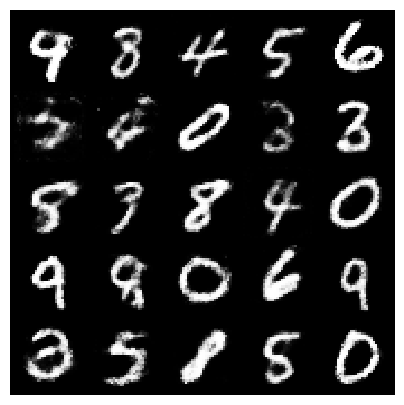

[Epoch 193/200] [Batch 575/938] [D loss: -1.009721] [G loss: -1.743874]


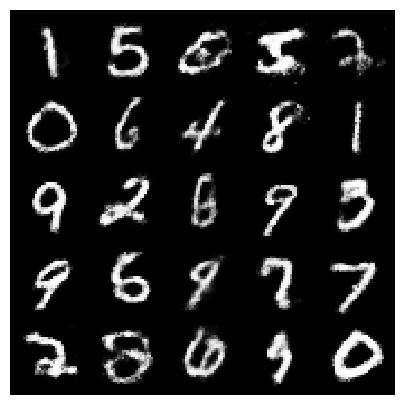

[Epoch 194/200] [Batch 135/938] [D loss: -0.482333] [G loss: -1.022828]


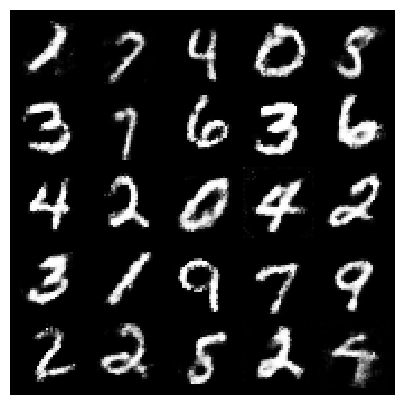

[Epoch 194/200] [Batch 635/938] [D loss: -0.530953] [G loss: -2.500401]


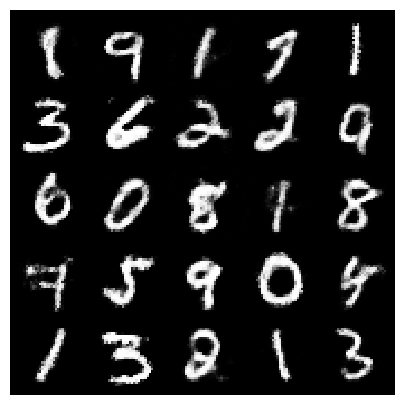

[Epoch 195/200] [Batch 195/938] [D loss: -0.999967] [G loss: -1.892952]


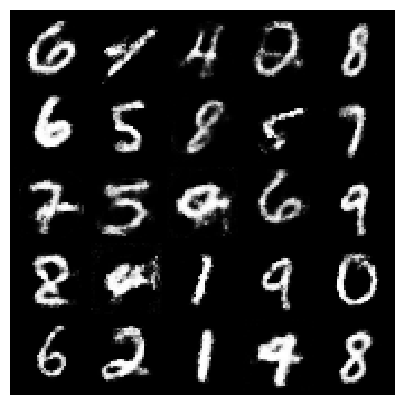

KeyboardInterrupt: ignored

In [11]:
batches_done = 0

for epoch in range(opt.n_epochs):
    for i, (imgs, _) in enumerate(dataloader):
        real_imgs = imgs.type(Tensor)

        optimizer_D.zero_grad()

        z = Tensor(np.random.normal(0, 1, (imgs.shape[0], opt.latent_dim)))

        fake_imgs = generator(z)

        real_validity = discriminator(real_imgs)
        fake_validity = discriminator(fake_imgs)

        gradient_penalty = compute_gradient_penalty(discriminator, real_imgs.data, fake_imgs.data)

        d_loss = -torch.mean(real_validity) + torch.mean(fake_validity) + lambda_gp * gradient_penalty

        d_loss.backward()
        optimizer_D.step()

        optimizer_G.zero_grad()

        if i % opt.n_critic == 0:

            fake_imgs = generator(z)

            fake_validity = discriminator(fake_imgs)
            g_loss = -torch.mean(fake_validity)

            g_loss.backward()

            optimizer_G.step()

            batches_done += opt.n_critic
            if batches_done % opt.sample_interval == 0:
                print(
                    "[Epoch %d/%d] [Batch %d/%d] [D loss: %f] [G loss: %f]"
                    % (epoch, opt.n_epochs, i, len(dataloader), d_loss.item(), g_loss.item())
                )
                save_image(fake_imgs.data[:25], "images/%d.png" % batches_done, nrow=5, normalize=True)
                plt.figure(figsize = (5,5))
                img1 = cv2.imread("images/%d.png" %batches_done)
                plt.imshow(img1, interpolation='nearest')
                plt.axis('off')
                plt.show()